## 1. Cargar el código desde github y preparar el entorno

Confirmamos que tenemos una GPU disponible

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Tue Jul  9 09:11:01 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   50C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

Confirmamos que tenemos alta capacidad de RAM, en caso contrario, el dataset PPI no funcionará correctamente.

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 54.8 gigabytes of available RAM

You are using a high-RAM runtime!


Clonamos el código del repositorio

In [ ]:
!git clone https://github.com/germanpadua/GCN-Pseudo-Riemannian-Manifold

Cloning into 'GCN-Pseudo-Riemannian-Manifold'...
remote: Enumerating objects: 951, done.
remote: Counting objects: 100% (16/16), done.
remote: Compressing objects: 100% (16/16), done.
remote: Total 951 (delta 3), reused 0 (delta 0), pack-reused 935
Receiving objects: 100% (951/951), 239.50 MiB | 15.14 MiB/s, done.
Resolving deltas: 100% (458/458), done.
Updating files: 100% (375/375), done.


Instalamos la versión 2.5 de networkx

In [ ]:
!pip install networkx==2.5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 17.6 MB/s eta 0:00:00
  Attempting uninstall: networkx
    Found existing installation: networkx 3.3
    Uninstalling networkx-3.3:
      Successfully uninstalled networkx-3.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.3.0+cu121 requires nvidia-cublas-cu12==12.1.3.1; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.0+cu121 requires nvidia-cuda-cupti-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.0+cu121 requires nvidia-cuda-nvrtc-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.0+cu121 requires nvidia-cuda-runtime-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.

Dejamos preparado el entorno para ejecutar y ver los resultados

In [ ]:
%cd GCN-Pseudo-Riemannian-Manifold

/content/GCN-Pseudo-Riemannian-Manifold


In [ ]:
import os

os.environ['LOG_DIR'] = '/content/logs'

In [ ]:
os.environ['DATAPATH'] = '/content/GCN-Pseudo-Riemannian-Manifold/data'

## 2. Ejecución

### Parámetros

Mostramos todos los parámetros con los que podemos ejecutar el código

In [ ]:
!python train.py -h

usage: train.py [-h] [--lr LR] [--dropout DROPOUT] [--cuda CUDA] [--epochs EPOCHS]
                [--weight-decay WEIGHT_DECAY] [--optimizer OPTIMIZER] [--momentum MOMENTUM]
                [--patience PATIENCE] [--seed SEED] [--log-freq LOG_FREQ] [--eval-freq EVAL_FREQ]
                [--save SAVE] [--save-dir SAVE_DIR] [--sweep-c SWEEP_C]
                [--lr-reduce-freq LR_REDUCE_FREQ] [--gamma GAMMA] [--print-epoch PRINT_EPOCH]
                [--grad-clip GRAD_CLIP] [--min-epochs MIN_EPOCHS] [--task TASK] [--model MODEL]
                [--dim DIM] [--manifold MANIFOLD] [--c C] [--r R] [--t T]
                [--pretrained-embeddings PRETRAINED_EMBEDDINGS] [--pos-weight POS_WEIGHT]
                [--num-layers NUM_LAYERS] [--bias BIAS] [--act ACT] [--n-heads N_HEADS]
                [--alpha ALPHA] [--double-precision DOUBLE_PRECISION] [--use-att USE_ATT]
                [--local-agg LOCAL_AGG] [--space_dim SPACE_DIM] [--time_dim TIME_DIM]
                [--dataset DATASET] [

### Funciones auxiliares

En este apartado definimos las funciones auxiliares que utilizaremos para hacer la búsqueda de hiperparámetros y mostrar los resultados

Función para hacer una búsqueda de hiperparámetros para el modelo, variedad, dataset y tarea especificados.

In [ ]:
import os
import subprocess
import re

def gridsearch(model, manifold, dataset, task, epochs):
    # Definir los valores posibles para cada hiperparámetro
    num_layers_options = [2, 3]
    weight_decay_options = [0, 1e-3]
    dropout_rate_options = [0, 0.2, 0.5]
    activation_options = ['relu', 'tanh', 'elu']

    if task == 'lp' and model == 'GCN':
        activation_options = ['None']

    cuda = '0'

    if dataset == 'ppi':
        cuda = '-1'



    # Generar todas las combinaciones posibles de hiperparámetros
    hyperparameter_combinations = [(num_layers, weight_decay, dropout, activation)
                                   for num_layers in num_layers_options
                                   for weight_decay in weight_decay_options
                                   for dropout in dropout_rate_options
                                   for activation in activation_options]

    # Definir el comando base
    base_command = (f"python train.py --task {task} --dataset {dataset} --cuda {cuda} "
                    f"--model {model} --manifold {manifold} --epochs {epochs} --log-freq {epochs}")


    # Función para ejecutar el comando con los hiperparámetros dados
    def run_experiment(num_layers, weight_decay, dropout, activation):
        command = (f"{base_command} --num-layers {num_layers} --weight-decay {weight_decay} "
                   f"--dropout {dropout} --act {activation}")
        result = subprocess.run(command, shell=True, capture_output=True, text=True)
        return result.stdout, result.stderr

    # Archivo para guardar los resultados
    results_file = f"grid_search_results_{task}_{model}_{manifold}_{dataset}.txt"

    # Ejecutar las combinaciones de hiperparámetros y guardar los resultados
    with open(results_file, "w") as file:
        for num_layers, weight_decay, dropout, activation in hyperparameter_combinations:
            print(f"Running experiment with num_layers={num_layers}, weight_decay={weight_decay}, "
                  f"dropout={dropout}, activation={activation}")
            stdout, stderr = run_experiment(num_layers, weight_decay, dropout, activation)

            # Escribir los resultados en el archivo
            file.write(f"Experiment with num_layers={num_layers}, weight_decay={weight_decay}, "
                       f"dropout={dropout}, activation={activation}\n")
            file.write(stdout)
            file.write(stderr)
            file.write("\n" + "="*80 + "\n")

    print("Grid search completed. Results are saved in", results_file)


Funciones para mostrar los mejores resultados de la búsqueda de hiperparámetros.

In [ ]:
import re

def show_best_results_lp(results_file, top_k):
  best_val_roc_params = []
  best_val_ap_params = []

  with open(results_file, "r") as file:
      content = file.read()
      experiments = content.split("\n" + "="*80 + "\n")
      for experiment in experiments:
          if "val_roc:" in experiment and "val_ap:" in experiment:
              val_roc = float(re.search(r"val_roc: ([0-9.]+)", experiment).group(1))
              val_ap = float(re.search(r"val_ap: ([0-9.]+)", experiment).group(1))
              params = re.search(r"Experiment with num_layers=.*", experiment).group(0)

              # Insertar en la lista de mejores ROC
              if len(best_val_roc_params) < top_k:
                  best_val_roc_params.append((val_roc, params))
              else:
                  if val_roc > min(best_val_roc_params, key=lambda x: x[0])[0]:
                      best_val_roc_params.append((val_roc, params))
                      best_val_roc_params = sorted(best_val_roc_params, key=lambda x: x[0], reverse=True)[:top_k]

              # Insertar en la lista de mejores AP
              if len(best_val_ap_params) < top_k:
                  best_val_ap_params.append((val_ap, params))
              else:
                  if val_ap > min(best_val_ap_params, key=lambda x: x[0])[0]:
                      best_val_ap_params.append((val_ap, params))
                      best_val_ap_params = sorted(best_val_ap_params, key=lambda x: x[0], reverse=True)[:top_k]

  # Imprimir los 5 mejores resultados basados en ROC
  print("Top 5 experiments based on validation ROC:")
  for val_roc, params in best_val_roc_params:
      print(f"Validation ROC: {val_roc} - {params}")

  # Imprimir los 5 mejores resultados basados en AP
  print("\nTop 5 experiments based on validation AP:")
  for val_ap, params in best_val_ap_params:
      print(f"Validation AP: {val_ap} - {params}")




def show_best_results_nc(results_file, top_k):
    best_val_acc_params = []
    best_val_f1_params = []

    with open(results_file, "r") as file:
        content = file.read()
        experiments = content.split("\n" + "="*80 + "\n")
        for experiment in experiments:
            if "val_acc:" in experiment and "val_f1:" in experiment:
                val_acc = float(re.search(r"val_acc: ([0-9.]+)", experiment).group(1))
                val_f1 = float(re.search(r"val_f1: ([0-9.]+)", experiment).group(1))
                params = re.search(r"Experiment with num_layers=.*", experiment).group(0)

                # Insertar en la lista de mejores ACC
                if len(best_val_acc_params) < top_k:
                    best_val_acc_params.append((val_acc, params))
                else:
                    if val_acc > min(best_val_acc_params, key=lambda x: x[0])[0]:
                        best_val_acc_params.append((val_acc, params))
                        best_val_acc_params = sorted(best_val_acc_params, key=lambda x: x[0], reverse=True)[:top_k]

                # Insertar en la lista de mejores F1
                if len(best_val_f1_params) < top_k:
                    best_val_f1_params.append((val_f1, params))
                else:
                    if val_f1 > min(best_val_f1_params, key=lambda x: x[0])[0]:
                        best_val_f1_params.append((val_f1, params))
                        best_val_f1_params = sorted(best_val_f1_params, key=lambda x: x[0], reverse=True)[:top_k]

    # Imprimir los top_k mejores resultados basados en ACC
    print(f"Top {top_k} experiments based on validation ACC:")
    for val_acc, params in best_val_acc_params:
        print(f"Validation ACC: {val_acc} - {params}")

    # Imprimir los top_k mejores resultados basados en F1
    print(f"\nTop {top_k} experiments based on validation F1:")
    for val_f1, params in best_val_f1_params:
        print(f"Validation F1: {val_f1} - {params}")


Funciones para mostrar la evolución de las métricas

In [ ]:
import matplotlib.pyplot as plt
import re

def plot_training_validation_metrics_nc(log_file):
    # Inicializar listas para almacenar los datos extraídos
    epochs = []
    train_loss = []
    train_acc = []
    train_f1 = []
    val_epochs = []  # Lista separada para épocas de validación
    val_loss = []
    val_acc = []
    val_f1 = []

    # Inicializar variables para almacenar los resultados finales
    final_val_loss = final_val_acc = final_val_f1 = final_test_loss = final_test_acc = final_test_f1 = None
    time_total = None

    # Leer el archivo de log
    with open(log_file, 'r') as file:
        log_text = file.read()
        lines = log_text.splitlines()
        for line in lines:
            # Extraer información de las épocas de entrenamiento
            if "Epoch:" in line and "val_loss:" not in line:
                epoch_info = re.findall(r"Epoch: (\d+).*lr: ([\d.]+).*train_loss: ([\d.]+).*train_acc: ([\d.]+).*train_f1: ([\d.]+).*time: ([\d.]+)s", line)
                if epoch_info:
                    epochs.append(int(epoch_info[0][0]))
                    train_loss.append(float(epoch_info[0][2]))
                    train_acc.append(float(epoch_info[0][3]))
                    train_f1.append(float(epoch_info[0][4]))
            # Extraer y alinear la información de validación con las épocas correspondientes
            elif "val_loss:" in line and "Epoch:" in line:
                val_info = re.findall(r"Epoch: (\d+).*val_loss: ([\d.]+) val_acc: ([\d.]+) val_f1: ([\d.]+)", line)
                if val_info:
                    val_epochs.append(int(val_info[0][0]))  # Asegurar alineación con las épocas de entrenamiento
                    val_loss.append(float(val_info[0][1]))
                    val_acc.append(float(val_info[0][2]))
                    val_f1.append(float(val_info[0][3]))
            # Extraer resultados finales de validación y prueba
            elif "Val set results:" in line:
                final_val_info = re.findall(r"val_loss: ([\d.]+) val_acc: ([\d.]+) val_f1: ([\d.]+)", line)
                if final_val_info:
                    final_val_loss = float(final_val_info[0][0])
                    final_val_acc = float(final_val_info[0][1])
                    final_val_f1 = float(final_val_info[0][2])
            elif "Test set results:" in line:
                final_test_info = re.findall(r"test_loss: ([\d.]+) test_acc: ([\d.]+) test_f1: ([\d.]+)", line)
                if final_test_info:
                    final_test_loss = float(final_test_info[0][0])
                    final_test_acc = float(final_test_info[0][1])
                    final_test_f1 = float(final_test_info[0][2])
            # Extraer el tiempo total de ejecución
            elif "Total time elapsed:" in line:
                time_total_info = re.findall(r"Total time elapsed: ([\d.]+)", line)
                if time_total_info:
                    time_total = float(time_total_info[0])

    # Asegúrate de que las épocas de entrenamiento y validación se alineen
    assert epochs == val_epochs, "Las listas de épocas de entrenamiento y validación no coinciden."

    # Crear gráficos
    plt.figure(figsize=(12, 8))

    # Gráfico de pérdida
    plt.subplot(3, 1, 1)
    plt.plot(epochs, train_loss, label='Train Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Gráfico de precisión
    plt.subplot(3, 1, 2)
    plt.plot(epochs, train_acc, label='Train Accuracy')
    plt.plot(epochs, val_acc, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Gráfico de puntuación F1
    plt.subplot(3, 1, 3)
    plt.plot(epochs, train_f1, label='Train F1 Score')
    plt.plot(epochs, val_f1, label='Validation F1 Score')
    plt.xlabel('Epochs')
    plt.ylabel('F1 Score')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Imprimir resultados finales
    print(f"Resultados del conjunto de validación:")
    print(f"- Pérdida (Loss): {final_val_loss}")
    print(f"- Precisión (Accuracy): {final_val_acc}")
    print(f"- Puntuación F1 (F1 Score): {final_val_f1}\n")

    print(f"Resultados del conjunto de prueba:")
    print(f"- Pérdida (Loss): {final_test_loss}")
    print(f"- Precisión (Accuracy): {final_test_acc}")
    print(f"- Puntuación F1 (F1 Score): {final_test_f1}")

    print(f"Tiempo total de ejecución: {time_total}s")


import matplotlib.pyplot as plt
import re

def plot_training_validation_metrics_lp(log_file):
        # Inicializar listas para almacenar los datos extraídos
    epochs = []
    train_loss = []
    train_roc = []
    train_ap = []
    val_epochs = []  # Lista separada para épocas de validación
    val_loss = []
    val_roc = []
    val_ap = []

    # Inicializar variables para resultados finales
    final_val_loss = None
    final_val_roc = None
    final_val_ap = None
    final_test_loss = None
    final_test_roc = None
    final_test_ap = None

    # Leer el archivo de log
    with open(log_file, 'r') as file:
        for line in file:
            # Extraer información de las épocas de entrenamiento
            if "Epoch:" in line and "val_loss:" not in line:
                epoch_info = re.findall(r"Epoch: (\d+).*lr: ([\d.]+).*train_loss: ([\d.]+).*train_roc: ([\d.]+).*train_ap: ([\d.]+).*time: ([\d.]+)s", line)
                if epoch_info:
                    epochs.append(int(epoch_info[0][0]))
                    train_loss.append(float(epoch_info[0][2]))
                    train_roc.append(float(epoch_info[0][3]))
                    train_ap.append(float(epoch_info[0][4]))
            # Extraer y alinear la información de validación con las épocas correspondientes
            elif "val_loss:" in line and "Epoch:" in line:
                val_info = re.findall(r"Epoch: (\d+).*val_loss: ([\d.]+) val_roc: ([\d.]+) val_ap: ([\d.]+)", line)
                if val_info:
                    val_epochs.append(int(val_info[0][0]))  # Asegurar alineación con las épocas de entrenamiento
                    val_loss.append(float(val_info[0][1]))
                    val_roc.append(float(val_info[0][2]))
                    val_ap.append(float(val_info[0][3]))
            # Extraer resultados finales de validación y prueba
            elif "Val set results:" in line:
                final_val_info = re.findall(r"val_loss: ([\d.]+) val_roc: ([\d.]+) val_ap: ([\d.]+)", line)
                if final_val_info:
                    final_val_loss = float(final_val_info[0][0])
                    final_val_roc = float(final_val_info[0][1])
                    final_val_ap = float(final_val_info[0][2])
            elif "Test set results:" in line:
                final_test_info = re.findall(r"test_loss: ([\d.]+) test_roc: ([\d.]+) test_ap: ([\d.]+)", line)
                if final_test_info:
                    final_test_loss = float(final_test_info[0][0])
                    final_test_roc = float(final_test_info[0][1])
                    final_test_ap = float(final_test_info[0][2])

    # Asegúrate de que las épocas de entrenamiento y validación se alineen
    assert epochs == val_epochs, "Las listas de épocas de entrenamiento y validación no coinciden."

    # Crear gráficos
    plt.figure(figsize=(12, 10))

    # Gráfico de pérdida
    plt.subplot(3, 1, 1)
    plt.plot(epochs, train_loss, label='Train Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Gráfico de ROC
    plt.subplot(3, 1, 2)
    plt.plot(epochs, train_roc, label='Train ROC')
    plt.plot(epochs, val_roc, label='Validation ROC')
    plt.xlabel('Epochs')
    plt.ylabel('ROC')
    plt.legend()

    # Gráfico de AP
    plt.subplot(3, 1, 3)
    plt.plot(epochs, train_ap, label='Train AP')
    plt.plot(epochs, val_ap, label='Validation AP')
    plt.xlabel('Epochs')
    plt.ylabel('AP')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Imprimir resultados finales
    print("Final Validation Results:")
    print(f"Validation Loss: {final_val_loss}")
    print(f"Validation ROC: {final_val_roc}")
    print(f"Validation AP: {final_val_ap}")
    print("\nFinal Test Results:")
    print(f"Test Loss: {final_test_loss}")
    print(f"Test ROC: {final_test_roc}")
    print(f"Test AP: {final_test_ap}")


Funciones para hacer los gráficos para comparar los resultados de predicción de enlaces

In [ ]:
import matplotlib.pyplot as plt
import re

def extract_metrics_from_log_lp(log_file):
    epochs = []
    train_loss = []
    train_roc = []
    train_ap = []
    val_epochs = []
    val_loss = []
    val_roc = []
    val_ap = []

    final_val_loss = final_val_roc = final_val_ap = None
    final_test_loss = final_test_roc = final_test_ap = None

    with open(log_file, 'r') as file:
        lines = file.read().splitlines()
        for line in lines:
            if "Epoch:" in line and "val_loss:" not in line:
                epoch_info = re.findall(r"Epoch: (\d+).*lr: ([\d.]+).*train_loss: ([\d.]+).*train_roc: ([\d.]+).*train_ap: ([\d.]+).*time: ([\d.]+)s", line)
                if epoch_info:
                    epochs.append(int(epoch_info[0][0]))
                    train_loss.append(float(epoch_info[0][2]))
                    train_roc.append(float(epoch_info[0][3]))
                    train_ap.append(float(epoch_info[0][4]))
            elif "val_loss:" in line and "Epoch:" in line:
                val_info = re.findall(r"Epoch: (\d+).*val_loss: ([\d.]+) val_roc: ([\d.]+) val_ap: ([\d.]+)", line)
                if val_info:
                    val_epochs.append(int(val_info[0][0]))
                    val_loss.append(float(val_info[0][1]))
                    val_roc.append(float(val_info[0][2]))
                    val_ap.append(float(val_info[0][3]))
            elif "Val set results:" in line:
                final_val_info = re.findall(r"val_loss: ([\d.]+) val_roc: ([\d.]+) val_ap: ([\d.]+)", line)
                if final_val_info:
                    final_val_loss = float(final_val_info[0][0])
                    final_val_roc = float(final_val_info[0][1])
                    final_val_ap = float(final_val_info[0][2])
            elif "Test set results:" in line:
                final_test_info = re.findall(r"test_loss: ([\d.]+) test_roc: ([\d.]+) test_ap: ([\d.]+)", line)
                if final_test_info:
                    final_test_loss = float(final_test_info[0][0])
                    final_test_roc = float(final_test_info[0][1])
                    final_test_ap = float(final_test_info[0][2])

    assert epochs == val_epochs, "Las listas de épocas de entrenamiento y validación no coinciden."

    return {
        "epochs": epochs,
        "train_loss": train_loss,
        "train_roc": train_roc,
        "train_ap": train_ap,
        "val_loss": val_loss,
        "val_roc": val_roc,
        "val_ap": val_ap,
        "final_val_loss": final_val_loss,
        "final_val_roc": final_val_roc,
        "final_val_ap": final_val_ap,
        "final_test_loss": final_test_loss,
        "final_test_roc": final_test_roc,
        "final_test_ap": final_test_ap
    }



def compare_models_lp(log_files, model_names):
    metrics = [extract_metrics_from_log_lp(log_file) for log_file in log_files]

    # Encontrar la longitud máxima de épocas entre todos los modelos
    max_epochs = max(len(metric["epochs"]) for metric in metrics)

    epochs = range(1, max_epochs + 1)

    plt.figure(figsize=(12, 8))

    # Gráfico de pérdida de entrenamiento
    plt.subplot(2, 2, 1)
    for metric, model_name in zip(metrics, model_names):
        plt.plot(epochs[:len(metric["train_loss"])], metric["train_loss"], label=f'Train Loss {model_name}')
    plt.xlabel('Epochs')
    plt.ylabel('Train Loss')
    plt.legend()

    # Gráfico de ROC de entrenamiento
    plt.subplot(2, 2, 3)
    for metric, model_name in zip(metrics, model_names):
        plt.plot(epochs[:len(metric["train_roc"])], metric["train_roc"], label=f'Train AUC {model_name}')
    plt.xlabel('Epochs')
    plt.ylabel('Train AUC')
    plt.legend()

    # Gráfico de pérdida de validación
    plt.subplot(2, 2, 2)
    for metric, model_name in zip(metrics, model_names):
        plt.plot(epochs[:len(metric["val_loss"])], metric["val_loss"], label=f'Validation Loss {model_name}')
    plt.xlabel('Epochs')
    plt.ylabel('Validation Loss')
    plt.legend()

    # Gráfico de ROC de validación
    plt.subplot(2, 2, 4)
    for metric, model_name in zip(metrics, model_names):
        plt.plot(epochs[:len(metric["val_roc"])], metric["val_roc"], label=f'Validation AUC {model_name}')
    plt.xlabel('Epochs')
    plt.ylabel('Validation AUC')
    plt.legend()

    plt.tight_layout()
    plt.show()

    for metric, model_name in zip(metrics, model_names):
        print(f"Resultados finales del modelo {model_name}:")
        print(f"Conjunto de validación - Pérdida (Loss): {metric['final_val_loss']}, ROC: {metric['final_val_roc']}, AP: {metric['final_val_ap']}")
        print(f"Conjunto de prueba - Pérdida (Loss): {metric['final_test_loss']}, ROC: {metric['final_test_roc']}, AP: {metric['final_test_ap']}")
        print("\n")

Funciones para hacer los gráficos para comparar los resultados de clasificación de nodos

In [ ]:
import matplotlib.pyplot as plt
import re

def extract_metrics_from_log_nc(log_file):
    epochs = []
    train_loss = []
    train_acc = []
    train_f1 = []
    val_epochs = []
    val_loss = []
    val_acc = []
    val_f1 = []

    final_val_loss = final_val_acc = final_val_f1 = None
    final_test_loss = final_test_acc = final_test_f1 = None

    with open(log_file, 'r') as file:
        lines = file.read().splitlines()
        for line in lines:
            if "Epoch:" in line and "val_loss:" not in line:
                epoch_info = re.findall(r"Epoch: (\d+).*lr: ([\d.]+).*train_loss: ([\d.]+).*train_acc: ([\d.]+).*train_f1: ([\d.]+).*time: ([\d.]+)s", line)
                if epoch_info:
                    epochs.append(int(epoch_info[0][0]))
                    train_loss.append(float(epoch_info[0][2]))
                    train_acc.append(float(epoch_info[0][3]))
                    train_f1.append(float(epoch_info[0][4]))
            elif "val_loss:" in line and "Epoch:" in line:
                val_info = re.findall(r"Epoch: (\d+).*val_loss: ([\d.]+) val_acc: ([\d.]+) val_f1: ([\d.]+)", line)
                if val_info:
                    val_epochs.append(int(val_info[0][0]))
                    val_loss.append(float(val_info[0][1]))
                    val_acc.append(float(val_info[0][2]))
                    val_f1.append(float(val_info[0][3]))
            elif "Val set results:" in line:
                final_val_info = re.findall(r"val_loss: ([\d.]+) val_acc: ([\d.]+) val_f1: ([\d.]+)", line)
                if final_val_info:
                    final_val_loss = float(final_val_info[0][0])
                    final_val_acc = float(final_val_info[0][1])
                    final_val_f1 = float(final_val_info[0][2])
            elif "Test set results:" in line:
                final_test_info = re.findall(r"test_loss: ([\d.]+) test_acc: ([\d.]+) test_f1: ([\d.]+)", line)
                if final_test_info:
                    final_test_loss = float(final_test_info[0][0])
                    final_test_acc = float(final_test_info[0][1])
                    final_test_f1 = float(final_test_info[0][2])

    assert epochs == val_epochs, "Las listas de épocas de entrenamiento y validación no coinciden."

    return {
        "epochs": epochs,
        "train_loss": train_loss,
        "train_acc": train_acc,
        "train_f1": train_f1,
        "val_loss": val_loss,
        "val_acc": val_acc,
        "val_f1": val_f1,
        "final_val_loss": final_val_loss,
        "final_val_acc": final_val_acc,
        "final_val_f1": final_val_f1,
        "final_test_loss": final_test_loss,
        "final_test_acc": final_test_acc,
        "final_test_f1": final_test_f1
    }

def compare_models_nc(log_files, model_names):
    metrics = [extract_metrics_from_log_nc(log_file) for log_file in log_files]

    # Encontrar la longitud máxima de épocas entre todos los modelos
    max_epochs = max(len(metric["epochs"]) for metric in metrics)

    epochs = range(1, max_epochs + 1)

    plt.figure(figsize=(12, 8))

    # Gráfico de pérdida de entrenamiento
    plt.subplot(2, 2, 1)
    for metric, model_name in zip(metrics, model_names):
        plt.plot(epochs[:len(metric["train_loss"])], metric["train_loss"], label=f'Train Loss {model_name}')
    plt.xlabel('Epochs')
    plt.ylabel('Train Loss')
    plt.legend()

    # Gráfico de puntuación F1 de entrenamiento
    plt.subplot(2, 2, 3)
    for metric, model_name in zip(metrics, model_names):
        plt.plot(epochs[:len(metric["train_f1"])], metric["train_f1"], label=f'Train F1 Score {model_name}')
    plt.xlabel('Epochs')
    plt.ylabel('Train F1 Score')
    plt.legend()

    # Gráfico de pérdida de validación
    plt.subplot(2, 2, 2)
    for metric, model_name in zip(metrics, model_names):
        plt.plot(epochs[:len(metric["val_loss"])], metric["val_loss"], label=f'Validation Loss {model_name}')
    plt.xlabel('Epochs')
    plt.ylabel('Validation Loss')
    plt.legend()

    # Gráfico de puntuación F1 de validación
    plt.subplot(2, 2, 4)
    for metric, model_name in zip(metrics, model_names):
        plt.plot(epochs[:len(metric["val_f1"])], metric["val_f1"], label=f'Validation F1 Score {model_name}')
    plt.xlabel('Epochs')
    plt.ylabel('Validation F1 Score')
    plt.legend()

    plt.tight_layout()
    plt.show()

    for metric, model_name in zip(metrics, model_names):
        print(f"Resultados finales del modelo {model_name}:")
        print(f"Conjunto de validación - Pérdida (Loss): {metric['final_val_loss']}, Precisión (Accuracy): {metric['final_val_acc']}, Puntuación F1 (F1 Score): {metric['final_val_f1']}")
        print(f"Conjunto de prueba - Pérdida (Loss): {metric['final_test_loss']}, Precisión (Accuracy): {metric['final_test_acc']}, Puntuación F1 (F1 Score): {metric['final_test_f1']}")
        print("\n")

Funciones para mostrar los resultados finales sobre el conjunto de test en predicción de enlaces

In [ ]:
def extract_final_metrics_from_log_lp(log_file):
    final_val_loss = final_val_roc = final_val_ap = None
    final_test_loss = final_test_roc = final_test_ap = None
    total_time = None

    with open(log_file, 'r') as file:
        lines = file.read().splitlines()
        for line in lines:
            if "Val set results:" in line:
                final_val_info = re.findall(r"val_loss: ([\d.]+) val_roc: ([\d.]+) val_ap: ([\d.]+)", line)
                if final_val_info:
                    final_val_loss = float(final_val_info[0][0])
                    final_val_roc = float(final_val_info[0][1])
                    final_val_ap = float(final_val_info[0][2])
            elif "Test set results:" in line:
                final_test_info = re.findall(r"test_loss: ([\d.]+) test_roc: ([\d.]+) test_ap: ([\d.]+)", line)
                if final_test_info:
                    final_test_loss = float(final_test_info[0][0])
                    final_test_roc = float(final_test_info[0][1])
                    final_test_ap = float(final_test_info[0][2])
            elif "Total time elapsed:" in line:
                time_info = re.findall(r"Total time elapsed: ([\d.]+)", line)
                if time_info:
                    total_time = float(time_info[0])

    return {
        "final_val_loss": final_val_loss,
        "final_val_roc": final_val_roc,
        "final_val_ap": final_val_ap,
        "final_test_loss": final_test_loss,
        "final_test_roc": final_test_roc,
        "final_test_ap": final_test_ap,
        "total_time": total_time
    }


In [ ]:
def create_results_lp_table():
    datasets = {
        "cora": [0, 1, 2],
        "citeseer": [3, 4, 5],
        "disease_nc": [6, 7, 8],
        "photo": [9, 10, 11],
        "airport": [12, 13, 14],
        "ppi": [15, 16, 17]
    }
    models = ["QGCN", "GCN", "GAT"]
    base_path = "/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/"

    results = []

    for dataset, indices in datasets.items():
        for model, index in zip(models, indices):
            log_file = f"{base_path}{index}/log.txt"
            metrics = extract_final_metrics_from_log_lp(log_file)
            results.append([
                dataset,
                model,
                metrics["final_val_loss"],
                metrics["final_val_roc"],
                metrics["final_val_ap"],
                metrics["final_test_loss"],
                metrics["final_test_roc"],
                metrics["final_test_ap"],
                metrics["total_time"]
            ])

    df = pd.DataFrame(results, columns=[
        "Dataset",
        "Model",
        "Validation Loss",
        "Validation ROC",
        "Validation AP",
        "Test Loss",
        "Test ROC",
        "Test AP",
        "Total Time (s)"
    ])

    return df




Funciones para mostrar los resultados finales sobre el conjunto de test en clasificación de nodos

In [ ]:
def extract_final_metrics_from_log_nc(log_file):
    final_val_loss = final_val_acc = final_val_f1 = None
    final_test_loss = final_test_acc = final_test_f1 = None
    total_time = None

    with open(log_file, 'r') as file:
        lines = file.read().splitlines()
        for line in lines:
            if "Val set results:" in line:
                final_val_info = re.findall(r"val_loss: ([\d.]+) val_acc: ([\d.]+) val_f1: ([\d.]+)", line)
                if final_val_info:
                    final_val_loss = float(final_val_info[0][0])
                    final_val_acc = float(final_val_info[0][1])
                    final_val_f1 = float(final_val_info[0][2])
            elif "Test set results:" in line:
                final_test_info = re.findall(r"test_loss: ([\d.]+) test_acc: ([\d.]+) test_f1: ([\d.]+)", line)
                if final_test_info:
                    final_test_loss = float(final_test_info[0][0])
                    final_test_acc = float(final_test_info[0][1])
                    final_test_f1 = float(final_test_info[0][2])
            elif "Total time elapsed:" in line:
                time_info = re.findall(r"Total time elapsed: ([\d.]+)", line)
                if time_info:
                    total_time = float(time_info[0])

    return {
        "final_val_loss": final_val_loss,
        "final_val_acc": final_val_acc,
        "final_val_f1": final_val_f1,
        "final_test_loss": final_test_loss,
        "final_test_acc": final_test_acc,
        "final_test_f1": final_test_f1,
        "total_time": total_time
    }


In [ ]:
def create_results_nc_table():
    datasets = {
        "cora": [0, 1, 2],
        "citeseer": [3, 4, 5],
        "disease_nc": [6, 7, 8],
        "photo": [9, 10, 11],
        "airport": [12, 13, 14],
        "ppi": [15, 16, 17]
    }
    models = ["QGCN", "GCN", "GAT"]
    base_path = "/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/"

    results = []

    for dataset, indices in datasets.items():
        for model, index in zip(models, indices):
            log_file = f"{base_path}{index}/log.txt"
            metrics = extract_final_metrics_from_log_nc(log_file)
            results.append([
                dataset,
                model,
                metrics["final_val_loss"],
                metrics["final_val_acc"],
                metrics["final_val_f1"],
                metrics["final_test_loss"],
                metrics["final_test_acc"],
                metrics["final_test_f1"],
                metrics["total_time"]
            ])

    df = pd.DataFrame(results, columns=[
        "Dataset",
        "Model",
        "Validation Loss",
        "Validation Accuracy",
        "Validation F1",
        "Test Loss",
        "Test Accuracy",
        "Test F1",
        "Total Time (s)"
    ])

    return df


### Link Prediction


#### Cora

##### QGCN (HGCN y PseudoHyperboloid)

###### GridSearch

In [ ]:
gridsearch('HGCN', 'PseudoHyperboloid', 'cora', 'lp', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_lp("grid_search_results_lp_HGCN_PseudoHyperboloid_cora.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.9339 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Validation ROC: 0.9334 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Validation ROC: 0.9325 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=tanh
Validation ROC: 0.9297 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=elu
Validation ROC: 0.9294 - Experiment with num_layers=3, weight_decay=0, dropout=0.2, activation=tanh

Top 5 experiments based on validation AP:
Validation AP: 0.9246 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Validation AP: 0.9241 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Validation AP: 0.9237 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=tanh
Validation AP: 0.9227 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=tanh
Valid

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset cora --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 2 --weight-decay 0 --dropout 0.5 --act elu

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 2708
INFO:root:Number of features: 1433
INFO:root:Number of training edges: 4488
INFO:root:Number of false training edges: 3663498
INFO:root:Number of validation edges: 263
INFO:root:Number of false validation edges: 263
INFO:root:Number of test edges: 527
INFO:root:Number of false test edges: 527
INFO:root:LPModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=1434, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1.], 

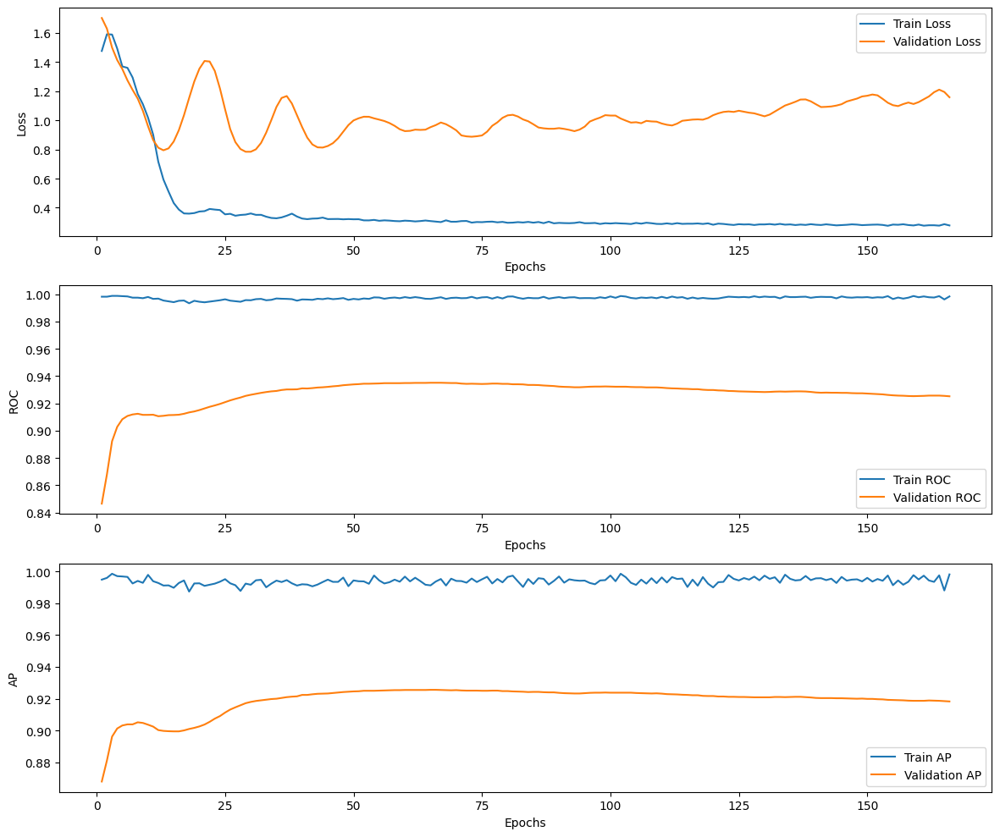

Final Validation Results:
Validation Loss: 0.9673
Validation ROC: 0.9351
Validation AP: 0.9256

Final Test Results:
Test Loss: 1.0412
Test ROC: 0.9333
Test AP: 0.9279


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/0/log.txt")

###### Ejecución optimizador RiemannianAdam

In [ ]:
!python train.py --task lp --dataset cora --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 2 --weight-decay 0 --dropout 0.5 --act elu --optimizer RiemannianAdam --epochs 200

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 2708
INFO:root:Number of features: 1433
INFO:root:Number of training edges: 4488
INFO:root:Number of false training edges: 3663498
INFO:root:Number of validation edges: 263
INFO:root:Number of false validation edges: 263
INFO:root:Number of test edges: 527
INFO:root:Number of false test edges: 527
INFO:root:LPModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=1434, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1.], 

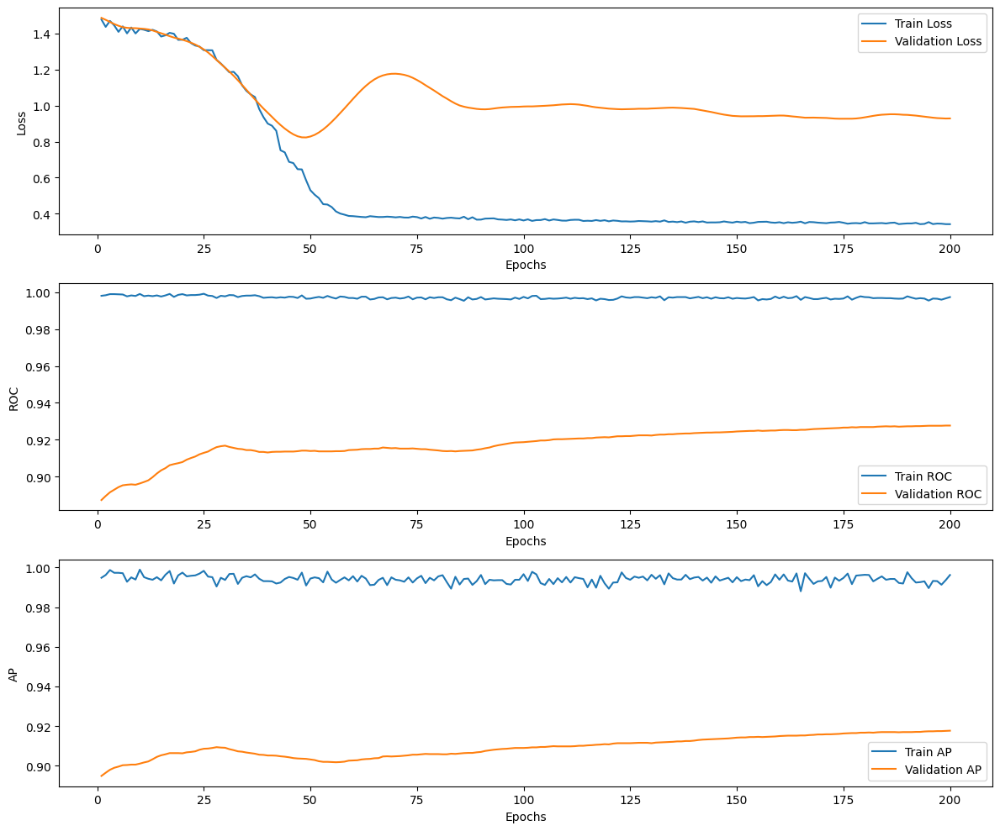

Final Validation Results:
Validation Loss: 0.9284
Validation ROC: 0.9277
Validation AP: 0.9177

Final Test Results:
Test Loss: 0.959
Test ROC: 0.9331
Test AP: 0.9224


In [ ]:
plot_training_validation_metrics_lp("/content/logs/lp/2024_7_9/2/log.txt")

##### GCN y Euclidean

###### GridSearch

In [ ]:
gridsearch('GCN', 'Euclidean', 'cora', 'lp', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=None
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=None
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0.2, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0.5, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0.5, acti

In [ ]:
show_best_results_lp("grid_search_results_lp_GCN_Euclidean_cora.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.9276 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=None
Validation ROC: 0.9267 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=None
Validation ROC: 0.9213 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=None
Validation ROC: 0.9211 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=None
Validation ROC: 0.9211 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=None

Top 5 experiments based on validation AP:
Validation AP: 0.9198 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=None
Validation AP: 0.9166 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=None
Validation AP: 0.9163 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=None
Validation AP: 0.9153 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=None
Valida

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset cora --cuda 0 --model GCN --manifold Euclidean --num-layers 2 --weight-decay 0 --dropout 0 --act None

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 2708
INFO:root:Number of features: 1433
INFO:root:Number of training edges: 4488
INFO:root:Number of false training edges: 3663498
INFO:root:Number of validation edges: 263
INFO:root:Number of false validation edges: 263
INFO:root:Number of test edges: 527
INFO:root:Number of false test edges: 527
INFO:root:LPModel(
  (encoder): GCN(
    (layers): Sequential(
      (0): GraphConvolution(
        input_dim=1433, output_dim=128
        (linear): Linear(in_features=1433, out_features=128, bias=True)
      )
      (1): GraphConvolution(
        input_dim=128, out

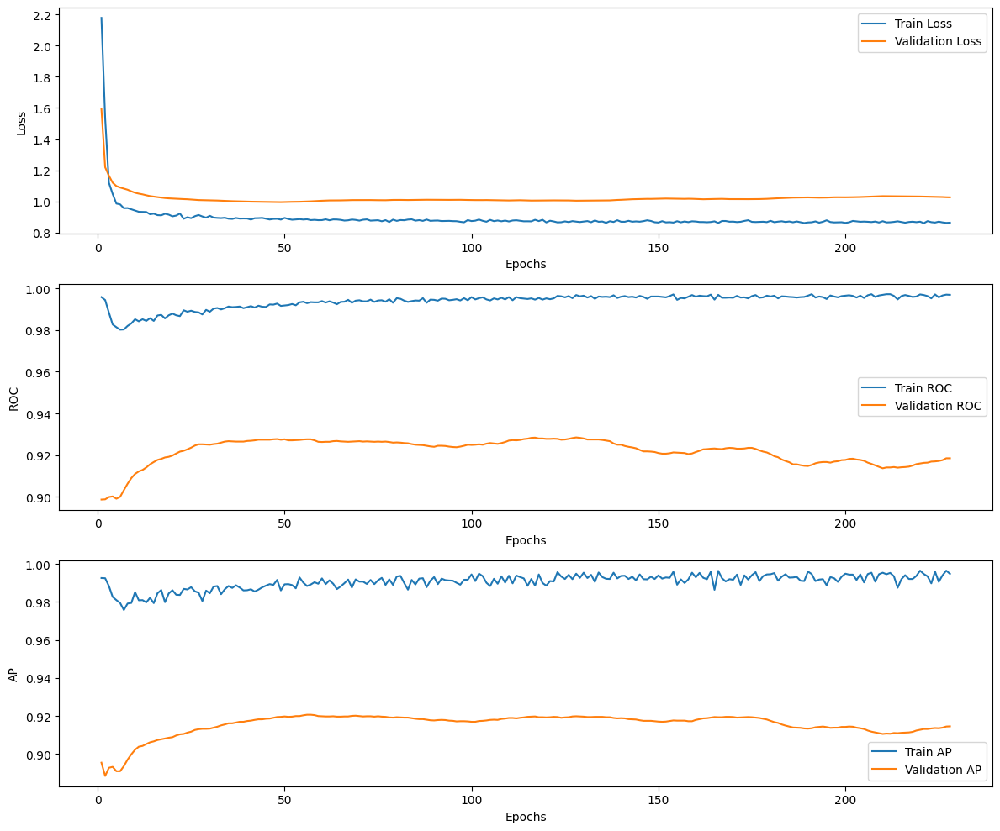

Final Validation Results:
Validation Loss: 1.0047
Validation ROC: 0.9285
Validation AP: 0.9199

Final Test Results:
Test Loss: 1.0132
Test ROC: 0.9224
Test AP: 0.9242


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/1/log.txt")

##### GAT y Euclidean

###### GridSearch

In [ ]:
gridsearch('GAT', 'Euclidean', 'cora', 'lp', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_lp("grid_search_results_lp_GAT_Euclidean_cora.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.9378 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Validation ROC: 0.9367 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Validation ROC: 0.9308 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Validation ROC: 0.9294 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Validation ROC: 0.9292 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu

Top 5 experiments based on validation AP:
Validation AP: 0.9274 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Validation AP: 0.9272 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Validation AP: 0.9195 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Validation AP: 0.9173 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Validation AP: 0

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset cora --cuda 0 --model GAT --manifold Euclidean --num-layers 2 --weight-decay 0.001 --dropout 0 --act elu

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 2708
INFO:root:Number of features: 1433
INFO:root:Number of training edges: 4488
INFO:root:Number of false training edges: 3663498
INFO:root:Number of validation edges: 263
INFO:root:Number of false validation edges: 263
INFO:root:Number of test edges: 527
INFO:root:Number of false test edges: 527
INFO:root:LPModel(
  (encoder): GAT(
    (layers): Sequential(
      (0): GraphAttentionLayer(
        (attention_0): SpGraphAttentionLayer (1433 -> 32)
        (attention_1): SpGraphAttentionLayer (1433 -> 32)
        (attention_2): SpGraphAttentionLayer (1433 -> 3

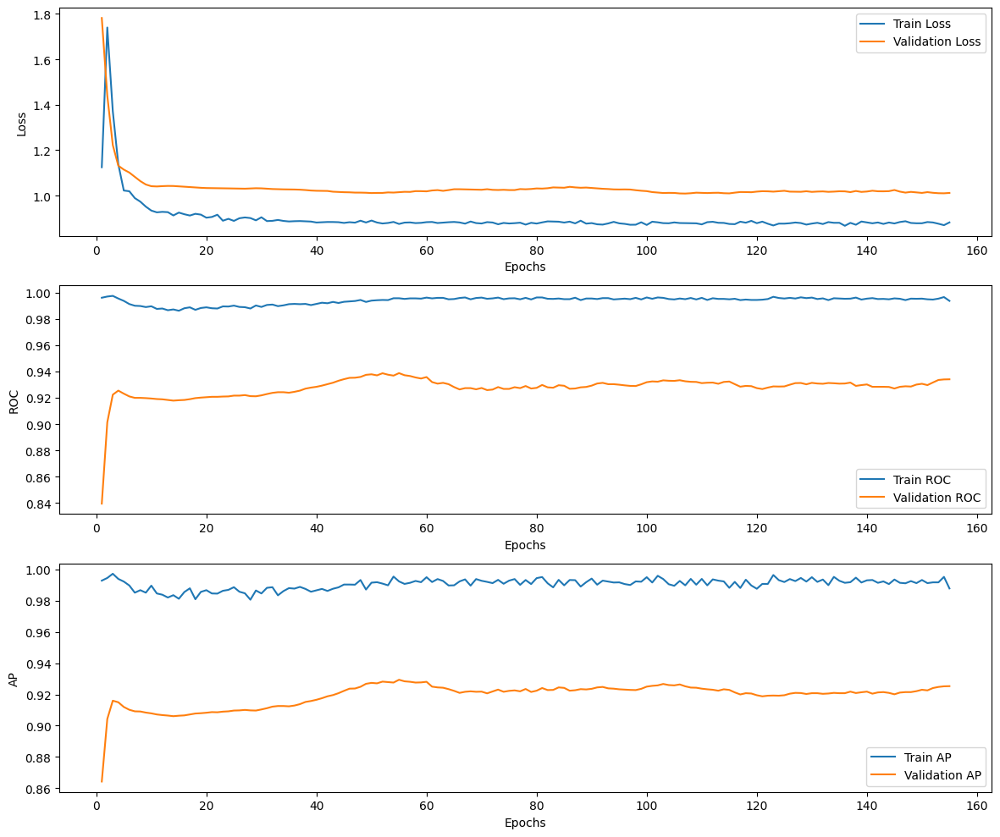

Final Validation Results:
Validation Loss: 1.015
Validation ROC: 0.9387
Validation AP: 0.9294

Final Test Results:
Test Loss: 0.9937
Test ROC: 0.9338
Test AP: 0.928


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/2/log.txt")

#### Citeseer

##### QGCN (HGCN y PseudoHyperboloid)

###### GridSearch

In [ ]:
gridsearch('HGCN', 'PseudoHyperboloid', 'citeseer', 'lp', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_lp("grid_search_results_lp_HGCN_PseudoHyperboloid_citeseer.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.95 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Validation ROC: 0.9481 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Validation ROC: 0.9475 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Validation ROC: 0.9474 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Validation ROC: 0.9472 - Experiment with num_layers=3, weight_decay=0, dropout=0.5, activation=tanh

Top 5 experiments based on validation AP:
Validation AP: 0.9567 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Validation AP: 0.9559 - Experiment with num_layers=3, weight_decay=0, dropout=0.5, activation=tanh
Validation AP: 0.9554 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Validation AP: 0.9549 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Validation AP: 0.9541 - E

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset citeseer --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 2 --weight-decay 0 --dropout 0 --act tanh

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 3327
INFO:root:Number of features: 3703
INFO:root:Number of training edges: 3976
INFO:root:Number of false training edges: 5532152
INFO:root:Number of validation edges: 233
INFO:root:Number of false validation edges: 233
INFO:root:Number of test edges: 467
INFO:root:Number of false test edges: 467
INFO:root:LPModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=3704, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1.], 

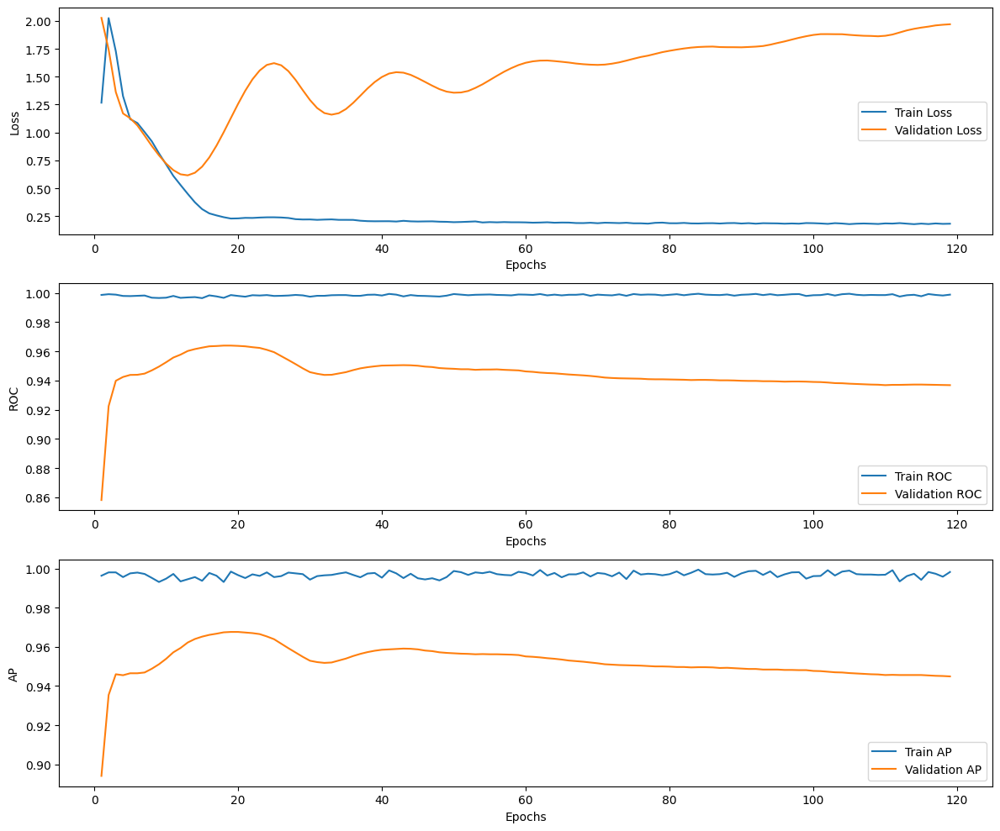

Final Validation Results:
Validation Loss: 1.1294
Validation ROC: 0.964
Validation AP: 0.9676

Final Test Results:
Test Loss: 1.1387
Test ROC: 0.9561
Test AP: 0.9474


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/3/log.txt")

###### Ejecución optimizador RiemannianAdam

In [ ]:
!python train.py --task lp --dataset citeseer --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 2 --weight-decay 0 --dropout 0 --act tanh --epochs 200 --optimizer RiemannianAdam

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 3327
INFO:root:Number of features: 3703
INFO:root:Number of training edges: 3976
INFO:root:Number of false training edges: 5532152
INFO:root:Number of validation edges: 233
INFO:root:Number of false validation edges: 233
INFO:root:Number of test edges: 467
INFO:root:Number of false test edges: 467
INFO:root:LPModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=3704, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1.], 

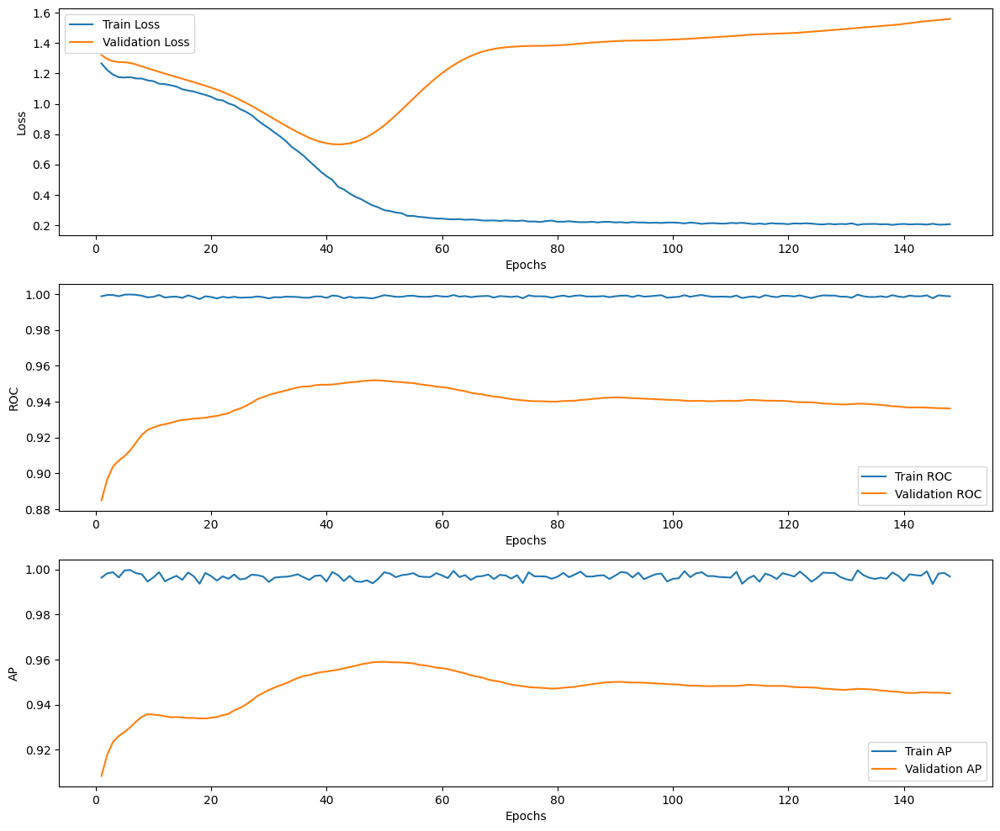

Final Validation Results:
Validation Loss: 0.8036
Validation ROC: 0.9519
Validation AP: 0.9588

Final Test Results:
Test Loss: 0.8269
Test ROC: 0.944
Test AP: 0.9388


In [ ]:
plot_training_validation_metrics_lp("/content/logs/lp/2024_7_9/3/log.txt")

##### GCN y Euclidean

###### GridSearch

In [ ]:
gridsearch('GCN', 'Euclidean', 'citeseer', 'lp', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=None
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=None
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0.2, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0.5, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0.5, acti

In [ ]:
show_best_results_lp("grid_search_results_lp_GCN_Euclidean_citeseer.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.9491 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=None
Validation ROC: 0.9489 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=None
Validation ROC: 0.9449 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=None
Validation ROC: 0.9435 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=None
Validation ROC: 0.9411 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=None

Top 5 experiments based on validation AP:
Validation AP: 0.9526 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=None
Validation AP: 0.9585 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=None
Validation AP: 0.9534 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=None
Validation AP: 0.9524 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=None
Validati

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset citeseer --cuda 0 --model GCN --manifold Euclidean --num-layers 2 --weight-decay 0 --dropout 0.2 --act None

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 3327
INFO:root:Number of features: 3703
INFO:root:Number of training edges: 3976
INFO:root:Number of false training edges: 5532152
INFO:root:Number of validation edges: 233
INFO:root:Number of false validation edges: 233
INFO:root:Number of test edges: 467
INFO:root:Number of false test edges: 467
INFO:root:LPModel(
  (encoder): GCN(
    (layers): Sequential(
      (0): GraphConvolution(
        input_dim=3703, output_dim=128
        (linear): Linear(in_features=3703, out_features=128, bias=True)
      )
      (1): GraphConvolution(
        input_dim=128, out

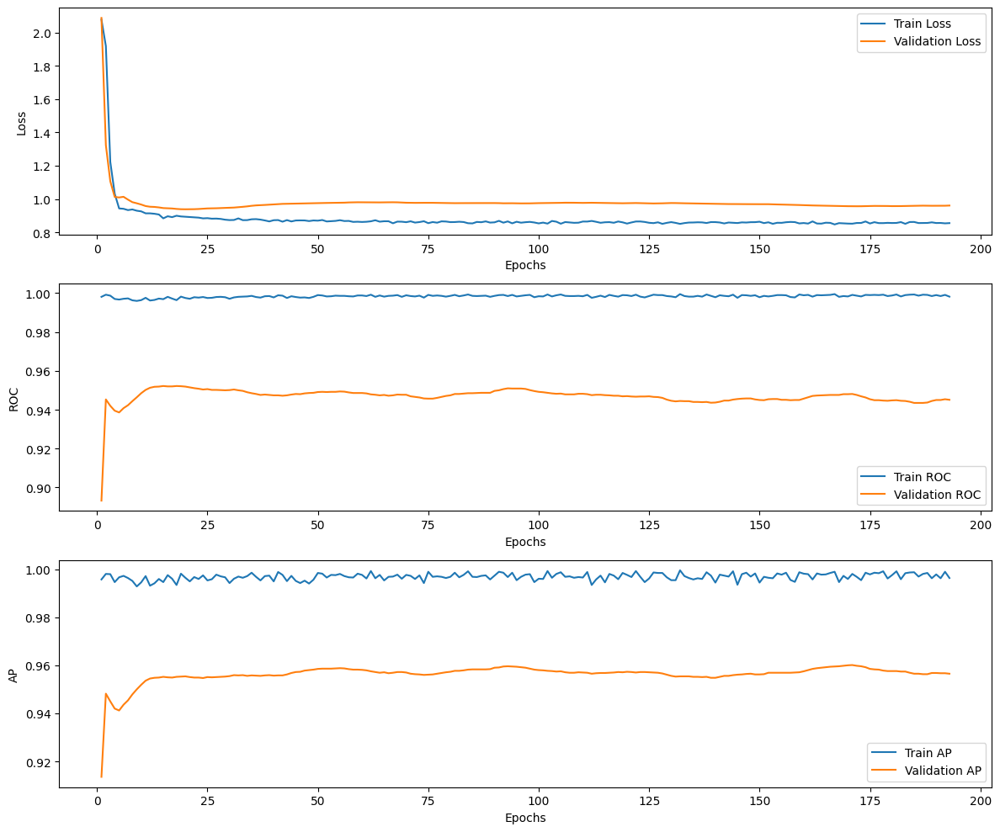

Final Validation Results:
Validation Loss: 0.9742
Validation ROC: 0.951
Validation AP: 0.9596

Final Test Results:
Test Loss: 0.9819
Test ROC: 0.9405
Test AP: 0.9409


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/4/log.txt")

##### GAT y Euclidean

###### GridSearch

In [ ]:
gridsearch('GAT', 'Euclidean', 'citeseer', 'lp', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_lp("grid_search_results_lp_GAT_Euclidean_citeseer.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.9611 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=relu
Validation ROC: 0.9541 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Validation ROC: 0.9511 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Validation ROC: 0.949 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Validation ROC: 0.949 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu

Top 5 experiments based on validation AP:
Validation AP: 0.9639 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=relu
Validation AP: 0.9583 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Validation AP: 0.955 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Validation AP: 0.9544 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Validation AP: 0.9536 

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset citeseer --cuda 0 --model GAT --manifold Euclidean --num-layers 2 --weight-decay 0.001 --dropout 0.2 --act relu

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 3327
INFO:root:Number of features: 3703
INFO:root:Number of training edges: 3976
INFO:root:Number of false training edges: 5532152
INFO:root:Number of validation edges: 233
INFO:root:Number of false validation edges: 233
INFO:root:Number of test edges: 467
INFO:root:Number of false test edges: 467
INFO:root:LPModel(
  (encoder): GAT(
    (layers): Sequential(
      (0): GraphAttentionLayer(
        (attention_0): SpGraphAttentionLayer (3703 -> 32)
        (attention_1): SpGraphAttentionLayer (3703 -> 32)
        (attention_2): SpGraphAttentionLayer (3703 -> 3

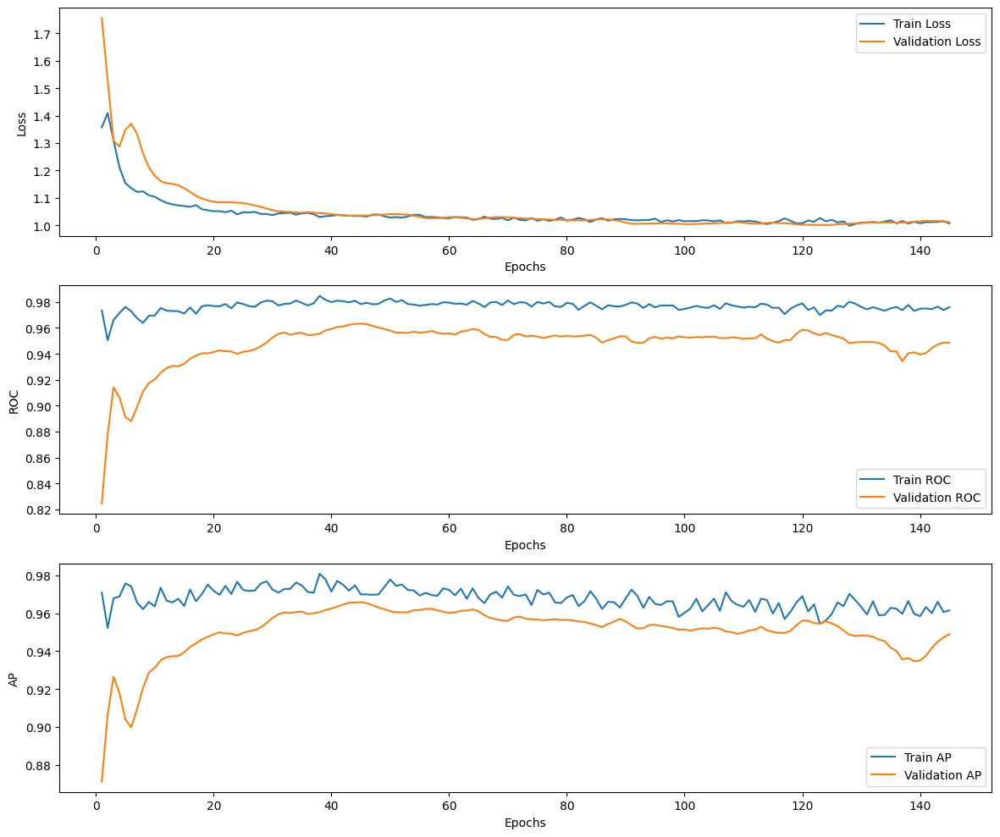

Final Validation Results:
Validation Loss: 1.0358
Validation ROC: 0.9633
Validation AP: 0.9658

Final Test Results:
Test Loss: 1.0652
Test ROC: 0.948
Test AP: 0.9376


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/5/log.txt")

#### Disease LP

##### QGCN (HGCN y PseudoHyperboloid)

###### GridSearch

In [ ]:
gridsearch('HGCN', 'PseudoHyperboloid', 'disease_lp', 'lp', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_lp("grid_search_results_lp_HGCN_PseudoHyperboloid_disease_lp.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.7687 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation ROC: 0.7504 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=relu
Validation ROC: 0.7379 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Validation ROC: 0.7368 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=relu
Validation ROC: 0.729 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu

Top 5 experiments based on validation AP:
Validation AP: 0.666 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation AP: 0.65 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=relu
Validation AP: 0.6355 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Validation AP: 0.6306 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=relu
Validation

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset disease_lp --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 3 --weight-decay 0.001 --dropout 0 --act relu

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 2665
INFO:root:Number of features: 11
INFO:root:Number of training edges: 2265
INFO:root:Number of false training edges: 3550180
INFO:root:Number of validation edges: 133
INFO:root:Number of false validation edges: 133
INFO:root:Number of test edges: 266
INFO:root:Number of false test edges: 266
INFO:root:LPModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=12, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1.], devi

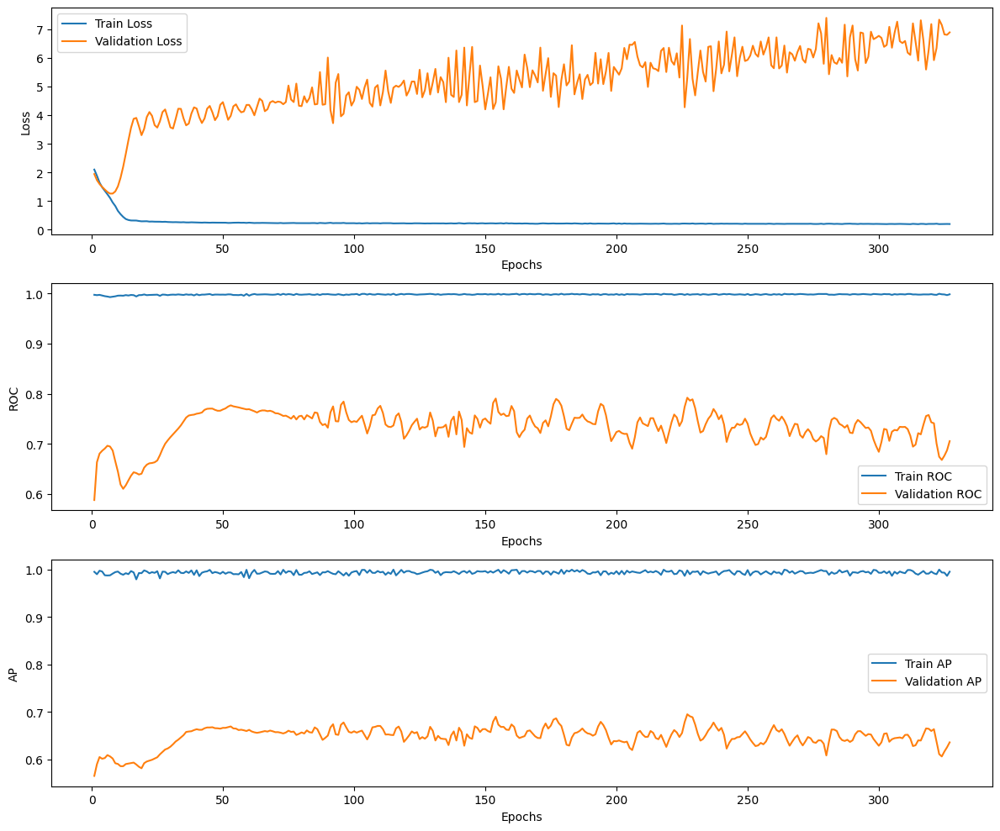

Final Validation Results:
Validation Loss: 5.3153
Validation ROC: 0.7921
Validation AP: 0.6946

Final Test Results:
Test Loss: 5.2789
Test ROC: 0.8101
Test AP: 0.7426


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/6/log.txt")

###### Ejecución optimizador RiemannianAdam

In [ ]:
!python train.py --task lp --dataset disease_lp --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 3 --weight-decay 0.001 --dropout 0 --act relu--epochs 400 --optimizer RiemannianAdam

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 3327
INFO:root:Number of features: 3703
INFO:root:Number of training edges: 3976
INFO:root:Number of false training edges: 5532152
INFO:root:Number of validation edges: 233
INFO:root:Number of false validation edges: 233
INFO:root:Number of test edges: 467
INFO:root:Number of false test edges: 467
INFO:root:LPModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=3704, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1.], 

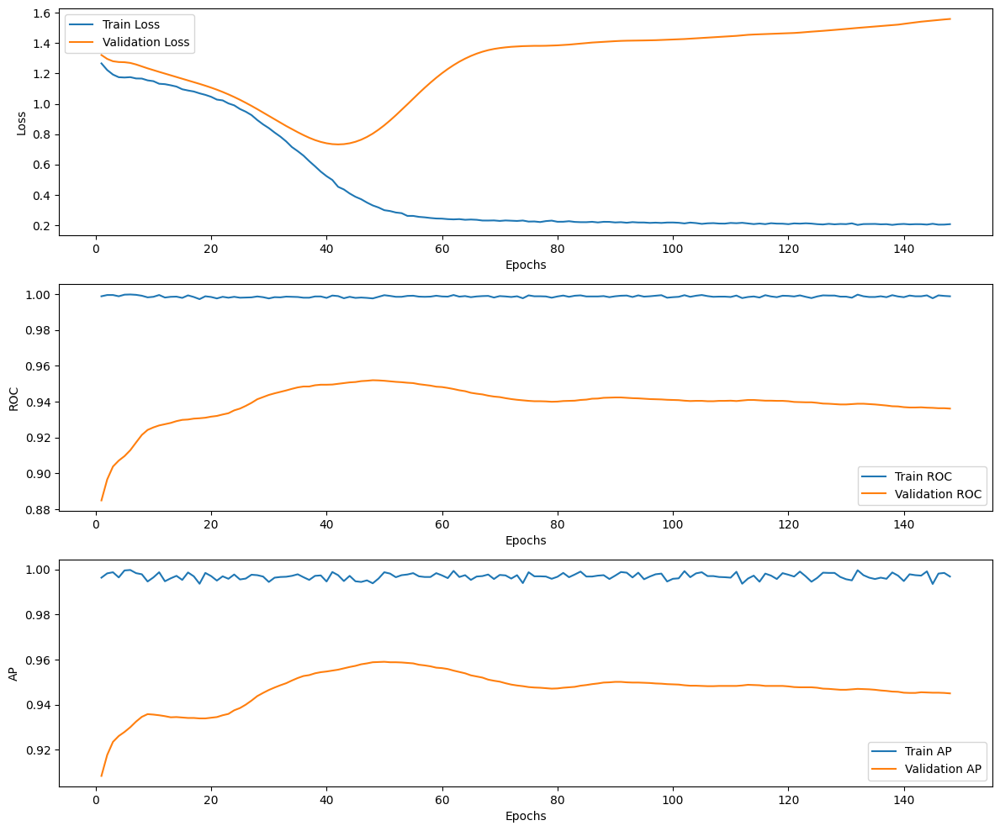

Final Validation Results:
Validation Loss: 0.8036
Validation ROC: 0.9519
Validation AP: 0.9588

Final Test Results:
Test Loss: 0.8269
Test ROC: 0.944
Test AP: 0.9388


In [ ]:
plot_training_validation_metrics_lp("/content/logs/lp/2024_7_9/4/log.txt")

##### GCN y Euclidean

###### GridSearch

In [ ]:
gridsearch('GCN', 'Euclidean', 'disease_lp', 'lp', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=None
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=None
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0.2, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0.5, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0.5, acti

In [ ]:
show_best_results_lp("grid_search_results_lp_GCN_Euclidean_disease_lp.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.681 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=None
Validation ROC: 0.6774 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=None
Validation ROC: 0.6494 - Experiment with num_layers=3, weight_decay=0, dropout=0.5, activation=None
Validation ROC: 0.6372 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=None
Validation ROC: 0.6333 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=None

Top 5 experiments based on validation AP:
Validation AP: 0.6092 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=None
Validation AP: 0.6043 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=None
Validation AP: 0.6017 - Experiment with num_layers=3, weight_decay=0, dropout=0.5, activation=None
Validation AP: 0.5952 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=None
Validat

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset disease_lp --cuda 0 --model GCN --manifold Euclidean --num-layers 2 --weight-decay 0 --dropout 0.5 --act None

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 2665
INFO:root:Number of features: 11
INFO:root:Number of training edges: 2265
INFO:root:Number of false training edges: 3550180
INFO:root:Number of validation edges: 133
INFO:root:Number of false validation edges: 133
INFO:root:Number of test edges: 266
INFO:root:Number of false test edges: 266
INFO:root:LPModel(
  (encoder): GCN(
    (layers): Sequential(
      (0): GraphConvolution(
        input_dim=11, output_dim=128
        (linear): Linear(in_features=11, out_features=128, bias=True)
      )
      (1): GraphConvolution(
        input_dim=128, output_di

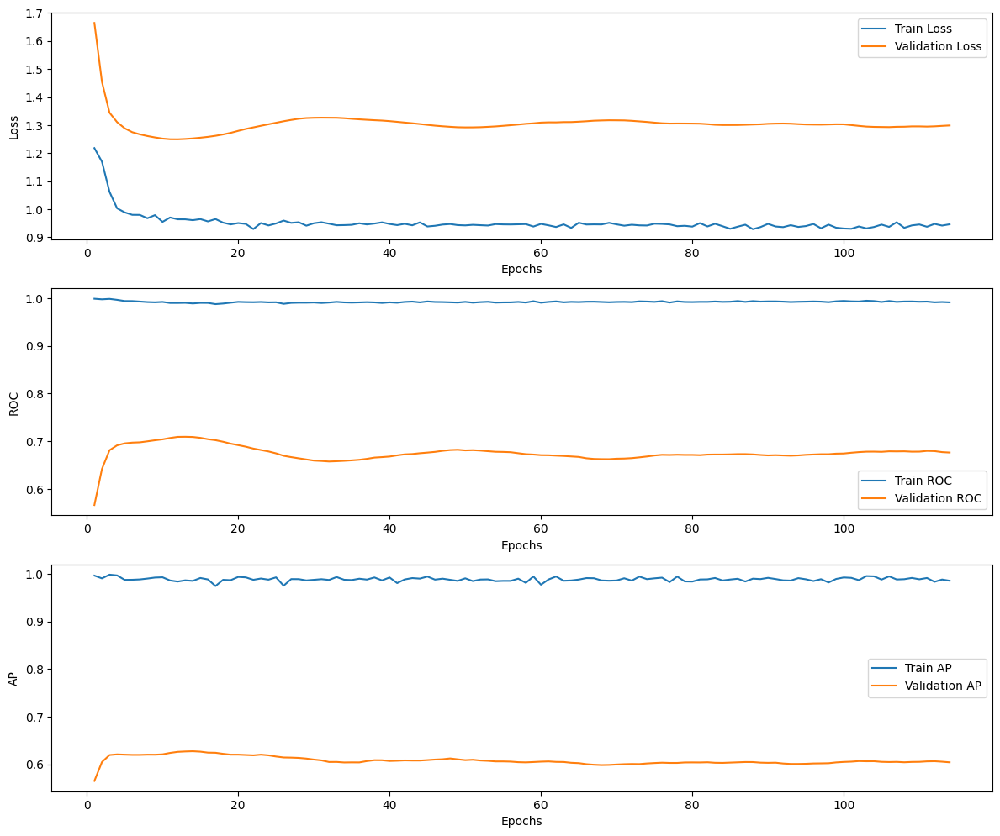

Final Validation Results:
Validation Loss: 1.2526
Validation ROC: 0.7091
Validation AP: 0.6279

Final Test Results:
Test Loss: 1.3043
Test ROC: 0.6832
Test AP: 0.6212


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/7/log.txt")

##### GAT y Euclidean

###### GridSearch

In [ ]:
gridsearch('GAT', 'Euclidean', 'disease_lp', 'lp', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_lp("grid_search_results_lp_GAT_Euclidean_disease_lp.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.7594 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=elu
Validation ROC: 0.7481 - Experiment with num_layers=3, weight_decay=0.001, dropout=0.5, activation=tanh
Validation ROC: 0.7364 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=tanh
Validation ROC: 0.7255 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Validation ROC: 0.7228 - Experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activation=relu

Top 5 experiments based on validation AP:
Validation AP: 0.667 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=elu
Validation AP: 0.6579 - Experiment with num_layers=3, weight_decay=0.001, dropout=0.5, activation=tanh
Validation AP: 0.6557 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Validation AP: 0.6535 - Experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activati

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset disease_lp --cuda 0 --model GAT --manifold Euclidean --num-layers 2 --weight-decay 0.001 --dropout 0.5 --act elu

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 2665
INFO:root:Number of features: 11
INFO:root:Number of training edges: 2265
INFO:root:Number of false training edges: 3550180
INFO:root:Number of validation edges: 133
INFO:root:Number of false validation edges: 133
INFO:root:Number of test edges: 266
INFO:root:Number of false test edges: 266
INFO:root:LPModel(
  (encoder): GAT(
    (layers): Sequential(
      (0): GraphAttentionLayer(
        (attention_0): SpGraphAttentionLayer (11 -> 32)
        (attention_1): SpGraphAttentionLayer (11 -> 32)
        (attention_2): SpGraphAttentionLayer (11 -> 32)
     

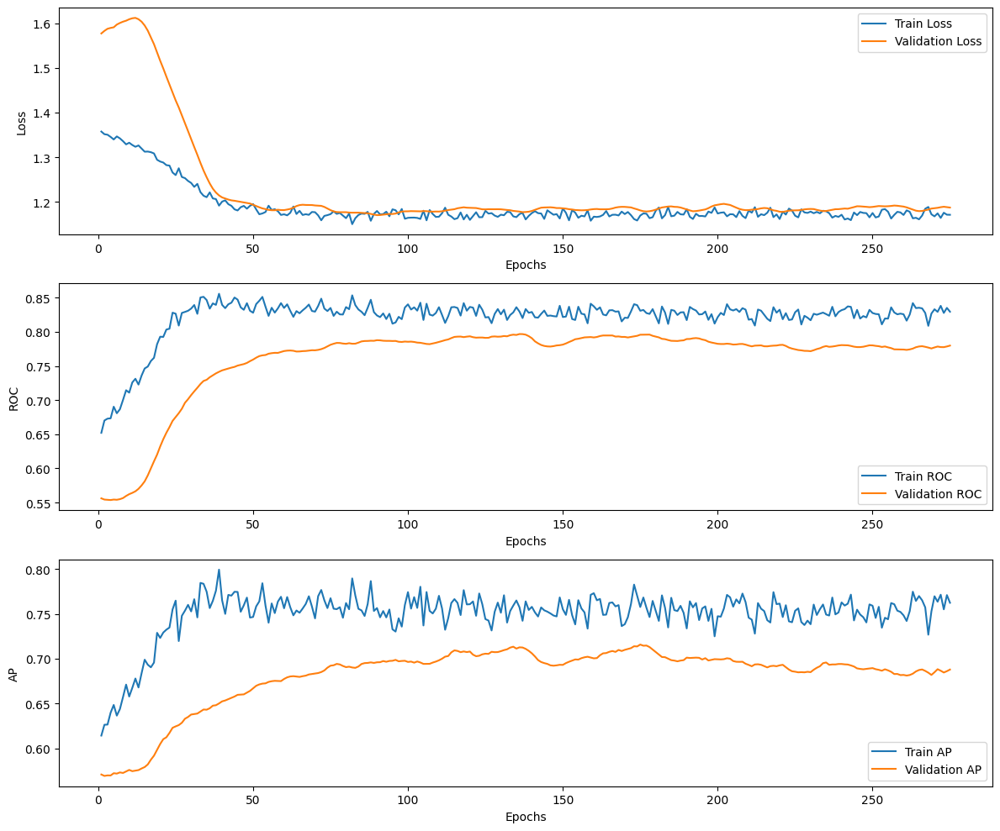

Final Validation Results:
Validation Loss: 1.1809
Validation ROC: 0.7958
Validation AP: 0.7158

Final Test Results:
Test Loss: 1.2278
Test ROC: 0.8006
Test AP: 0.7249


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/8/log.txt")

#### Photo

##### QGCN (HGCN y PseudoHyperboloid)

###### GridSearch

In [ ]:
gridsearch('HGCN', 'PseudoHyperboloid', 'photo', 'lp', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_lp("grid_search_results_lp_HGCN_PseudoHyperboloid_photo.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.9792 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Validation ROC: 0.9791 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Validation ROC: 0.979 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Validation ROC: 0.9788 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation ROC: 0.9784 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu

Top 5 experiments based on validation AP:
Validation AP: 0.9759 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation AP: 0.975 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Validation AP: 0.9747 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Validation AP: 0.9746 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Validation AP: 0.9746

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset photo --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 3 --weight-decay 0.001 --dropout 0 --act relu

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 7650
INFO:root:Number of features: 745
INFO:root:Number of training edges: 60780
INFO:root:Number of false training edges: 29204295
INFO:root:Number of validation edges: 3575
INFO:root:Number of false validation edges: 3575
INFO:root:Number of test edges: 7150
INFO:root:Number of false test edges: 7150
INFO:root:LPModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=746, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1

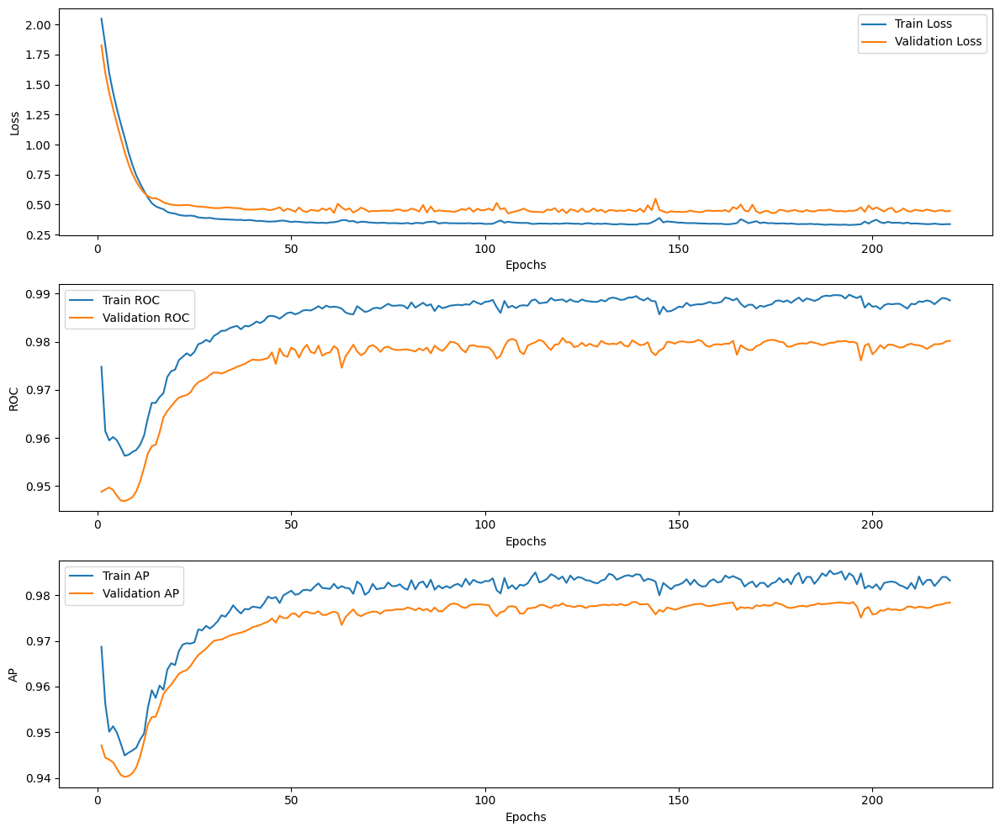

Final Validation Results:
Validation Loss: 0.4605
Validation ROC: 0.9808
Validation AP: 0.9782

Final Test Results:
Test Loss: 0.442
Test ROC: 0.9822
Test AP: 0.9776


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/9/log.txt")

###### Ejecución optimizador RiemannianAdam

In [ ]:
!python train.py --task lp --dataset photo --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 3 --weight-decay 0.001 --dropout 0 --act relu --epochs 300 --optimizer RiemannianAdam

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 7650
INFO:root:Number of features: 745
INFO:root:Number of training edges: 60780
INFO:root:Number of false training edges: 29204295
INFO:root:Number of validation edges: 3575
INFO:root:Number of false validation edges: 3575
INFO:root:Number of test edges: 7150
INFO:root:Number of false test edges: 7150
INFO:root:LPModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=746, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1

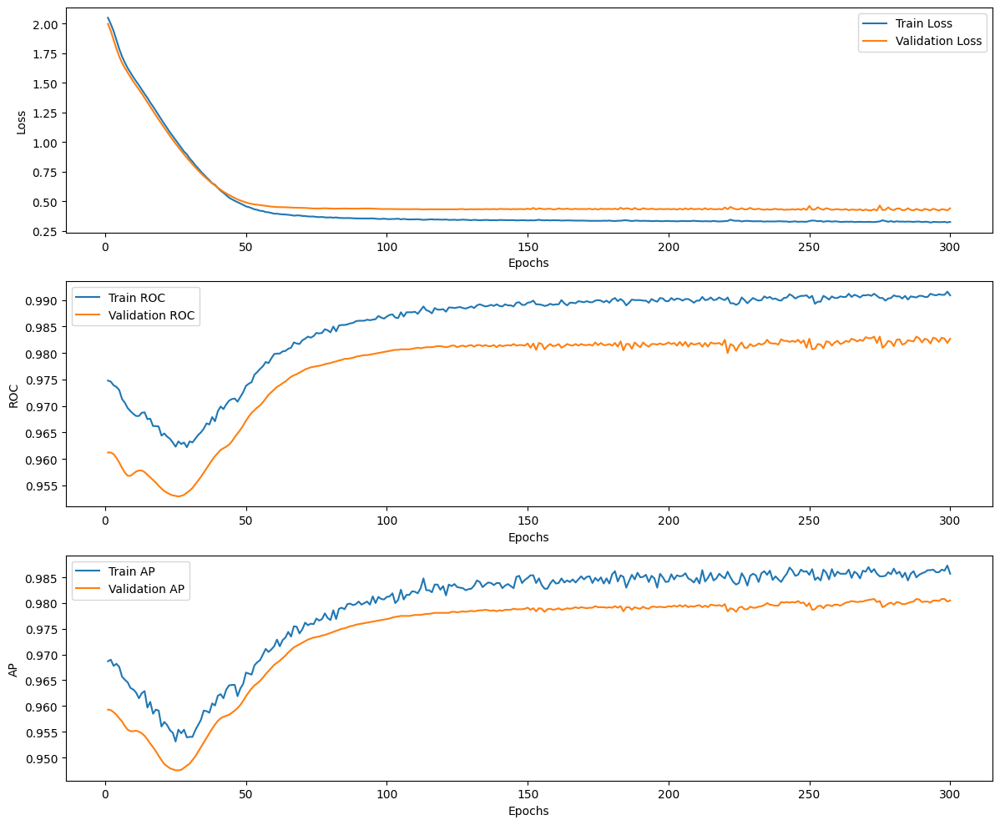

Final Validation Results:
Validation Loss: 0.4326
Validation ROC: 0.9831
Validation AP: 0.9808

Final Test Results:
Test Loss: 0.4107
Test ROC: 0.9852
Test AP: 0.9805


In [ ]:
plot_training_validation_metrics_lp("/content/logs/lp/2024_7_9/5/log.txt")

##### GCN y Euclidean

###### GridSearch

In [ ]:
gridsearch('GCN', 'Euclidean', 'photo', 'lp', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=None
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=None
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0.2, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0.5, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0.5, acti

In [ ]:
show_best_results_lp("grid_search_results_lp_GCN_Euclidean_photo.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.9569 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=None
Validation ROC: 0.9575 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=None
Validation ROC: 0.9582 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=None
Validation ROC: 0.9589 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=None
Validation ROC: 0.9553 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=None

Top 5 experiments based on validation AP:
Validation AP: 0.9522 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=None
Validation AP: 0.9533 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=None
Validation AP: 0.9537 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=None
Validation AP: 0.9526 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=None
Validation AP:

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset photo --cuda 0 --model GCN --manifold Euclidean --num-layers 2 --weight-decay 0 --dropout 0 --act None

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 7650
INFO:root:Number of features: 745
INFO:root:Number of training edges: 60780
INFO:root:Number of false training edges: 29204295
INFO:root:Number of validation edges: 3575
INFO:root:Number of false validation edges: 3575
INFO:root:Number of test edges: 7150
INFO:root:Number of false test edges: 7150
INFO:root:LPModel(
  (encoder): GCN(
    (layers): Sequential(
      (0): GraphConvolution(
        input_dim=745, output_dim=128
        (linear): Linear(in_features=745, out_features=128, bias=True)
      )
      (1): GraphConvolution(
        input_dim=128, 

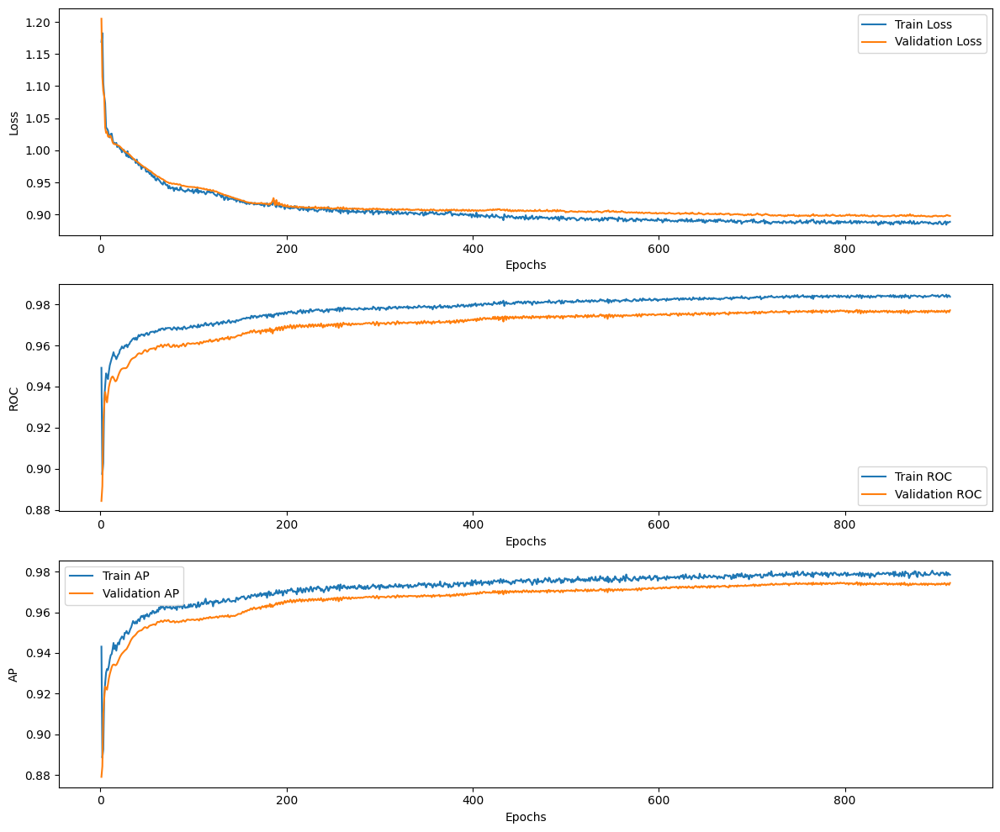

Final Validation Results:
Validation Loss: 0.8984
Validation ROC: 0.9773
Validation AP: 0.9748

Final Test Results:
Test Loss: 0.8976
Test ROC: 0.9786
Test AP: 0.9728


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/10/log.txt")

##### GAT y Euclidean

###### GridSearch

In [ ]:
gridsearch('GAT', 'Euclidean', 'photo', 'lp', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_lp("grid_search_results_lp_GAT_Euclidean_photo.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.9483 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Validation ROC: 0.9584 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=tanh

Top 5 experiments based on validation AP:
Validation AP: 0.9412 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Validation AP: 0.9509 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=tanh


###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset photo --cuda 0 --model GAT --manifold Euclidean --num-layers 2 --weight-decay 0 --dropout 0.5 --act tanh

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 7650
INFO:root:Number of features: 745
INFO:root:Number of training edges: 60780
INFO:root:Number of false training edges: 29204295
INFO:root:Number of validation edges: 3575
INFO:root:Number of false validation edges: 3575
INFO:root:Number of test edges: 7150
INFO:root:Number of false test edges: 7150
INFO:root:LPModel(
  (encoder): GAT(
    (layers): Sequential(
      (0): GraphAttentionLayer(
        (attention_0): SpGraphAttentionLayer (745 -> 32)
        (attention_1): SpGraphAttentionLayer (745 -> 32)
        (attention_2): SpGraphAttentionLayer (745 ->

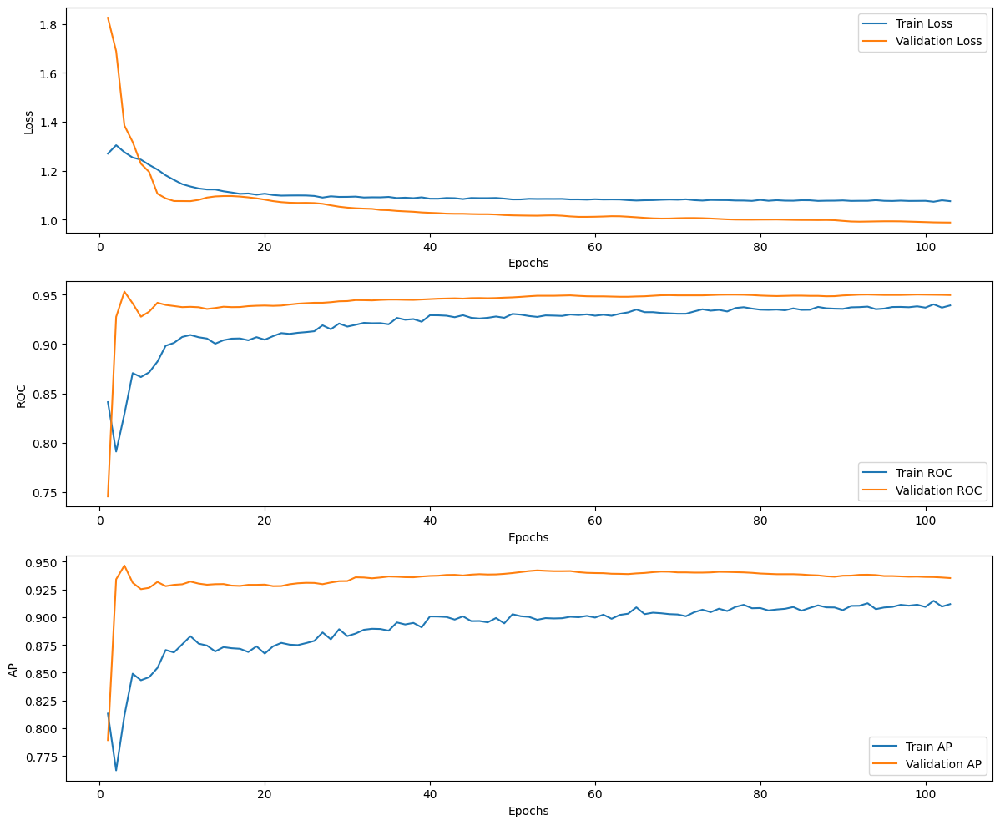

Final Validation Results:
Validation Loss: 1.3846
Validation ROC: 0.953
Validation AP: 0.9465

Final Test Results:
Test Loss: 1.3947
Test ROC: 0.9551
Test AP: 0.9458


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/11/log.txt")

#### Airport

##### QGCN (HGCN y PseudoHyperboloid)

###### GridSearch

In [ ]:
gridsearch('HGCN', 'PseudoHyperboloid', 'airport', 'lp', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_lp("grid_search_results_lp_HGCN_PseudoHyperboloid_airport.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.9356 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Validation ROC: 0.9311 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Validation ROC: 0.9297 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation ROC: 0.9285 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=relu
Validation ROC: 0.9272 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=elu

Top 5 experiments based on validation AP:
Validation AP: 0.948 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Validation AP: 0.9479 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=relu
Validation AP: 0.9476 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation AP: 0.947 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Validation AP: 0.94

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset airport --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 2 --weight-decay 0.001 --dropout 0 --act relu

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 3188
INFO:root:Number of features: 12
INFO:root:Number of training edges: 15837
INFO:root:Number of false training edges: 5067429
INFO:root:Number of validation edges: 931
INFO:root:Number of false validation edges: 931
INFO:root:Number of test edges: 1863
INFO:root:Number of false test edges: 1863
INFO:root:LPModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=13, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1.], d

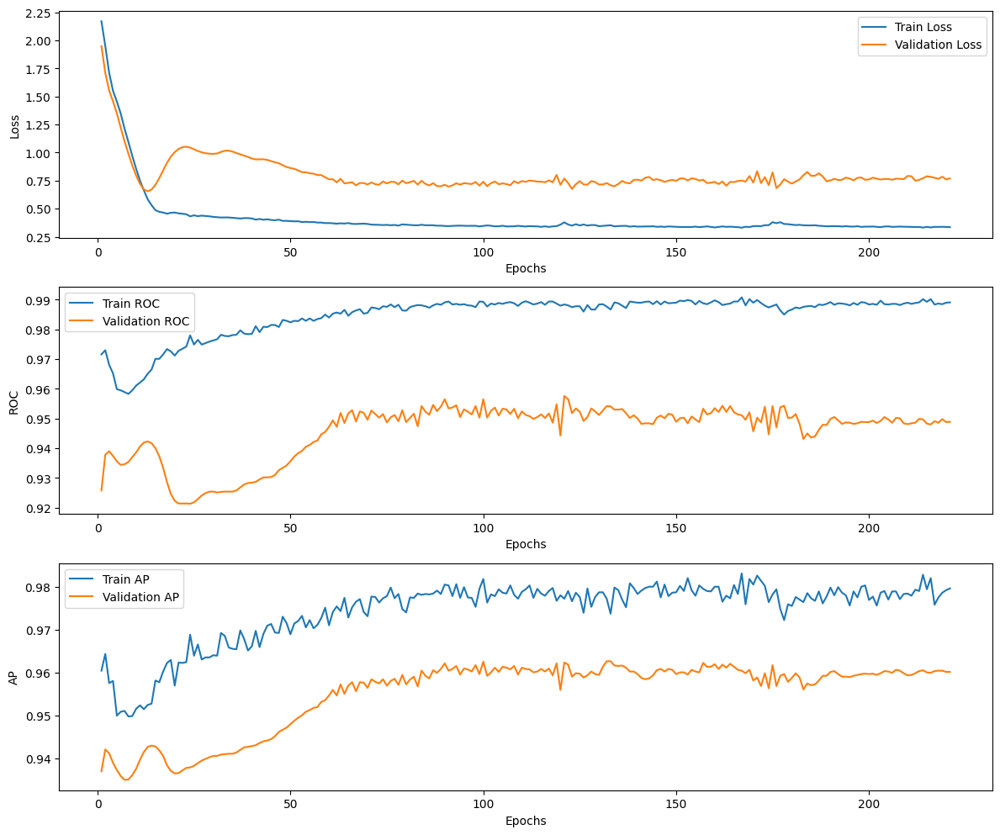

Final Validation Results:
Validation Loss: 0.7686
Validation ROC: 0.9576
Validation AP: 0.9624

Final Test Results:
Test Loss: 0.7676
Test ROC: 0.9551
Test AP: 0.948


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/12/log.txt")

###### Ejecución optimizador RiemannianAdam

In [ ]:
!python train.py --task lp --dataset airport --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 2 --weight-decay 0.001 --dropout 0 --act relu --epochs 300 --optimizer RiemannianAdam

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 3188
INFO:root:Number of features: 12
INFO:root:Number of training edges: 15837
INFO:root:Number of false training edges: 5067429
INFO:root:Number of validation edges: 931
INFO:root:Number of false validation edges: 931
INFO:root:Number of test edges: 1863
INFO:root:Number of false test edges: 1863
INFO:root:LPModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=13, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1.], d

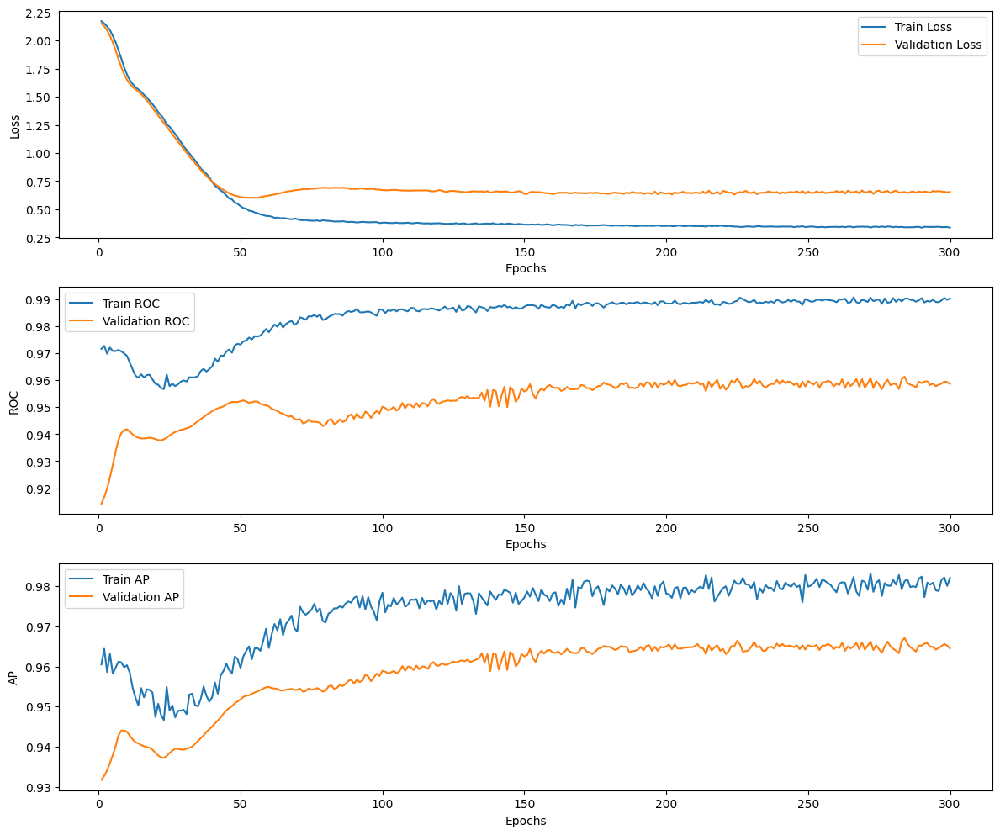

Final Validation Results:
Validation Loss: 0.6538
Validation ROC: 0.9613
Validation AP: 0.9671

Final Test Results:
Test Loss: 0.6374
Test ROC: 0.9608
Test AP: 0.9541


In [ ]:
plot_training_validation_metrics_lp("/content/logs/lp/2024_7_9/6/log.txt")

##### GCN y Euclidean

###### GridSearch

In [ ]:
gridsearch('GCN', 'Euclidean', 'airport', 'lp', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=None
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=None
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0.2, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0.5, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0.5, acti

In [ ]:
show_best_results_lp("grid_search_results_lp_GCN_Euclidean_airport.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.9344 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=None
Validation ROC: 0.9341 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=None
Validation ROC: 0.9338 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=None
Validation ROC: 0.9335 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=None
Validation ROC: 0.9314 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=None

Top 5 experiments based on validation AP:
Validation AP: 0.9344 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=None
Validation AP: 0.9341 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=None
Validation AP: 0.934 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=None
Validation AP: 0.9337 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=None
Validat

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset airport --cuda 0 --model GCN --manifold Euclidean --num-layers 2 --weight-decay 0 --dropout 0 --act None

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 3188
INFO:root:Number of features: 12
INFO:root:Number of training edges: 15837
INFO:root:Number of false training edges: 5067429
INFO:root:Number of validation edges: 931
INFO:root:Number of false validation edges: 931
INFO:root:Number of test edges: 1863
INFO:root:Number of false test edges: 1863
INFO:root:LPModel(
  (encoder): GCN(
    (layers): Sequential(
      (0): GraphConvolution(
        input_dim=12, output_dim=128
        (linear): Linear(in_features=12, out_features=128, bias=True)
      )
      (1): GraphConvolution(
        input_dim=128, output

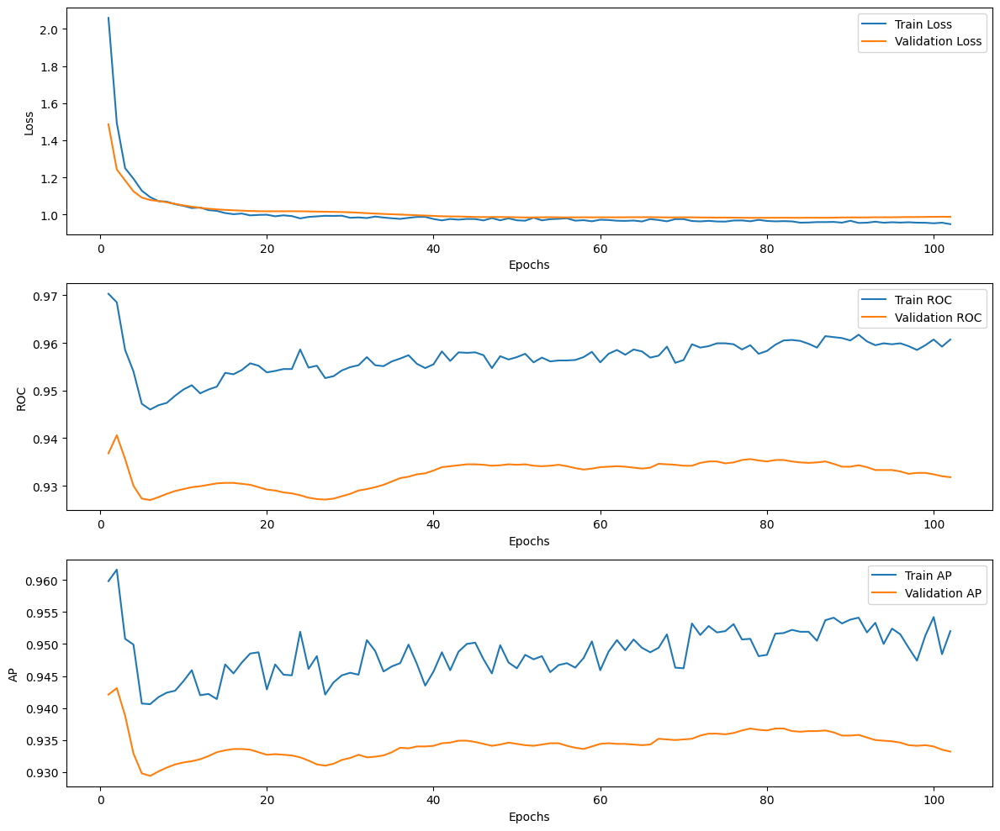

Final Validation Results:
Validation Loss: 1.2431
Validation ROC: 0.9406
Validation AP: 0.9431

Final Test Results:
Test Loss: 1.2557
Test ROC: 0.9323
Test AP: 0.9227


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/13/log.txt")

##### GAT y Euclidean

###### GridSearch

In [ ]:
gridsearch('GAT', 'Euclidean', 'airport', 'lp', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_lp("grid_search_results_lp_GAT_Euclidean_airport.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.9469 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation ROC: 0.9441 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Validation ROC: 0.9438 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=relu
Validation ROC: 0.9417 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Validation ROC: 0.9398 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu

Top 5 experiments based on validation AP:
Validation AP: 0.9467 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Validation AP: 0.9448 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=relu
Validation AP: 0.9441 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation AP: 0.9436 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Validation AP: 0.

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset airport --cuda 0 --model GAT --manifold Euclidean --num-layers 2 --weight-decay 0 --dropout 0 --act relu

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 3188
INFO:root:Number of features: 12
INFO:root:Number of training edges: 15837
INFO:root:Number of false training edges: 5067429
INFO:root:Number of validation edges: 931
INFO:root:Number of false validation edges: 931
INFO:root:Number of test edges: 1863
INFO:root:Number of false test edges: 1863
INFO:root:LPModel(
  (encoder): GAT(
    (layers): Sequential(
      (0): GraphAttentionLayer(
        (attention_0): SpGraphAttentionLayer (12 -> 32)
        (attention_1): SpGraphAttentionLayer (12 -> 32)
        (attention_2): SpGraphAttentionLayer (12 -> 32)
  

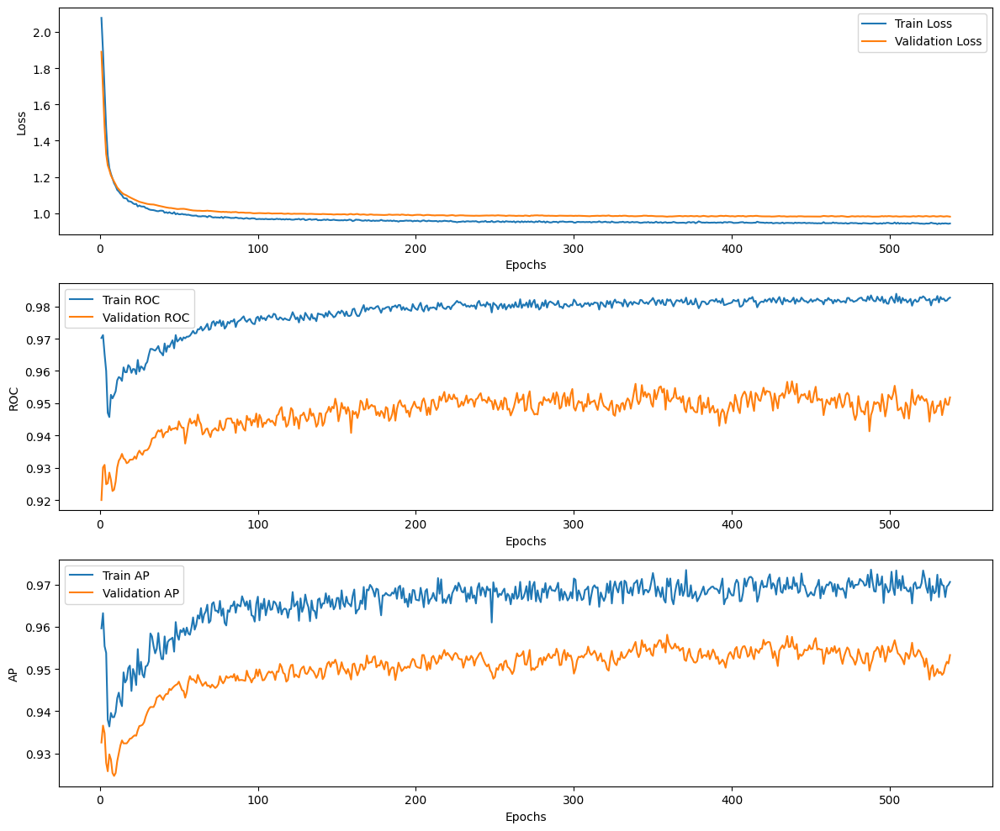

Final Validation Results:
Validation Loss: 0.9823
Validation ROC: 0.9568
Validation AP: 0.9576

Final Test Results:
Test Loss: 0.9969
Test ROC: 0.9465
Test AP: 0.9383


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/14/log.txt")

#### PPI

##### QGCN (HGCN y PseudoHyperboloid)

###### GridSearch

In [ ]:
gridsearch('HGCN', 'PseudoHyperboloid', 'ppi', 'lp', 10)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_lp("grid_search_results_lp_HGCN_PseudoHyperboloid_ppi.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.5186 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=elu
Validation ROC: 0.4994 - Experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activation=elu
Validation ROC: 0.4956 - Experiment with num_layers=3, weight_decay=0, dropout=0.2, activation=elu
Validation ROC: 0.4944 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=tanh
Validation ROC: 0.4917 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=elu

Top 5 experiments based on validation AP:
Validation AP: 0.5167 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=elu
Validation AP: 0.5102 - Experiment with num_layers=3, weight_decay=0.001, dropout=0.5, activation=elu
Validation AP: 0.5088 - Experiment with num_layers=3, weight_decay=0.001, dropout=0.5, activation=tanh
Validation AP: 0.5087 - Experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activation=elu
Valid

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset ppi --cuda -1 --model HGCN --manifold PseudoHyperboloid --num-layers 3 --weight-decay 0.001 --dropout 0 --act elu

INFO:root:Using: cpu
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 56944
INFO:root:Number of features: 50
INFO:root:Number of training edges: 122636
INFO:root:Number of false training edges: 793632
INFO:root:Number of validation edges: 49730
INFO:root:Number of false validation edges: 49730
INFO:root:Number of test edges: 40494
INFO:root:Number of false test edges: 40494
INFO:root:LPModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=51, out_features=128, c=tensor([-1.], requires_grad=True))
        (agg): HypAgg(c=tensor([-1.], requires_grad=True))


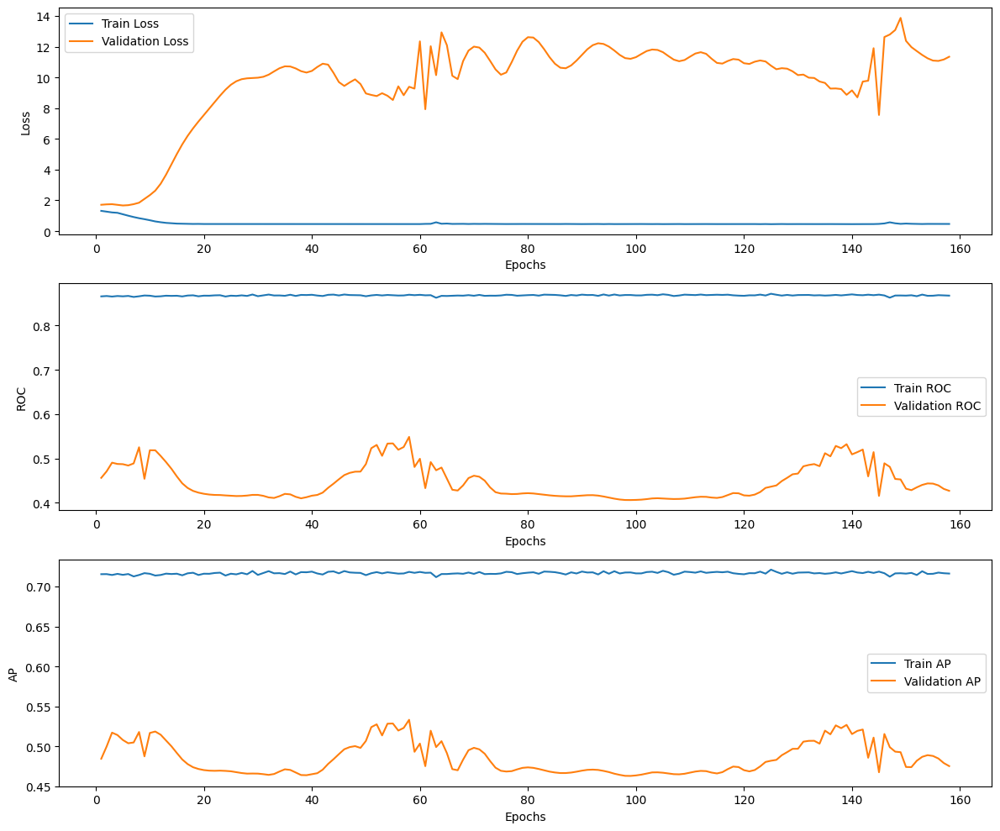

Final Validation Results:
Validation Loss: 9.3906
Validation ROC: 0.5487
Validation AP: 0.5331

Final Test Results:
Test Loss: 9.3889
Test ROC: 0.548
Test AP: 0.5333


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/15/log.txt")

###### Ejecución optimizador RiemannianAdam

In [ ]:
!python train.py --task lp --dataset ppi --cuda -1 --model HGCN --manifold PseudoHyperboloid --num-layers 3 --weight-decay 0.001 --dropout 0 --act elu --epochs 100 --optimizer RiemannianAdam

INFO:root:Using: cpu
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 56944
INFO:root:Number of features: 50
INFO:root:Number of training edges: 122636
INFO:root:Number of false training edges: 793632
INFO:root:Number of validation edges: 49730
INFO:root:Number of false validation edges: 49730
INFO:root:Number of test edges: 40494
INFO:root:Number of false test edges: 40494
INFO:root:LPModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=51, out_features=128, c=tensor([-1.], requires_grad=True))
        (agg): HypAgg(c=tensor([-1.], requires_grad=True))


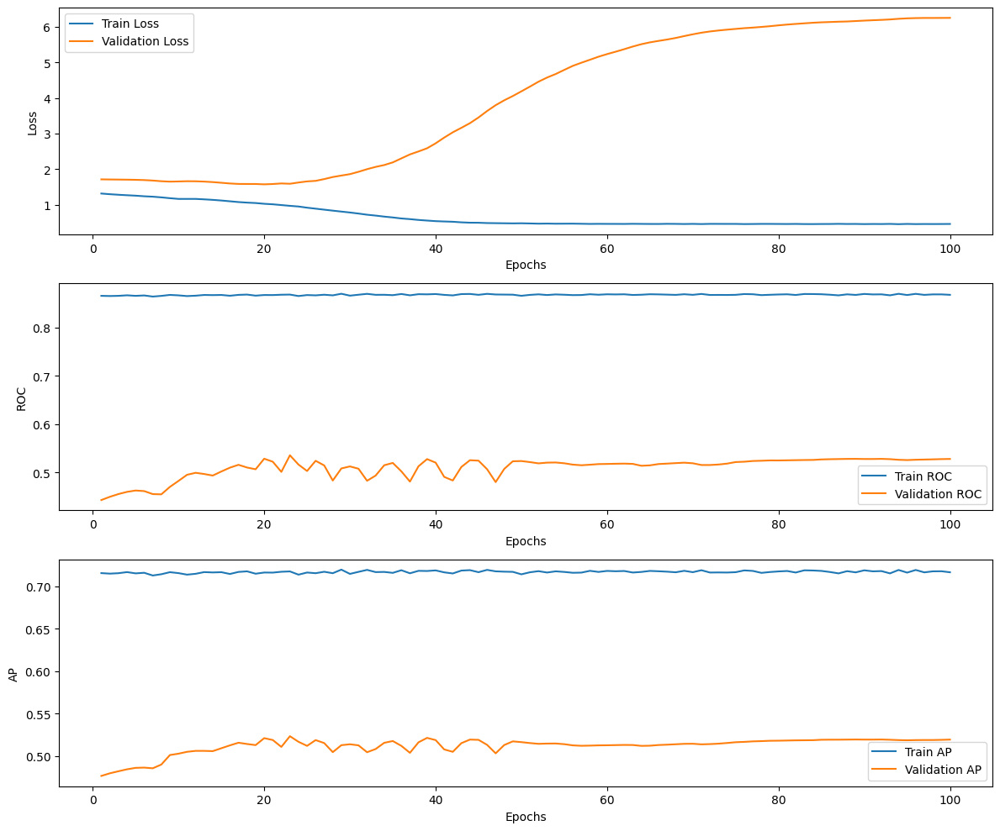

Final Validation Results:
Validation Loss: 1.591
Validation ROC: 0.5358
Validation AP: 0.5233

Final Test Results:
Test Loss: 1.584
Test ROC: 0.5393
Test AP: 0.5256


In [ ]:
plot_training_validation_metrics_lp("/content/logs/lp/2024_7_9/8/log.txt")

##### GCN y Euclidean

###### GridSearch

In [ ]:
gridsearch('GCN', 'Euclidean', 'ppi', 'lp', 10)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=None
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=None
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=None
Running experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0.2, activation=None
Running experiment with num_layers=3, weight_decay=0, dropout=0.5, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activation=None
Running experiment with num_layers=3, weight_decay=0.001, dropout=0.5, acti

In [ ]:
show_best_results_lp("grid_search_results_lp_GCN_Euclidean_ppi.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.5273 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=None
Validation ROC: 0.5267 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=None
Validation ROC: 0.5232 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=None
Validation ROC: 0.5225 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=None
Validation ROC: 0.5221 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=None

Top 5 experiments based on validation AP:
Validation AP: 0.519 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=None
Validation AP: 0.5185 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=None
Validation AP: 0.516 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=None
Validation AP: 0.5159 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=None
Validati

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset ppi --cuda -1 --model GCN --manifold Euclidean --num-layers 3 --weight-decay 0.001 --dropout 0 --act None

INFO:root:Using: cpu
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 56944
INFO:root:Number of features: 50
INFO:root:Number of training edges: 122636
INFO:root:Number of false training edges: 793632
INFO:root:Number of validation edges: 49730
INFO:root:Number of false validation edges: 49730
INFO:root:Number of test edges: 40494
INFO:root:Number of false test edges: 40494
INFO:root:LPModel(
  (encoder): GCN(
    (layers): Sequential(
      (0): GraphConvolution(
        input_dim=50, output_dim=128
        (linear): Linear(in_features=50, out_features=128, bias=True)
      )
      (1): GraphConvolution(
        input_dim=128, ou

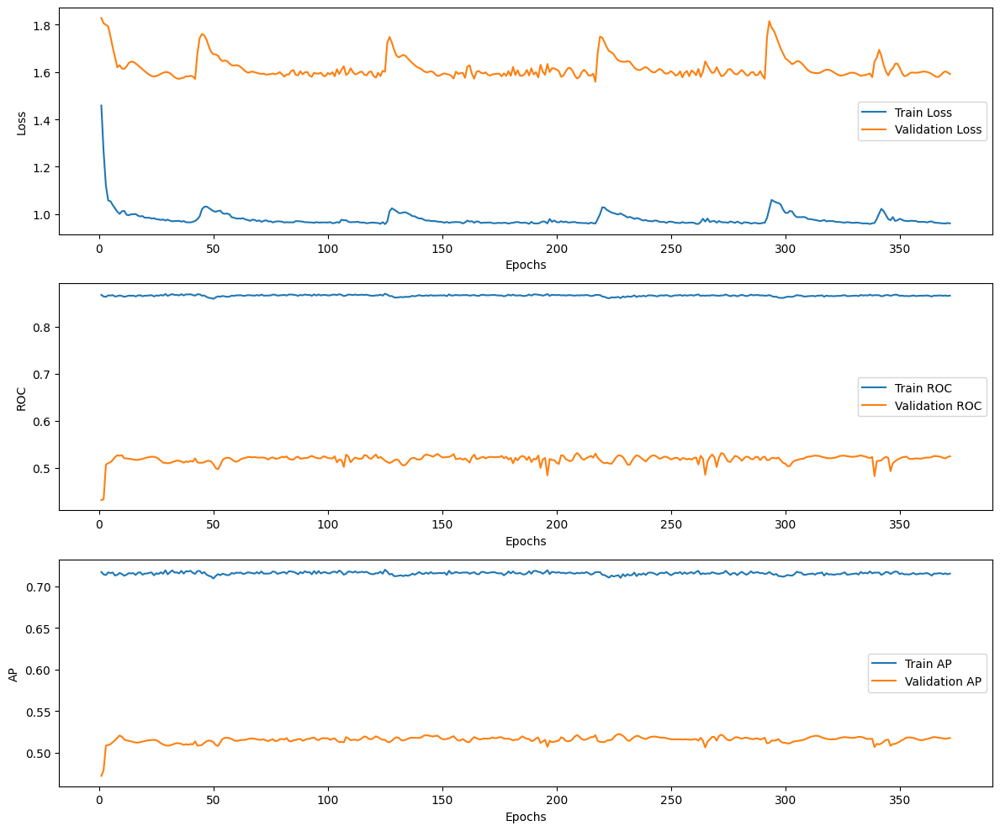

Final Validation Results:
Validation Loss: 1.5819
Validation ROC: 0.5314
Validation AP: 0.5215

Final Test Results:
Test Loss: 1.5804
Test ROC: 0.5293
Test AP: 0.5211


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/16/log.txt")

##### GAT y Euclidean

###### GridSearch

In [ ]:
gridsearch('GAT', 'Euclidean', 'ppi', 'lp', 10)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_lp("grid_search_results_lp_GAT_Euclidean_ppi.txt", 5)

Top 5 experiments based on validation ROC:
Validation ROC: 0.5588 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=tanh
Validation ROC: 0.5565 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Validation ROC: 0.5562 - Experiment with num_layers=3, weight_decay=0, dropout=0.2, activation=tanh
Validation ROC: 0.5555 - Experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activation=tanh
Validation ROC: 0.5451 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=elu

Top 5 experiments based on validation AP:
Validation AP: 0.5319 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=elu
Validation AP: 0.5317 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=tanh
Validation AP: 0.5308 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Validation AP: 0.5305 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=elu
Validation 

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task lp --dataset ppi --cuda -1 --model GAT --manifold Euclidean --num-layers 2 --weight-decay 0.001 --dropout 0.2 --act tanh --epochs 20

INFO:root:Using: cpu
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 56944
INFO:root:Number of features: 50
INFO:root:Number of training edges: 122636
INFO:root:Number of false training edges: 793632
INFO:root:Number of validation edges: 49730
INFO:root:Number of false validation edges: 49730
INFO:root:Number of test edges: 40494
INFO:root:Number of false test edges: 40494
INFO:root:LPModel(
  (encoder): GAT(
    (layers): Sequential(
      (0): GraphAttentionLayer(
        (attention_0): SpGraphAttentionLayer (50 -> 32)
        (attention_1): SpGraphAttentionLayer (50 -> 32)
        (attention_2): SpGraphAttentionLayer (50 -> 32

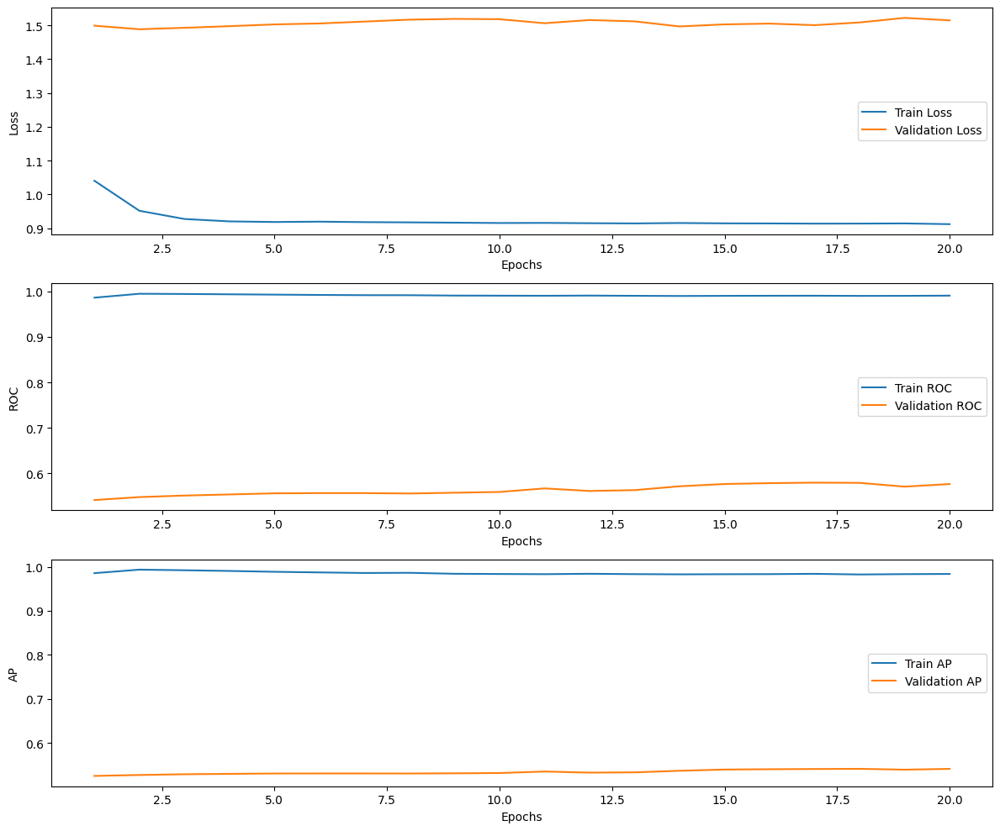

Final Validation Results:
Validation Loss: 1.5003
Validation ROC: 0.5792
Validation AP: 0.5408

Final Test Results:
Test Loss: 1.4978
Test ROC: 0.5793
Test AP: 0.5413


In [ ]:
plot_training_validation_metrics_lp("/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/17/log.txt")

### Clasificación de nodos

#### Cora

##### QGCN (HGCN y PseudoHyperboloid)

###### Gridsearch

In [ ]:
gridsearch("HGCN", "PseudoHyperboloid", "cora", "nc", 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_HGCN_PseudoHyperboloid_cora.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.774 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=relu
Validation ACC: 0.77 - Experiment with num_layers=3, weight_decay=0, dropout=0.5, activation=relu
Validation ACC: 0.762 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=tanh
Validation ACC: 0.76 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=relu
Validation ACC: 0.76 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=elu

Top 5 experiments based on validation F1:
Validation F1: 0.774 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=relu
Validation F1: 0.77 - Experiment with num_layers=3, weight_decay=0, dropout=0.5, activation=relu
Validation F1: 0.762 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=tanh
Validation F1: 0.76 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=relu
Valid

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset cora --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 2 --weight-decay 0.001 --dropout 0.5 --act relu

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 2708
INFO:root:Number of features: 1433
INFO:root:Number of classes: 7
INFO:root:NCModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=1434, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (hyp_act): HypAct(c_in=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>), c_out=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
      )
    )
  )
  (decoder

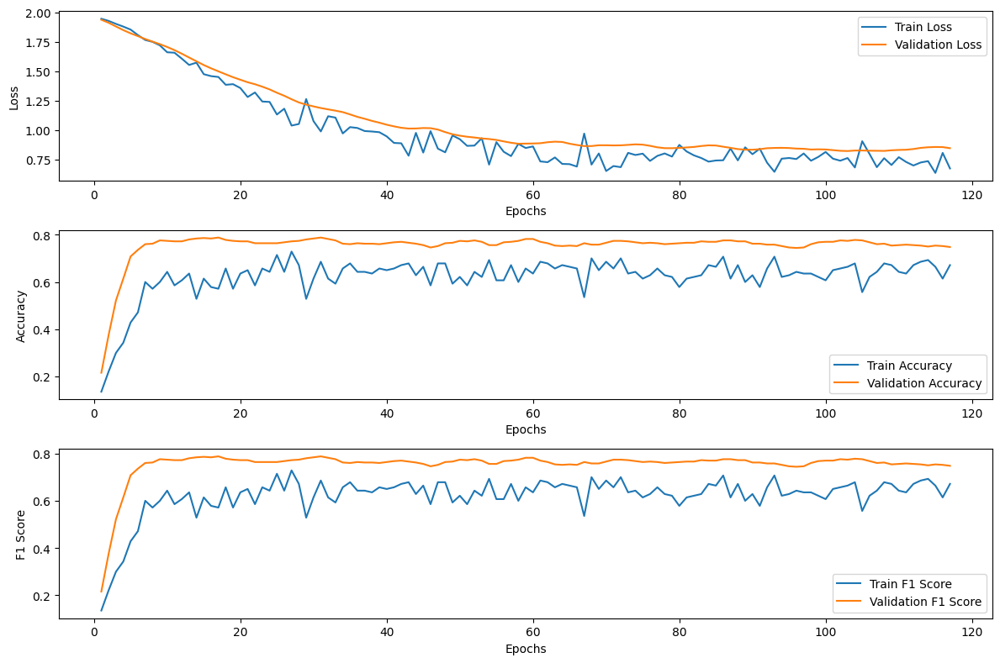

Resultados del conjunto de validación:
- Pérdida (Loss): 1.4989
- Precisión (Accuracy): 0.788
- Puntuación F1 (F1 Score): 0.788

Resultados del conjunto de prueba:
- Pérdida (Loss): 1.486
- Precisión (Accuracy): 0.806
- Puntuación F1 (F1 Score): 0.806
Tiempo total de ejecución: 78.7112s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/0/log.txt")

###### Ejecución con optimizador RiemannianAdam


In [ ]:
!python train.py --task nc --dataset cora --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 2 --weight-decay 0.001 --dropout 0.5 --act relu --optimizer RiemannianAdam

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 2708
INFO:root:Number of features: 1433
INFO:root:Number of classes: 7
INFO:root:Number of training nodes: 140
INFO:root:Number of validation nodes: 500
INFO:root:Number of test nodes: 1000
INFO:root:NCModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=1434, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (hyp_act): HypAct(c_in=tensor([-1.], device='cuda:0', gr

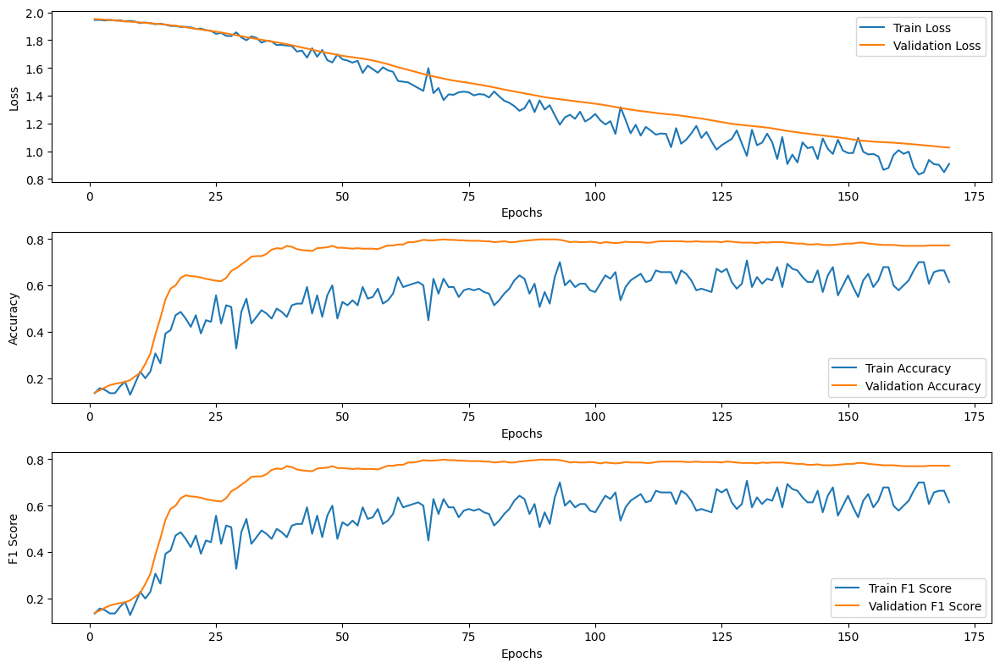

Resultados del conjunto de validación:
- Pérdida (Loss): 1.5228
- Precisión (Accuracy): 0.798
- Puntuación F1 (F1 Score): 0.798

Resultados del conjunto de prueba:
- Pérdida (Loss): 1.5079
- Precisión (Accuracy): 0.81
- Puntuación F1 (F1 Score): 0.81
Tiempo total de ejecución: 110.0833s


In [ ]:
plot_training_validation_metrics_nc("/content/logs/nc/2024_7_9/0/log.txt")

##### GCN y Euclidean

###### Gridsearch

In [ ]:
gridsearch("GCN", "Euclidean", "cora", "nc", 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_GCN_Euclidean_cora.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.782 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=tanh
Validation ACC: 0.78 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Validation ACC: 0.78 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Validation ACC: 0.78 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=relu
Validation ACC: 0.778 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=elu

Top 5 experiments based on validation F1:
Validation F1: 0.782 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=tanh
Validation F1: 0.78 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Validation F1: 0.78 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Validation F1: 0.78 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=relu
Valida

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset cora --cuda 0 --model GCN --manifold Euclidean --num-layers 2 --weight-decay 0.001 --dropout 0.2 --act tanh

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 2708
INFO:root:Number of features: 1433
INFO:root:Number of classes: 7
INFO:root:NCModel(
  (encoder): GCN(
    (layers): Sequential(
      (0): GraphConvolution(
        input_dim=1433, output_dim=128
        (linear): Linear(in_features=1433, out_features=128, bias=True)
      )
    )
  )
  (decoder): GCNDecoder(
    (cls): GraphConvolution(
      input_dim=128, output_dim=7
      (linear): Linear(in_features=128, out_features=7, bias=True)
    )
  )
)
INFO:root:Total number of parameters: 184455
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_schedu

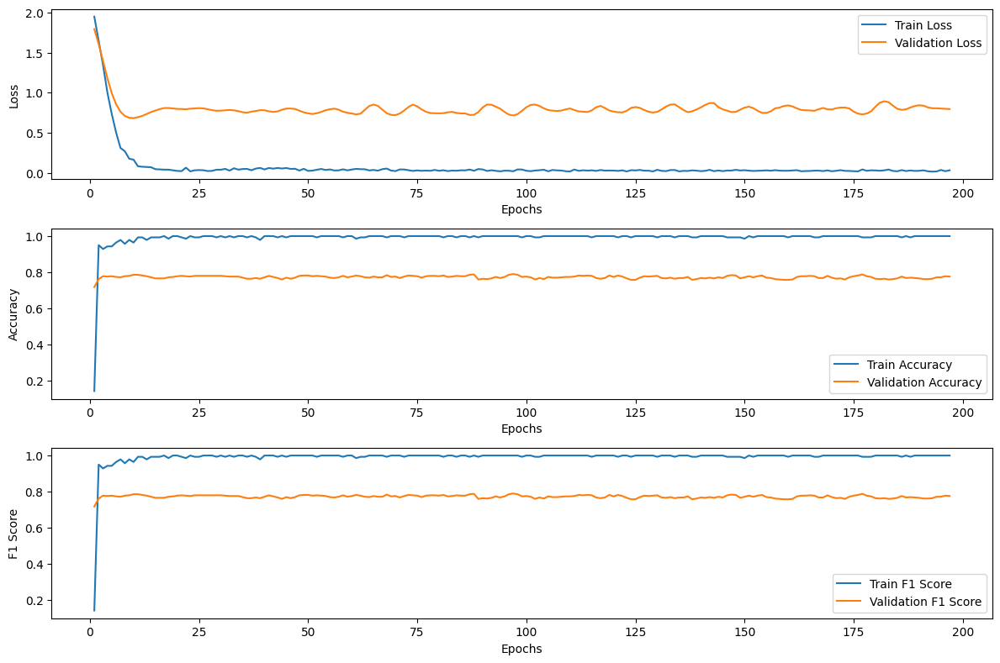

Resultados del conjunto de validación:
- Pérdida (Loss): 0.7143
- Precisión (Accuracy): 0.79
- Puntuación F1 (F1 Score): 0.79

Resultados del conjunto de prueba:
- Pérdida (Loss): 0.6069
- Precisión (Accuracy): 0.821
- Puntuación F1 (F1 Score): 0.821
Tiempo total de ejecución: 3.6955s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/1/log.txt")

##### GAT y Euclidean

###### GridSearch

In [ ]:
gridsearch('GAT', 'Euclidean', 'cora', 'nc', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_GAT_Euclidean_cora.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.784 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=elu
Validation ACC: 0.782 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=relu
Validation ACC: 0.776 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Validation ACC: 0.772 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Validation ACC: 0.768 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu

Top 5 experiments based on validation F1:
Validation F1: 0.784 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=elu
Validation F1: 0.782 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=relu
Validation F1: 0.776 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Validation F1: 0.772 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Validation F1:

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset cora --cuda 0 --model GAT --manifold Euclidean --num-layers 2 --weight-decay 0.001 --dropout 0.5 --act elu

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 2708
INFO:root:Number of features: 1433
INFO:root:Number of classes: 7
INFO:root:NCModel(
  (encoder): GAT(
    (layers): Sequential(
      (0): GraphAttentionLayer(
        (attention_0): SpGraphAttentionLayer (1433 -> 32)
        (attention_1): SpGraphAttentionLayer (1433 -> 32)
        (attention_2): SpGraphAttentionLayer (1433 -> 32)
        (attention_3): SpGraphAttentionLayer (1433 -> 32)
      )
    )
  )
  (decoder): GATDecoder(
    (cls): GraphAttentionLayer(
      (attention_0): SpGraphAttentionLayer (128 -> 7)
    )
  )
)
INFO:root:Total number of 

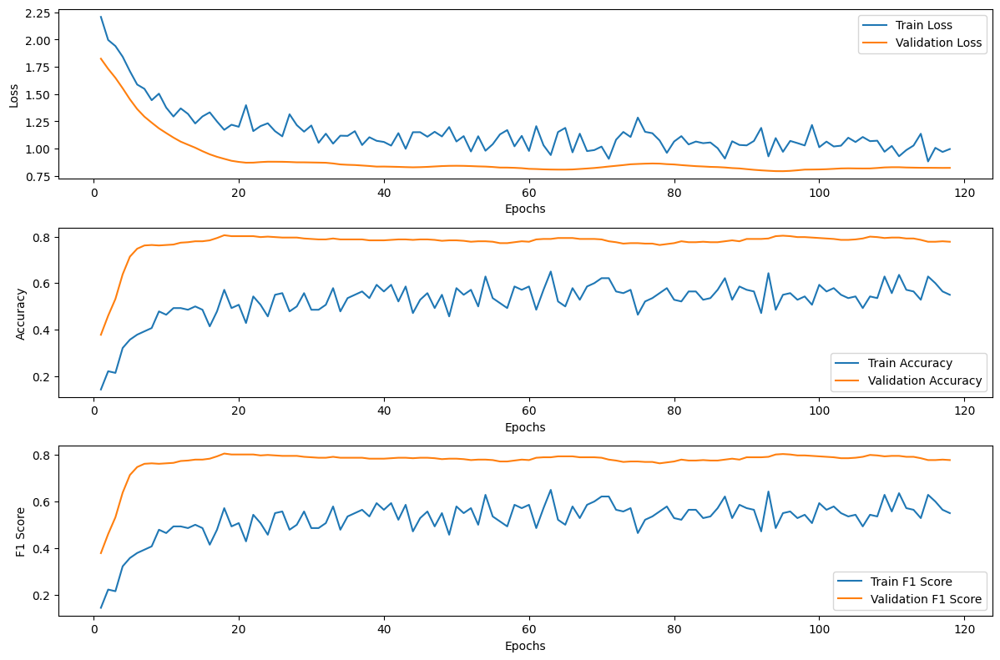

Resultados del conjunto de validación:
- Pérdida (Loss): 0.9053
- Precisión (Accuracy): 0.806
- Puntuación F1 (F1 Score): 0.806

Resultados del conjunto de prueba:
- Pérdida (Loss): 0.8655
- Precisión (Accuracy): 0.805
- Puntuación F1 (F1 Score): 0.805
Tiempo total de ejecución: 8.7803s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/2/log.txt")

#### Citeseer

##### QGCN (HGCN y PseudoHyperboloid)

###### Gridsearch

In [ ]:
gridsearch("HGCN", "PseudoHyperboloid", "citeseer", "nc", 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_HGCN_PseudoHyperboloid_citeseer.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.684 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Validation ACC: 0.68 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation ACC: 0.676 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=relu
Validation ACC: 0.674 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=relu
Validation ACC: 0.674 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=elu

Top 5 experiments based on validation F1:
Validation F1: 0.684 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Validation F1: 0.68 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation F1: 0.676 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=relu
Validation F1: 0.674 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=relu
Va

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset citeseer --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 2 --weight-decay 0.001 --dropout 0 --act relu

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 3327
INFO:root:Number of features: 3703
INFO:root:Number of classes: 6
INFO:root:NCModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=3704, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (hyp_act): HypAct(c_in=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>), c_out=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
      )
    )
  )
  (decoder

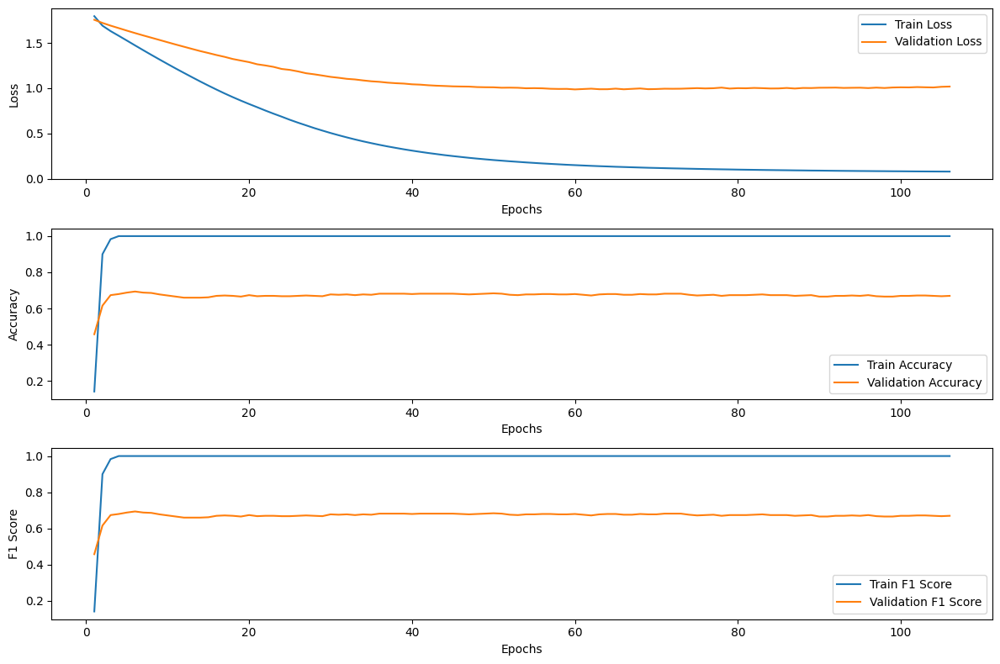

Resultados del conjunto de validación:
- Pérdida (Loss): 1.6086
- Precisión (Accuracy): 0.694
- Puntuación F1 (F1 Score): 0.694

Resultados del conjunto de prueba:
- Pérdida (Loss): 1.6059
- Precisión (Accuracy): 0.678
- Puntuación F1 (F1 Score): 0.678
Tiempo total de ejecución: 74.4096s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/3/log.txt")

###### Ejecución con optimizador RiemannianAdam


In [ ]:
!python train.py --task nc --dataset citeseer --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 2 --weight-decay 0.001 --dropout 0 --act relu --optimizer RiemannianAdam

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 3327
INFO:root:Number of features: 3703
INFO:root:Number of classes: 6
INFO:root:Number of training nodes: 120
INFO:root:Number of validation nodes: 500
INFO:root:Number of test nodes: 1000
INFO:root:NCModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=3704, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (hyp_act): HypAct(c_in=tensor([-1.], device='cuda:0', gr

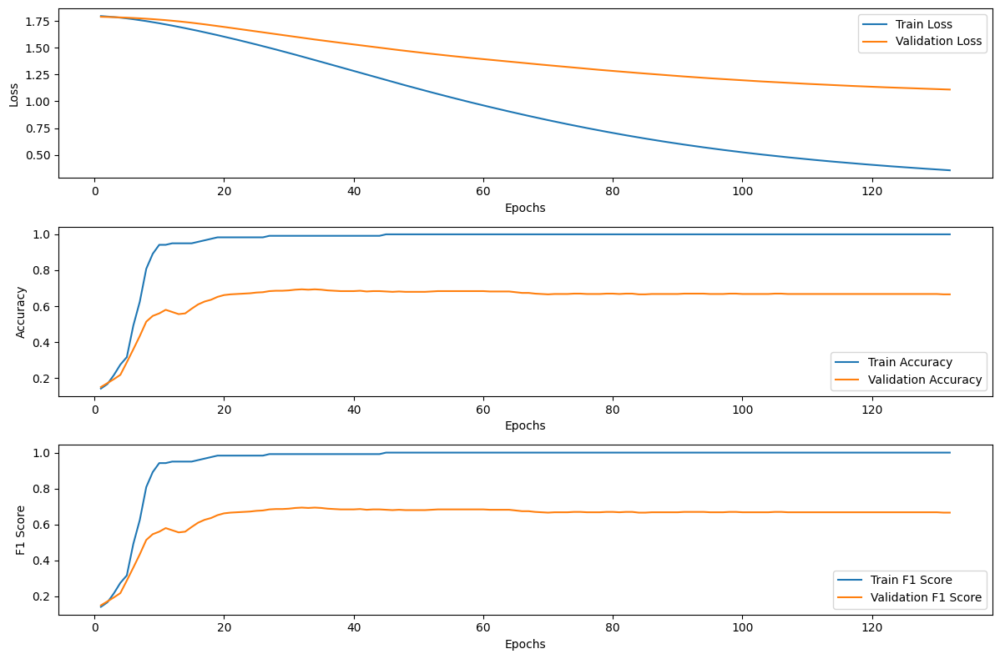

Resultados del conjunto de validación:
- Pérdida (Loss): 1.5927
- Precisión (Accuracy): 0.694
- Puntuación F1 (F1 Score): 0.694

Resultados del conjunto de prueba:
- Pérdida (Loss): 1.589
- Precisión (Accuracy): 0.706
- Puntuación F1 (F1 Score): 0.706
Tiempo total de ejecución: 87.9227s


In [ ]:
plot_training_validation_metrics_nc("/content/logs/nc/2024_7_9/1/log.txt")

##### GCN y Euclidean

###### Gridsearch

In [ ]:
gridsearch("GCN", "Euclidean", "citeseer", "nc", 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_GCN_Euclidean_citeseer.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.684 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=tanh
Validation ACC: 0.68 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Validation ACC: 0.674 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Validation ACC: 0.674 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=elu
Validation ACC: 0.672 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu

Top 5 experiments based on validation F1:
Validation F1: 0.684 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=tanh
Validation F1: 0.68 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Validation F1: 0.674 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Validation F1: 0.674 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=elu
Validat

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset citeseer --cuda 0 --model GCN --manifold Euclidean --num-layers 2 --weight-decay 0.001 --dropout 0.2 --act tanh

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 3327
INFO:root:Number of features: 3703
INFO:root:Number of classes: 6
INFO:root:NCModel(
  (encoder): GCN(
    (layers): Sequential(
      (0): GraphConvolution(
        input_dim=3703, output_dim=128
        (linear): Linear(in_features=3703, out_features=128, bias=True)
      )
    )
  )
  (decoder): GCNDecoder(
    (cls): GraphConvolution(
      input_dim=128, output_dim=6
      (linear): Linear(in_features=128, out_features=6, bias=True)
    )
  )
)
INFO:root:Total number of parameters: 474886
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_schedu

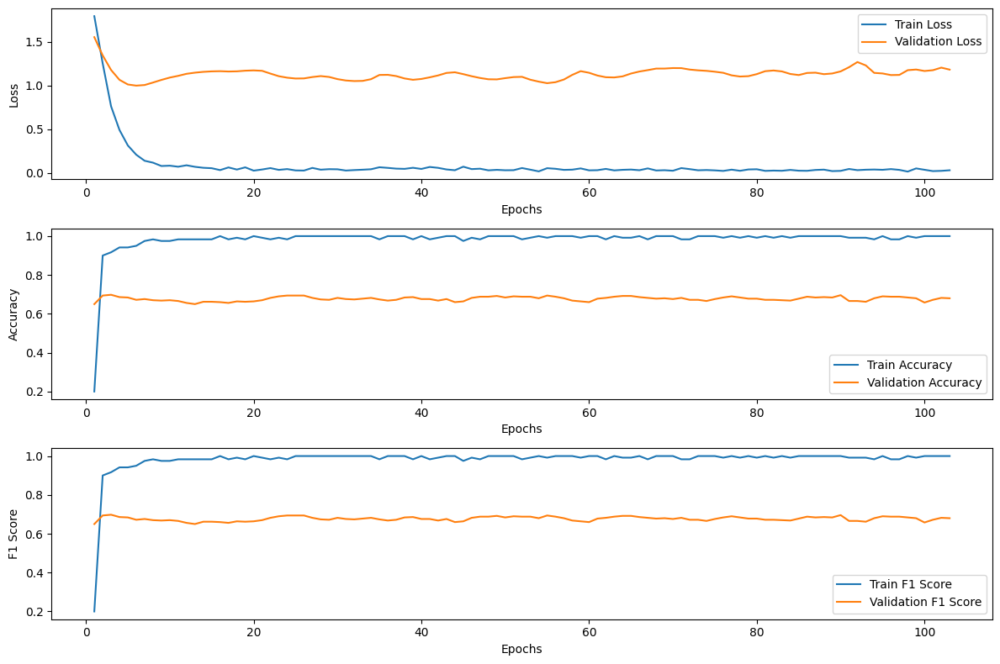

Resultados del conjunto de validación:
- Pérdida (Loss): 1.1756
- Precisión (Accuracy): 0.698
- Puntuación F1 (F1 Score): 0.698

Resultados del conjunto de prueba:
- Pérdida (Loss): 1.1744
- Precisión (Accuracy): 0.682
- Puntuación F1 (F1 Score): 0.682
Tiempo total de ejecución: 2.4933s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/4/log.txt")

##### GAT y Euclidean

###### GridSearch

In [ ]:
gridsearch('GAT', 'Euclidean', 'citeseer', 'nc', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_GAT_Euclidean_citeseer.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.7 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Validation ACC: 0.698 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Validation ACC: 0.686 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Validation ACC: 0.682 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=elu
Validation ACC: 0.68 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu

Top 5 experiments based on validation F1:
Validation F1: 0.7 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Validation F1: 0.698 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Validation F1: 0.686 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Validation F1: 0.682 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=elu
Validation F1: 0.6

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset citeseer --cuda 0 --model GAT --manifold Euclidean --num-layers 2 --weight-decay 0.001 --dropout 0 --act elu

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 3327
INFO:root:Number of features: 3703
INFO:root:Number of classes: 6
INFO:root:NCModel(
  (encoder): GAT(
    (layers): Sequential(
      (0): GraphAttentionLayer(
        (attention_0): SpGraphAttentionLayer (3703 -> 32)
        (attention_1): SpGraphAttentionLayer (3703 -> 32)
        (attention_2): SpGraphAttentionLayer (3703 -> 32)
        (attention_3): SpGraphAttentionLayer (3703 -> 32)
      )
    )
  )
  (decoder): GATDecoder(
    (cls): GraphAttentionLayer(
      (attention_0): SpGraphAttentionLayer (128 -> 6)
    )
  )
)
INFO:root:Total number of 

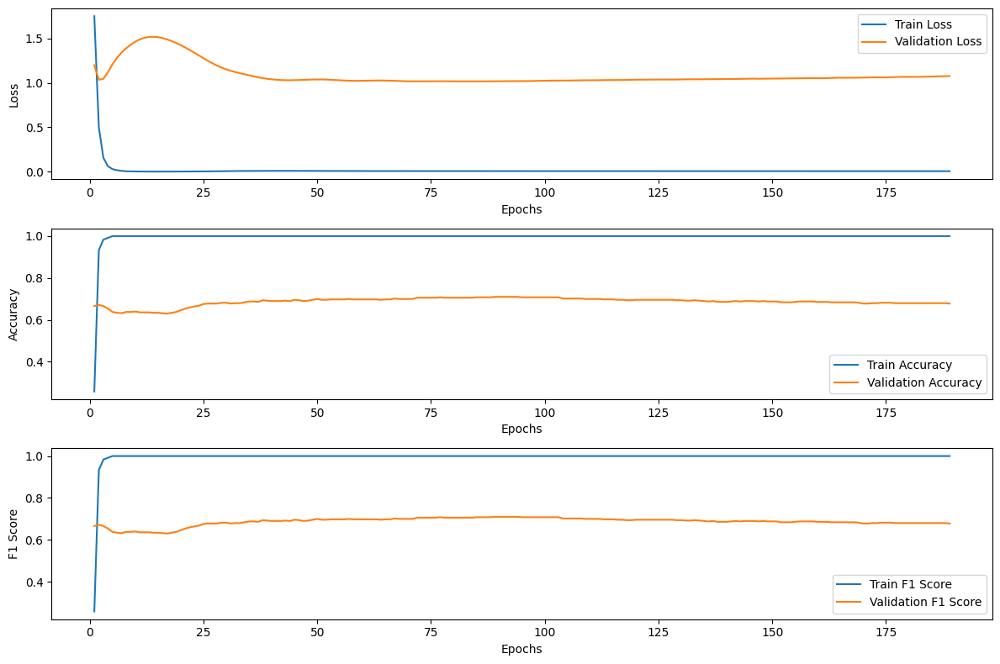

Resultados del conjunto de validación:
- Pérdida (Loss): 1.0187
- Precisión (Accuracy): 0.71
- Puntuación F1 (F1 Score): 0.71

Resultados del conjunto de prueba:
- Pérdida (Loss): 0.9882
- Precisión (Accuracy): 0.695
- Puntuación F1 (F1 Score): 0.695
Tiempo total de ejecución: 13.3525s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/5/log.txt")

#### Disease NC

##### QGCN (HGCN y PseudoHyperboloid)

###### Gridsearch

In [ ]:
gridsearch("HGCN", "PseudoHyperboloid", "disease_nc", "nc", 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_HGCN_PseudoHyperboloid_disease_nc.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.9395 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=tanh
Validation ACC: 0.9395 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=elu
Validation ACC: 0.9236 - Experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activation=tanh
Validation ACC: 0.9204 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=tanh
Validation ACC: 0.9172 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu

Top 5 experiments based on validation F1:
Validation F1: 0.848 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=tanh
Validation F1: 0.848 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=elu
Validation F1: 0.812 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=tanh
Validation F1: 0.8116 - Experiment with num_layers=3, weight_decay=0, dropout=0.5, activation

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset disease_nc --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 2 --weight-decay 0.001 --dropout 0.5 --act tanh

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 1044
INFO:root:Number of features: 1000
INFO:root:Number of classes: 2
INFO:root:NCModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=1001, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (hyp_act): HypAct(c_in=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>), c_out=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
      )
    )
  )
  (decoder

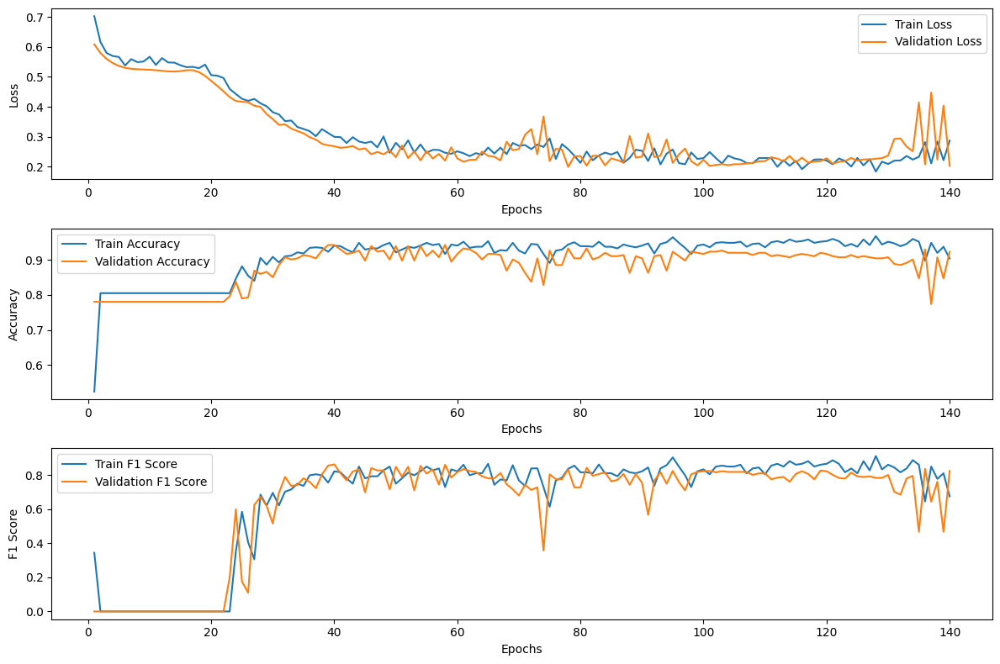

Resultados del conjunto de validación:
- Pérdida (Loss): 0.2678
- Precisión (Accuracy): 0.9427
- Puntuación F1 (F1 Score): 0.8615

Resultados del conjunto de prueba:
- Pérdida (Loss): 0.2785
- Precisión (Accuracy): 0.9038
- Puntuación F1 (F1 Score): 0.75
Tiempo total de ejecución: 91.7731s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/6/log.txt")

###### Ejecución con optimizador RiemannianAdam


In [ ]:
!python train.py --task nc --dataset disease_nc --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 2 --weight-decay 0.001 --dropout 0.5 --act tanh --optimizer RiemannianAdam

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 1044
INFO:root:Number of features: 1000
INFO:root:Number of classes: 2
INFO:root:Number of training nodes: 626
INFO:root:Number of validation nodes: 314
INFO:root:Number of test nodes: 104
INFO:root:NCModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=1001, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (hyp_act): HypAct(c_in=tensor([-1.], device='cuda:0', gra

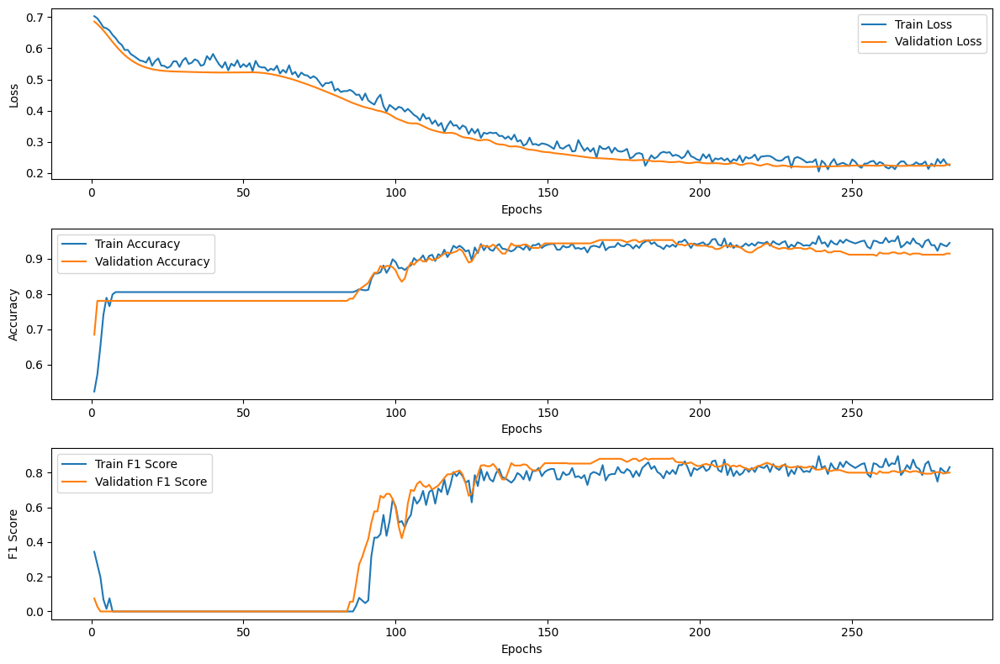

Resultados del conjunto de validación:
- Pérdida (Loss): 0.2414
- Precisión (Accuracy): 0.9522
- Puntuación F1 (F1 Score): 0.8837

Resultados del conjunto de prueba:
- Pérdida (Loss): 0.234
- Precisión (Accuracy): 0.9231
- Puntuación F1 (F1 Score): 0.8
Tiempo total de ejecución: 176.0645s


In [ ]:
plot_training_validation_metrics_nc("/content/logs/nc/2024_7_9/2/log.txt")

##### GCN y Euclidean

###### Gridsearch

In [ ]:
gridsearch("GCN", "Euclidean", "disease_nc", "nc", 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_GCN_Euclidean_disease_nc.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.9427 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=elu
Validation ACC: 0.9331 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Validation ACC: 0.9299 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Validation ACC: 0.9299 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Validation ACC: 0.9299 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=relu

Top 5 experiments based on validation F1:
Validation F1: 0.8615 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=elu
Validation F1: 0.8429 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Validation F1: 0.8421 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Validation F1: 0.8369 - Experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Validati

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset disease_nc --cuda 0 --model GCN --manifold Euclidean --num-layers 2 --weight-decay 0.001 --dropout 0.2 --act elu

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 1044
INFO:root:Number of features: 1000
INFO:root:Number of classes: 2
INFO:root:NCModel(
  (encoder): GCN(
    (layers): Sequential(
      (0): GraphConvolution(
        input_dim=1000, output_dim=128
        (linear): Linear(in_features=1000, out_features=128, bias=True)
      )
    )
  )
  (decoder): GCNDecoder(
    (cls): GraphConvolution(
      input_dim=128, output_dim=2
      (linear): Linear(in_features=128, out_features=2, bias=True)
    )
  )
)
INFO:root:Total number of parameters: 128386
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_schedu

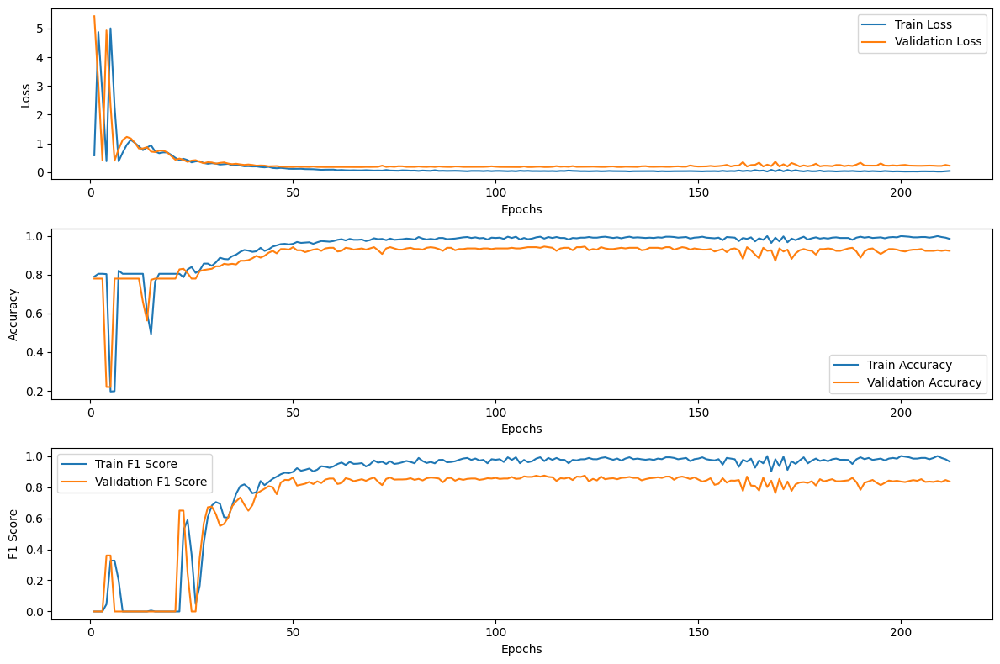

Resultados del conjunto de validación:
- Pérdida (Loss): 0.1734
- Precisión (Accuracy): 0.9459
- Puntuación F1 (F1 Score): 0.8741

Resultados del conjunto de prueba:
- Pérdida (Loss): 0.197
- Precisión (Accuracy): 0.9327
- Puntuación F1 (F1 Score): 0.8205
Tiempo total de ejecución: 3.5261s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/7/log.txt")

##### GAT y Euclidean

###### GridSearch

In [ ]:
gridsearch('GAT', 'Euclidean', 'disease_nc', 'nc', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_GAT_Euclidean_disease_nc.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.7803 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Validation ACC: 0.7803 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Validation ACC: 0.7803 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Validation ACC: 0.7803 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Validation ACC: 0.7803 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=tanh

Top 5 experiments based on validation F1:
Validation F1: 0.0 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Validation F1: 0.0 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Validation F1: 0.0 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Validation F1: 0.0 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Validation F1: 0.0 -

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset disease_nc --cuda 0 --model GAT --manifold Euclidean --num-layers 2 --weight-decay 0 --dropout 0 --act tanh

Se han truncado las últimas 5000 líneas del flujo de salida.
  warnings.warn("To get the last learning rate computed by the scheduler, "
INFO:root:Epoch: 0752 lr: 0.01 train_loss: 0.1533 train_acc: 0.8051 train_f1: 0.0000 time: 0.0344s
INFO:root:Epoch: 0752 val_loss: 0.2610 val_acc: 0.7803 val_f1: 0.0000
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:402: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  warnings.warn("To get the last learning rate computed by the scheduler, "
INFO:root:Epoch: 0753 lr: 0.01 train_loss: 0.1533 train_acc: 0.8051 train_f1: 0.0000 time: 0.0350s
INFO:root:Epoch: 0753 val_loss: 0.2611 val_acc: 0.7803 val_f1: 0.0000
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:402: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  warnings.warn("To get the last learning rate computed by the scheduler, "
INFO:root:Epoch: 0754 lr: 0.01 

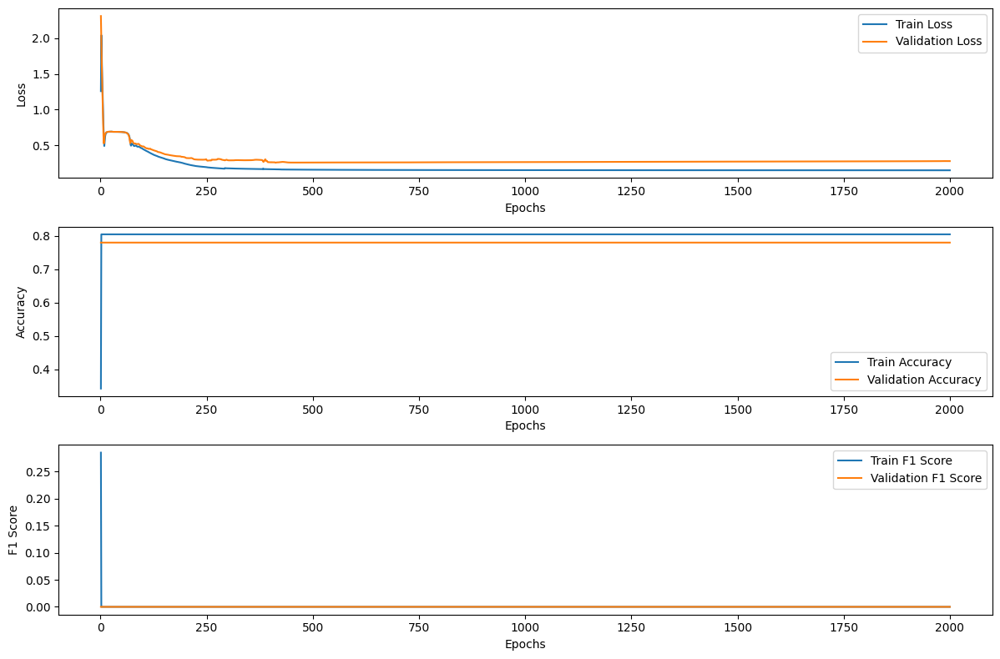

Resultados del conjunto de validación:
- Pérdida (Loss): 2.3119
- Precisión (Accuracy): 0.7803
- Puntuación F1 (F1 Score): 0.0

Resultados del conjunto de prueba:
- Pérdida (Loss): 2.0321
- Precisión (Accuracy): 0.8077
- Puntuación F1 (F1 Score): 0.0
Tiempo total de ejecución: 115.7103s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/8/log.txt")

#### Photo

##### QGCN (HGCN y PseudoHyperboloid)

###### Gridsearch

In [ ]:
gridsearch("HGCN", "PseudoHyperboloid", "photo", "nc", 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_HGCN_PseudoHyperboloid_photo.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.8945 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Validation ACC: 0.8943 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Validation ACC: 0.8928 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=tanh
Validation ACC: 0.892 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Validation ACC: 0.8919 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh

Top 5 experiments based on validation F1:
Validation F1: 0.8945 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Validation F1: 0.8943 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Validation F1: 0.8928 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.2, activation=tanh
Validation F1: 0.892 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Validation F1: 0.8919 - 

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset photo --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 2 --weight-decay 0 --dropout 0 --act tanh

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:446: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(labels)
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 7650
INFO:root:Number of features: 745
INFO:root:Number of classes: 8
INFO:root:NCModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=746, out_features=128, c=tensor([-1.], device='cuda:0', gra

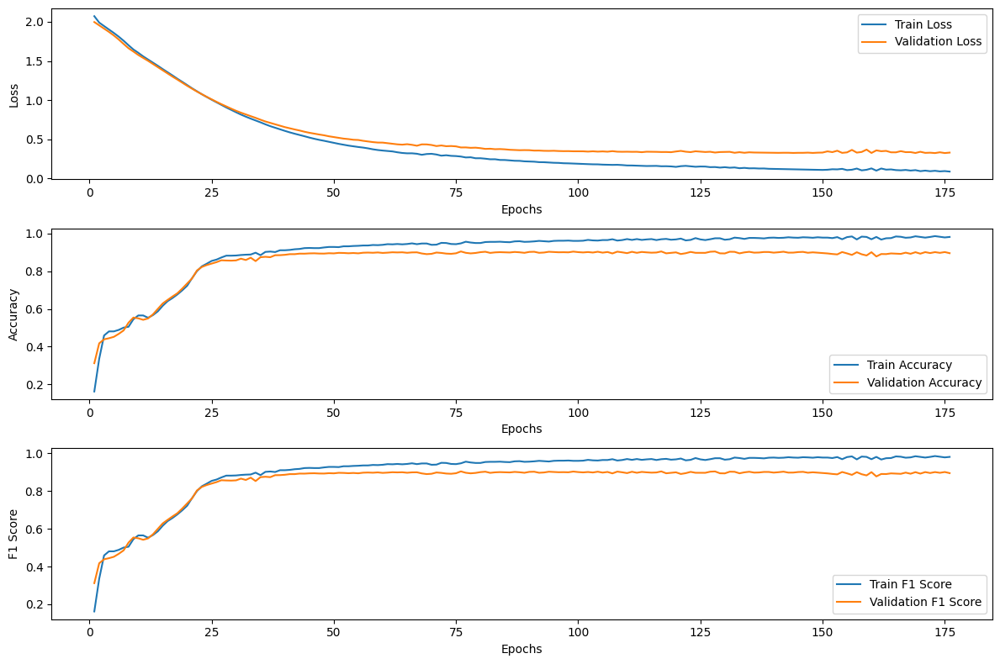

Resultados del conjunto de validación:
- Pérdida (Loss): 0.3953
- Precisión (Accuracy): 0.9047
- Puntuación F1 (F1 Score): 0.9047

Resultados del conjunto de prueba:
- Pérdida (Loss): 0.3556
- Precisión (Accuracy): 0.9199
- Puntuación F1 (F1 Score): 0.9199
Tiempo total de ejecución: 122.5662s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/9/log.txt")

###### Ejecución con optimizador RiemannianAdam


In [ ]:
!python train.py --task nc --dataset photo --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 2 --weight-decay 0 --dropout 0 --act tanh --optimizer RiemannianAdam

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:446: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(labels)
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 7650
INFO:root:Number of features: 745
INFO:root:Number of classes: 8
INFO:root:Number of training nodes: 1148
INFO:root:Number of validation nodes: 5354
INFO:root:Number of test nodes: 1148
INFO:root:NCModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): Hyperb

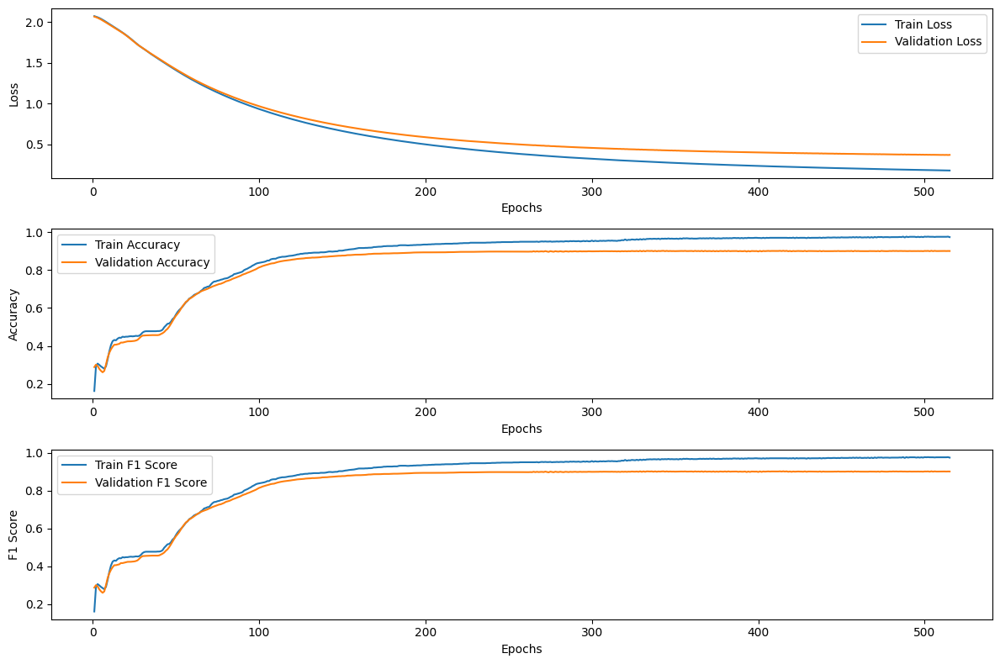

Resultados del conjunto de validación:
- Pérdida (Loss): 0.3936
- Precisión (Accuracy): 0.9019
- Puntuación F1 (F1 Score): 0.9019

Resultados del conjunto de prueba:
- Pérdida (Loss): 0.3532
- Precisión (Accuracy): 0.9207
- Puntuación F1 (F1 Score): 0.9207
Tiempo total de ejecución: 347.5262s


In [ ]:
plot_training_validation_metrics_nc("/content/logs/nc/2024_7_9/3/log.txt")

##### GCN y Euclidean

###### Gridsearch

In [ ]:
gridsearch("GCN", "Euclidean", "photo", "nc", 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_GCN_Euclidean_photo.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.8889 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Validation ACC: 0.887 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=tanh
Validation ACC: 0.8864 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Validation ACC: 0.8863 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Validation ACC: 0.8853 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh

Top 5 experiments based on validation F1:
Validation F1: 0.8889 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Validation F1: 0.887 - Experiment with num_layers=2, weight_decay=0.001, dropout=0.5, activation=tanh
Validation F1: 0.8864 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Validation F1: 0.8863 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Validation F1: 0.8

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset photo --cuda 0 --model GCN --manifold Euclidean --num-layers 2 --weight-decay 0 --dropout 0 --act tanh

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:446: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(labels)
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 7650
INFO:root:Number of features: 745
INFO:root:Number of classes: 8
INFO:root:NCModel(
  (encoder): GCN(
    (layers): Sequential(
      (0): GraphConvolution(
        input_dim=745, output_dim=128
        (linear): Linear(in_features=745, out_features=128, bias=True)
 

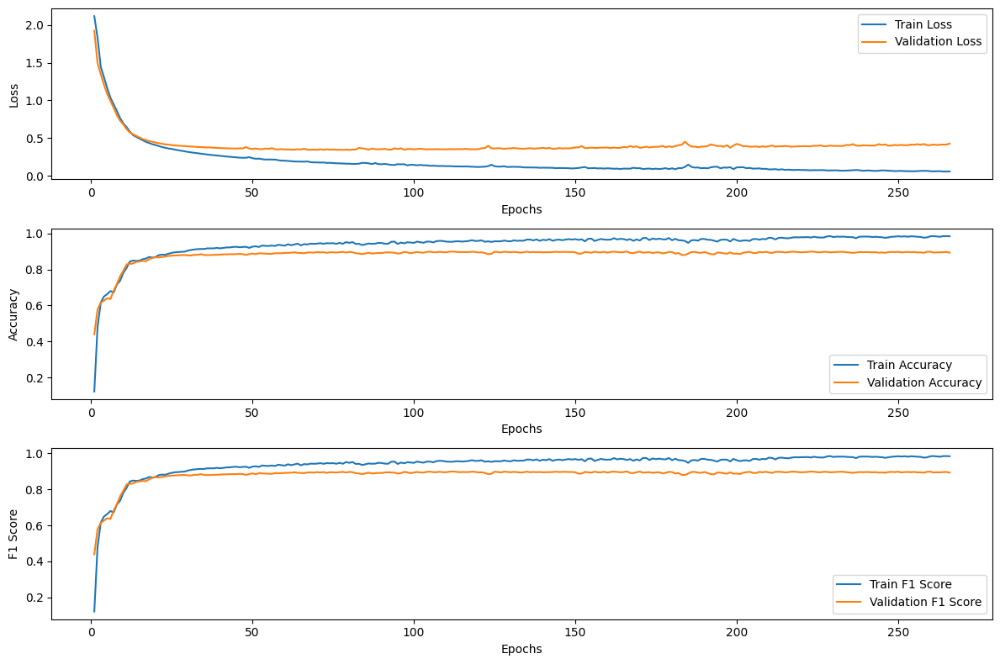

Resultados del conjunto de validación:
- Pérdida (Loss): 0.3763
- Precisión (Accuracy): 0.8999
- Puntuación F1 (F1 Score): 0.8999

Resultados del conjunto de prueba:
- Pérdida (Loss): 0.3118
- Precisión (Accuracy): 0.9146
- Puntuación F1 (F1 Score): 0.9146
Tiempo total de ejecución: 6.1939s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/10/log.txt")

##### GAT y Euclidean

###### GridSearch

In [ ]:
gridsearch('GAT', 'Euclidean', 'photo', 'nc', 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_GAT_Euclidean_photo.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.8547 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=tanh

Top 5 experiments based on validation F1:
Validation F1: 0.8547 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=tanh


###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset photo --cuda 0 --model GAT --manifold Euclidean --num-layers 3 --weight-decay 0.001 --dropout 0 --act tanh

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:446: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(labels)
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 7650
INFO:root:Number of features: 745
INFO:root:Number of classes: 8
INFO:root:NCModel(
  (encoder): GAT(
    (layers): Sequential(
      (0): GraphAttentionLayer(
        (attention_0): SpGraphAttentionLayer (745 -> 32)
        (attention_1): SpGraphAttentionLayer (745 

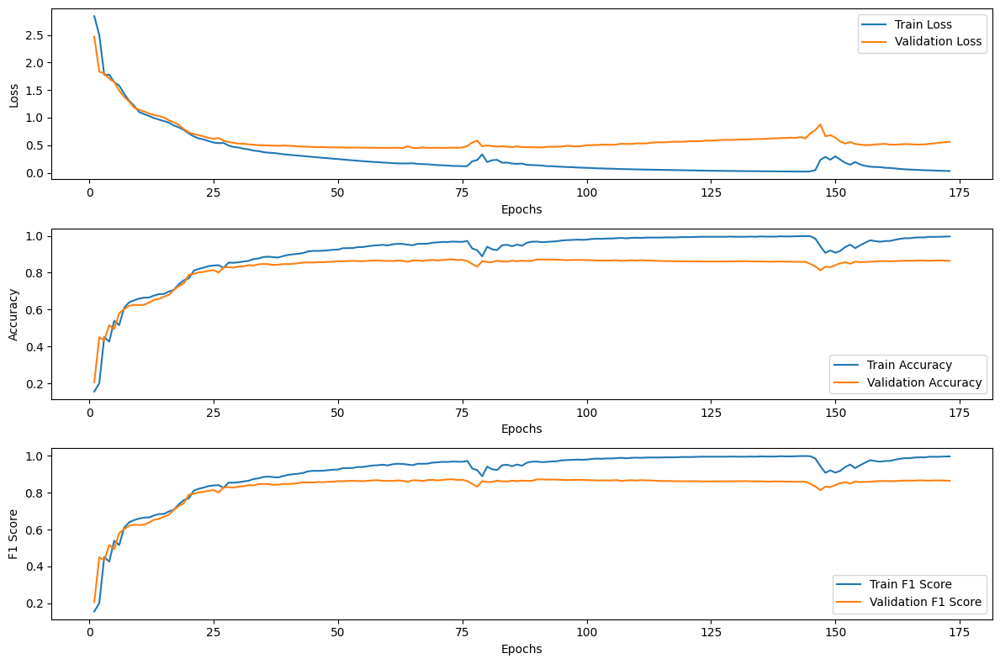

Resultados del conjunto de validación:
- Pérdida (Loss): 0.4549
- Precisión (Accuracy): 0.8721
- Puntuación F1 (F1 Score): 0.8721

Resultados del conjunto de prueba:
- Pérdida (Loss): 0.4021
- Precisión (Accuracy): 0.885
- Puntuación F1 (F1 Score): 0.885
Tiempo total de ejecución: 29.6361s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/11/log.txt")

#### Airport

##### QGCN (HGCN y PseudoHyperboloid)

###### Gridsearch

In [ ]:
gridsearch("HGCN", "PseudoHyperboloid", "airport", "nc", 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_HGCN_PseudoHyperboloid_airport.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.6537 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=relu
Validation ACC: 0.6116 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation ACC: 0.6057 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Validation ACC: 0.6044 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Validation ACC: 0.6026 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=tanh

Top 5 experiments based on validation F1:
Validation F1: 0.6537 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=relu
Validation F1: 0.6116 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation F1: 0.6057 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Validation F1: 0.6044 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Validation F1:

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset airport --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 3 --weight-decay 0 --dropout 0 --act relu

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 3188
INFO:root:Number of features: 11
INFO:root:Number of classes: 4
INFO:root:NCModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=12, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (hyp_act): HypAct(c_in=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>), c_out=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
      )
      (1): HyperbolicGra

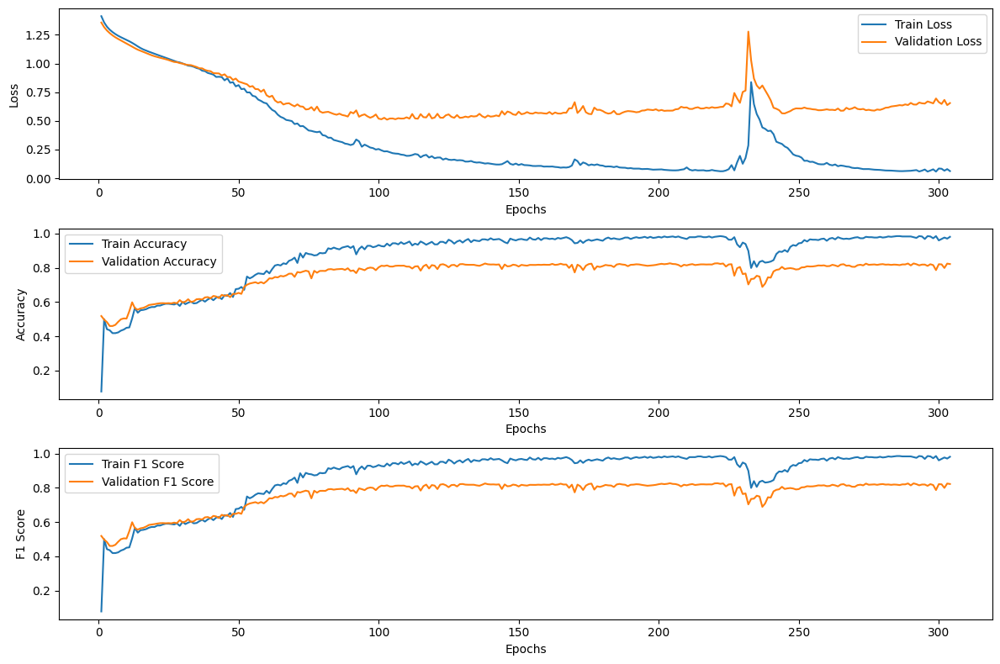

Resultados del conjunto de validación:
- Pérdida (Loss): 0.589
- Precisión (Accuracy): 0.8266
- Puntuación F1 (F1 Score): 0.8266

Resultados del conjunto de prueba:
- Pérdida (Loss): 0.6967
- Precisión (Accuracy): 0.7782
- Puntuación F1 (F1 Score): 0.7782
Tiempo total de ejecución: 363.7548s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/12/log.txt")

###### Ejecución con optimizador RiemannianAdam


In [ ]:
!python train.py --task nc --dataset airport --cuda 0 --model HGCN --manifold PseudoHyperboloid --num-layers 3 --weight-decay 0 --dropout 0 --act relu --optimizer RiemannianAdam

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 3188
INFO:root:Number of features: 11
INFO:root:Number of classes: 4
INFO:root:Number of training nodes: 478
INFO:root:Number of validation nodes: 2232
INFO:root:Number of test nodes: 478
INFO:root:NCModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=12, out_features=128, c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (agg): HypAgg(c=tensor([-1.], device='cuda:0', grad_fn=<ToCopyBackward0>))
        (hyp_act): HypAct(c_in=tensor([-1.], device='cuda:0', grad_f

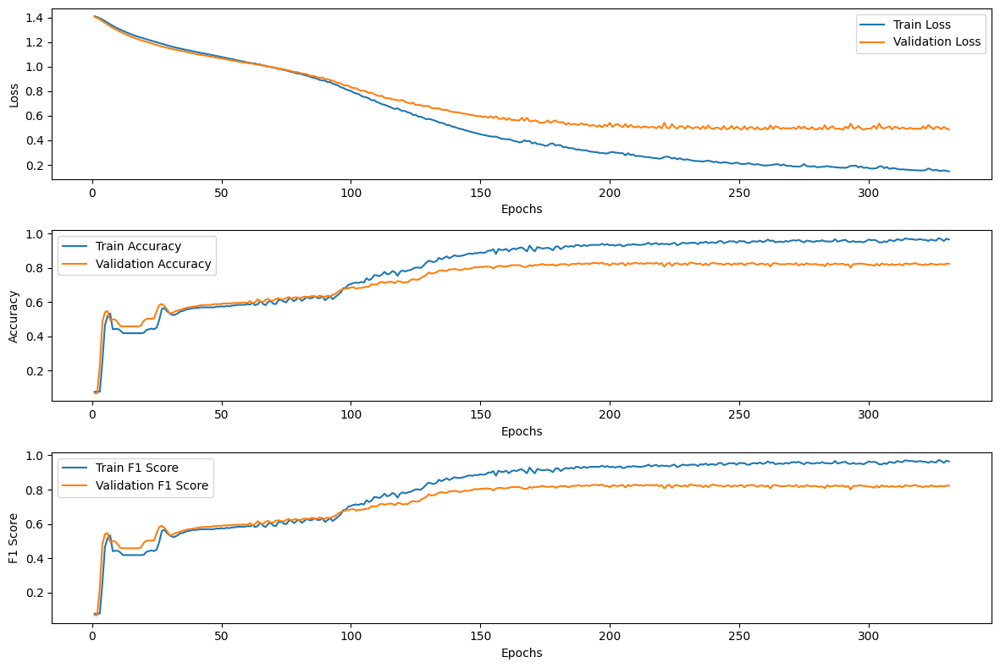

Resultados del conjunto de validación:
- Pérdida (Loss): 0.508
- Precisión (Accuracy): 0.8306
- Puntuación F1 (F1 Score): 0.8306

Resultados del conjunto de prueba:
- Pérdida (Loss): 0.5558
- Precisión (Accuracy): 0.8138
- Puntuación F1 (F1 Score): 0.8138
Tiempo total de ejecución: 387.0655s


In [ ]:
plot_training_validation_metrics_nc("/content/logs/nc/2024_7_9/4/log.txt")

##### GCN y Euclidean

###### Gridsearch

In [ ]:
gridsearch("GCN", "Euclidean", "airport", "nc", 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_GCN_Euclidean_airport.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.7496 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=relu
Validation ACC: 0.7397 - Experiment with num_layers=3, weight_decay=0, dropout=0.2, activation=relu
Validation ACC: 0.7379 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation ACC: 0.7177 - Experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activation=relu
Validation ACC: 0.6985 - Experiment with num_layers=3, weight_decay=0.001, dropout=0.5, activation=relu

Top 5 experiments based on validation F1:
Validation F1: 0.7496 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=relu
Validation F1: 0.7397 - Experiment with num_layers=3, weight_decay=0, dropout=0.2, activation=relu
Validation F1: 0.7379 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation F1: 0.7177 - Experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activation=relu
Valida

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset airport --cuda 0 --model GCN --manifold Euclidean --num-layers 3 --weight-decay 0 --dropout 0 --act relu

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 3188
INFO:root:Number of features: 11
INFO:root:Number of classes: 4
INFO:root:NCModel(
  (encoder): GCN(
    (layers): Sequential(
      (0): GraphConvolution(
        input_dim=11, output_dim=128
        (linear): Linear(in_features=11, out_features=128, bias=True)
      )
      (1): GraphConvolution(
        input_dim=128, output_dim=128
        (linear): Linear(in_features=128, out_features=128, bias=True)
      )
    )
  )
  (decoder): GCNDecoder(
    (cls): GraphConvolution(
      input_dim=128, output_dim=4
      (linear): Linear(in_features=128, out_f

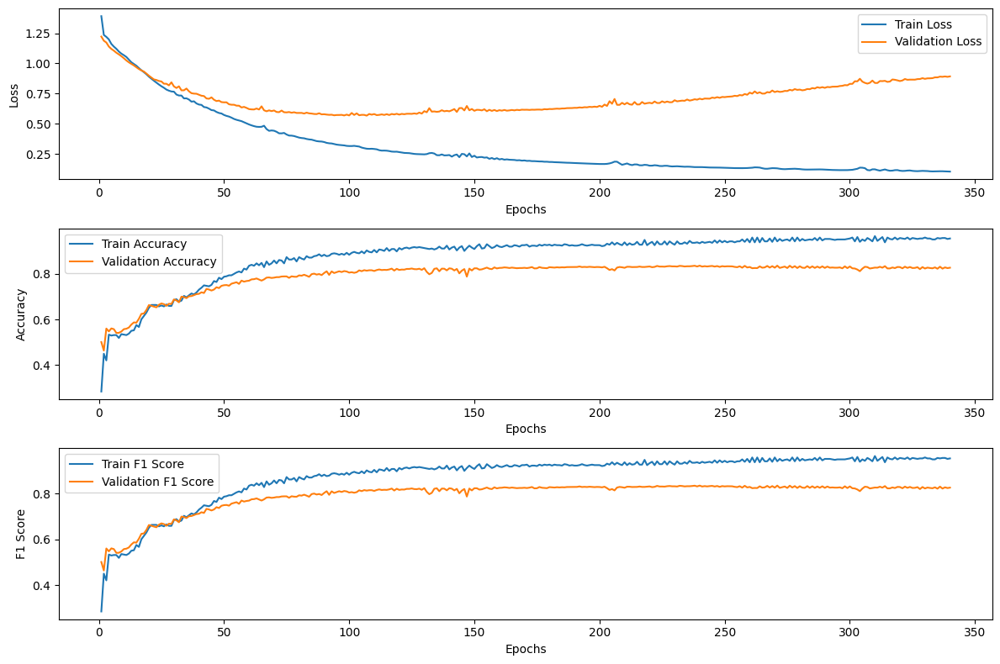

Resultados del conjunto de validación:
- Pérdida (Loss): 0.7073
- Precisión (Accuracy): 0.8351
- Puntuación F1 (F1 Score): 0.8351

Resultados del conjunto de prueba:
- Pérdida (Loss): 0.8362
- Precisión (Accuracy): 0.818
- Puntuación F1 (F1 Score): 0.818
Tiempo total de ejecución: 6.9234s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/13/log.txt")

##### GAT y Euclidean

###### GridSearch

In [ ]:
gridsearch("GAT", "Euclidean", "airport", "nc", 50)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_GAT_Euclidean_airport.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.7401 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=relu
Validation ACC: 0.7366 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation ACC: 0.6909 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Validation ACC: 0.6891 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Validation ACC: 0.6725 - Experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activation=relu

Top 5 experiments based on validation F1:
Validation F1: 0.7401 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=relu
Validation F1: 0.7366 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation F1: 0.6909 - Experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Validation F1: 0.6891 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Validation F1:

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset airport --cuda 0 --model GAT --manifold Euclidean --num-layers 3 --weight-decay 0 --dropout 0 --act relu

INFO:root:Using: cuda:0
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 3188
INFO:root:Number of features: 11
INFO:root:Number of classes: 4
INFO:root:NCModel(
  (encoder): GAT(
    (layers): Sequential(
      (0): GraphAttentionLayer(
        (attention_0): SpGraphAttentionLayer (11 -> 32)
        (attention_1): SpGraphAttentionLayer (11 -> 32)
        (attention_2): SpGraphAttentionLayer (11 -> 32)
        (attention_3): SpGraphAttentionLayer (11 -> 32)
      )
      (1): GraphAttentionLayer(
        (attention_0): SpGraphAttentionLayer (128 -> 32)
        (attention_1): SpGraphAttentionLayer (128 -> 32)
        (attention_2): 

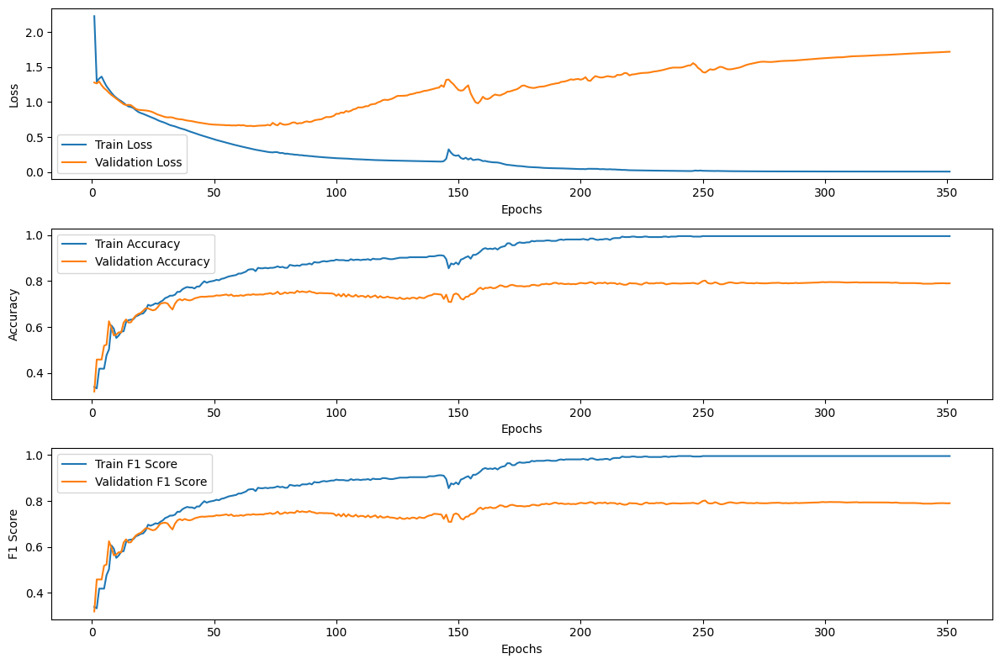

Resultados del conjunto de validación:
- Pérdida (Loss): 1.4215
- Precisión (Accuracy): 0.802
- Puntuación F1 (F1 Score): 0.802

Resultados del conjunto de prueba:
- Pérdida (Loss): 1.7189
- Precisión (Accuracy): 0.7929
- Puntuación F1 (F1 Score): 0.7929
Tiempo total de ejecución: 40.6448s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/14/log.txt")

#### PPI

##### QGCN (HGCN y PseudoHyperboloid)

###### Gridsearch

In [ ]:
gridsearch("HGCN", "PseudoHyperboloid", "ppi", "nc", 10)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_HGCN_PseudoHyperboloid_ppi.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.6684 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Validation ACC: 0.6684 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Validation ACC: 0.6684 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Validation ACC: 0.6684 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Validation ACC: 0.6684 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh

Top 5 experiments based on validation F1:
Validation F1: 0.6684 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Validation F1: 0.6684 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Validation F1: 0.6684 - Experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Validation F1: 0.6684 - Experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Validation F1: 0.6684 - Experime

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset ppi --cuda -1 --model HGCN --manifold PseudoHyperboloid --num-layers 2 --weight-decay 0 --dropout 0 --act relu

INFO:root:Using: cpu
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:446: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(labels)
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 56944
INFO:root:Number of features: 50
INFO:root:Number of classes: 26
INFO:root:NCModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): HyperbolicGraphConvolution(
        (linear): HypLinear(in_features=51, out_features=128, c=tensor([-1.], requires_grad=True))
  

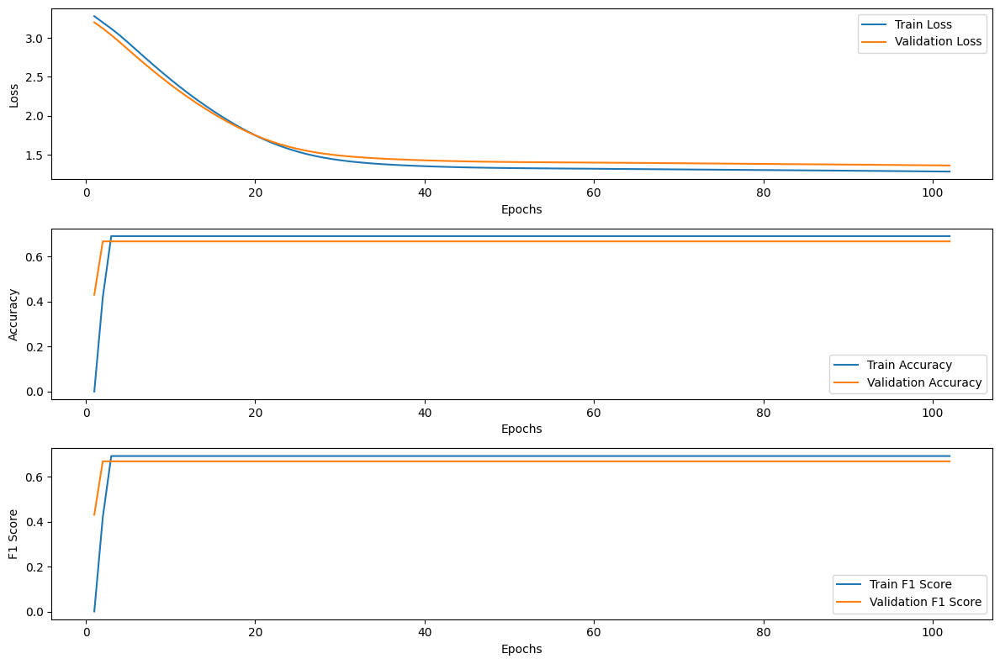

Resultados del conjunto de validación:
- Pérdida (Loss): 3.1213
- Precisión (Accuracy): 0.6684
- Puntuación F1 (F1 Score): 0.6684

Resultados del conjunto de prueba:
- Pérdida (Loss): 3.1217
- Precisión (Accuracy): 0.6736
- Puntuación F1 (F1 Score): 0.6736
Tiempo total de ejecución: 562.6889s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/15/log.txt")

###### Ejecución con optimizador RiemannianAdam


In [ ]:
!python train.py --task nc --dataset ppi --cuda -1 --model HGCN --manifold PseudoHyperboloid --num-layers 2 --weight-decay 0 --dropout 0 --act relu --optimizer RiemannianAdam --epochs 100

INFO:root:Using: cpu
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:446: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(labels)
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 56944
INFO:root:Number of features: 50
INFO:root:Number of classes: 26
INFO:root:Number of training nodes: 44906
INFO:root:Number of validation nodes: 6514
INFO:root:Number of test nodes: 5524
INFO:root:NCModel(
  (encoder): HGCN(
    (layers): Sequential(
      (0): Hyperbo

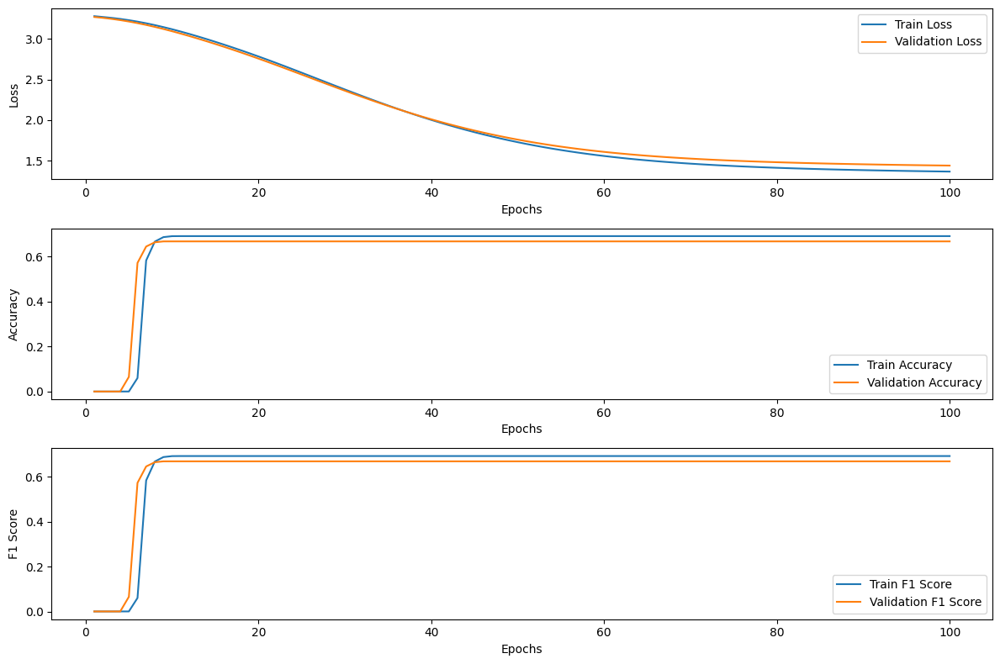

Resultados del conjunto de validación:
- Pérdida (Loss): 3.0928
- Precisión (Accuracy): 0.6684
- Puntuación F1 (F1 Score): 0.6684

Resultados del conjunto de prueba:
- Pérdida (Loss): 3.0932
- Precisión (Accuracy): 0.6736
- Puntuación F1 (F1 Score): 0.6736
Tiempo total de ejecución: 531.5306s


In [ ]:
plot_training_validation_metrics_nc("/content/logs/nc/2024_7_9/6/log.txt")

##### GCN y Euclidean

###### Gridsearch

In [ ]:
gridsearch("GCN", "Euclidean", "ppi", "nc", 10)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_GCN_Euclidean_ppi.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.6692 - Experiment with num_layers=3, weight_decay=0, dropout=0.5, activation=elu
Validation ACC: 0.6689 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=elu
Validation ACC: 0.6689 - Experiment with num_layers=3, weight_decay=0, dropout=0.2, activation=elu
Validation ACC: 0.6689 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=elu
Validation ACC: 0.6689 - Experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activation=elu

Top 5 experiments based on validation F1:
Validation F1: 0.6692 - Experiment with num_layers=3, weight_decay=0, dropout=0.5, activation=elu
Validation F1: 0.6689 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=elu
Validation F1: 0.6689 - Experiment with num_layers=3, weight_decay=0, dropout=0.2, activation=elu
Validation F1: 0.6689 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=elu
Validation F1: 0.6689 -

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset ppi --cuda -1 --model GCN --manifold Euclidean --num-layers 3 --weight-decay 0 --dropout 0.5 --act elu

INFO:root:Using: cpu
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:446: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(labels)
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 56944
INFO:root:Number of features: 50
INFO:root:Number of classes: 26
INFO:root:Number of training nodes: 44906
INFO:root:Number of validation nodes: 6514
INFO:root:Number of test nodes: 5524
INFO:root:NCModel(
  (encoder): GCN(
    (layers): Sequential(
      (0): GraphCon

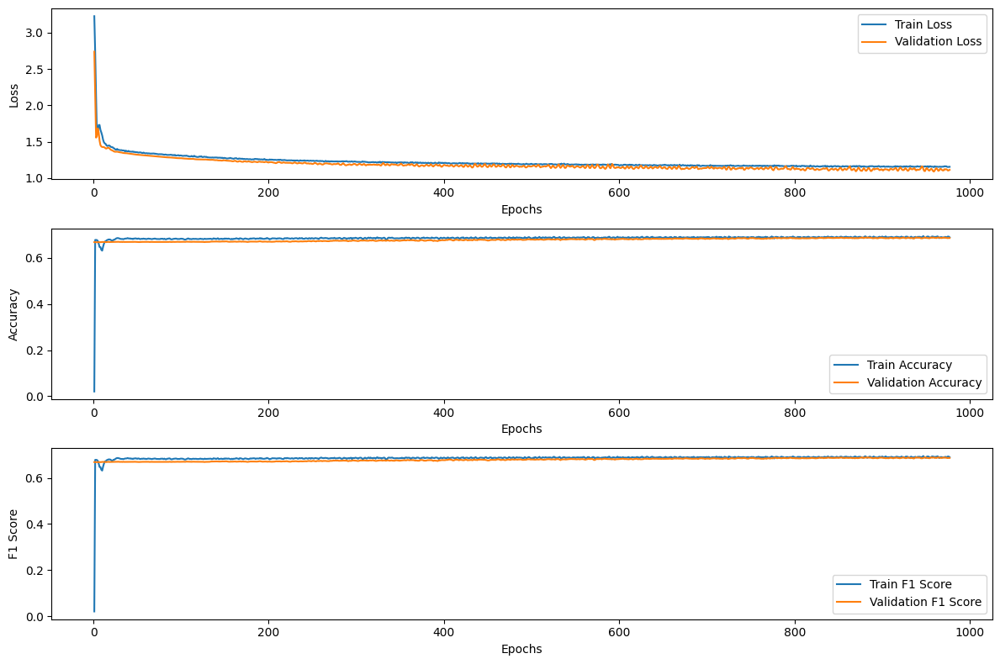

Resultados del conjunto de validación:
- Pérdida (Loss): 1.0975
- Precisión (Accuracy): 0.6888
- Puntuación F1 (F1 Score): 0.6888

Resultados del conjunto de prueba:
- Pérdida (Loss): 1.0566
- Precisión (Accuracy): 0.6986
- Puntuación F1 (F1 Score): 0.6986
Tiempo total de ejecución: 869.7953s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/16/log.txt")

##### GAT y Euclidean

###### GridSearch

In [ ]:
gridsearch("GAT", "Euclidean", "ppi", "nc", 10)

Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.2, activation=elu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=relu
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=tanh
Running experiment with num_layers=2, weight_decay=0, dropout=0.5, activation=elu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=relu
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=tanh
Running experiment with num_layers=2, weight_decay=0.001, dropout=0, activation=elu
Running 

In [ ]:
show_best_results_nc("grid_search_results_nc_GAT_Euclidean_ppi.txt", 5)

Top 5 experiments based on validation ACC:
Validation ACC: 0.6684 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=relu
Validation ACC: 0.6684 - Experiment with num_layers=3, weight_decay=0, dropout=0.2, activation=relu
Validation ACC: 0.6684 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation ACC: 0.6684 - Experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activation=relu
Validation ACC: 0.6676 - Experiment with num_layers=3, weight_decay=0, dropout=0.5, activation=tanh

Top 5 experiments based on validation F1:
Validation F1: 0.6684 - Experiment with num_layers=3, weight_decay=0, dropout=0, activation=relu
Validation F1: 0.6684 - Experiment with num_layers=3, weight_decay=0, dropout=0.2, activation=relu
Validation F1: 0.6684 - Experiment with num_layers=3, weight_decay=0.001, dropout=0, activation=relu
Validation F1: 0.6684 - Experiment with num_layers=3, weight_decay=0.001, dropout=0.2, activation=relu
Validation

###### Ejecución con los mejores parámetros

In [ ]:
!python train.py --task nc --dataset ppi --cuda -1 --model GAT --manifold Euclidean --num-layers 3 --weight-decay 0 --dropout 0 --act relu --epochs 20

INFO:root:Using: cpu
INFO:root:Using seed 1234.
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:446: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(labels)
/content/GCN-Pseudo-Riemannian-Manifold/utils/data_utils.py:111: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:621.)
  return torch.sparse.FloatTensor(indices, values, shape)
INFO:root:Number of nodes: 56944
INFO:root:Number of features: 50
INFO:root:Number of classes: 26
INFO:root:Number of training nodes: 44906
INFO:root:Number of validation nodes: 6514
INFO:root:Number of test nodes: 5524
INFO:root:NCModel(
  (encoder): GAT(
    (layers): Sequential(
      (0): GraphAtt

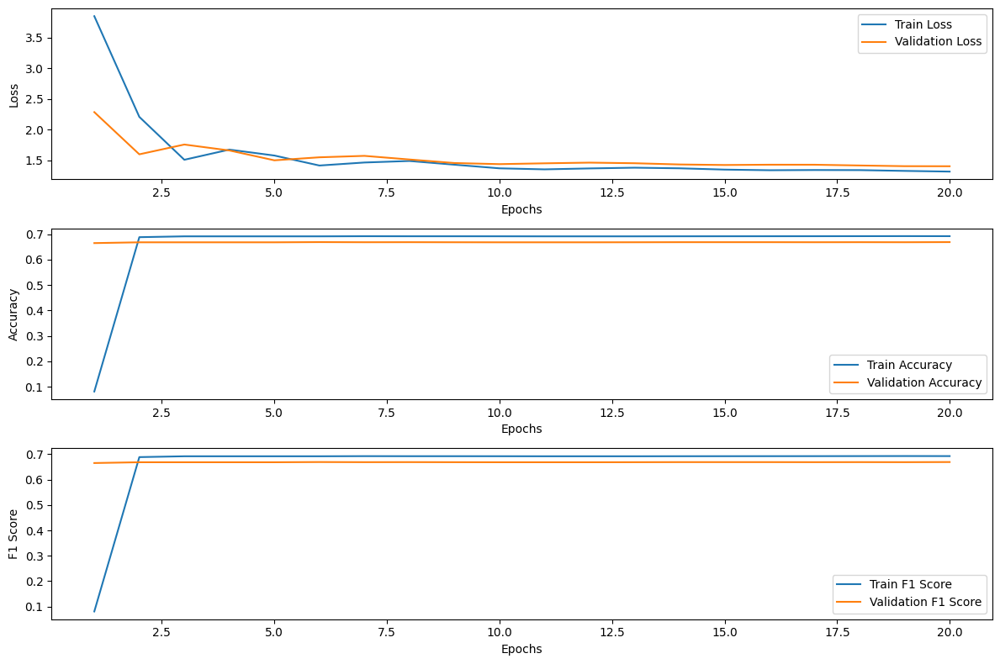

Resultados del conjunto de validación:
- Pérdida (Loss): 1.5497
- Precisión (Accuracy): 0.6692
- Puntuación F1 (F1 Score): 0.6692

Resultados del conjunto de prueba:
- Pérdida (Loss): 1.5303
- Precisión (Accuracy): 0.6743
- Puntuación F1 (F1 Score): 0.6743
Tiempo total de ejecución: 1339.4305s


In [ ]:
plot_training_validation_metrics_nc("/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/17/log.txt")

## 3. Resultados

### Resultados Link Prediction

**Cora**

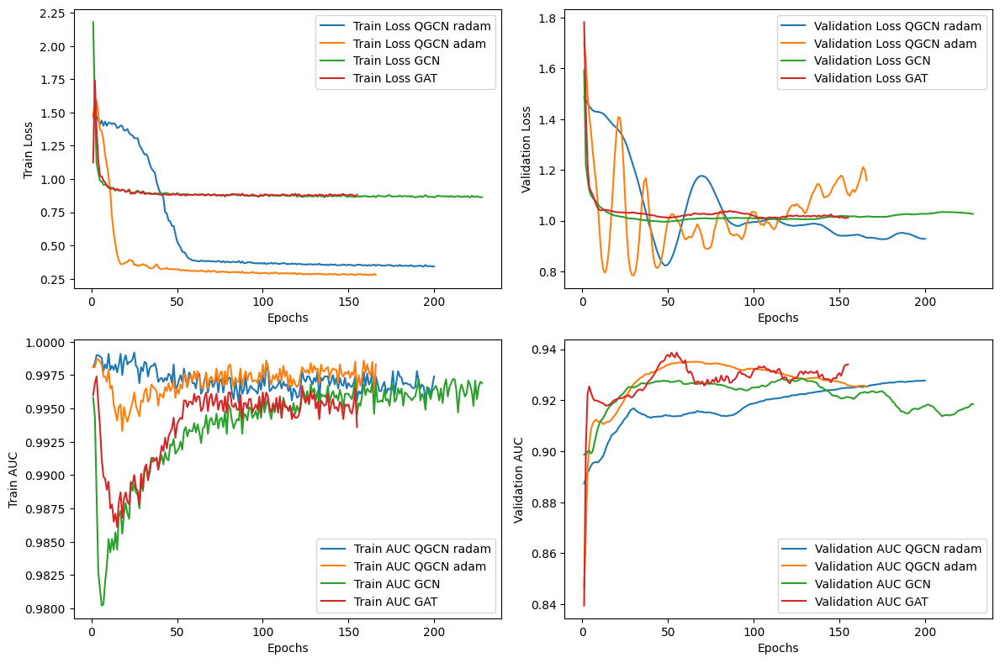

Resultados finales del modelo QGCN radam:
Conjunto de validación - Pérdida (Loss): 0.9284, ROC: 0.9277, AP: 0.9177
Conjunto de prueba - Pérdida (Loss): 0.959, ROC: 0.9331, AP: 0.9224


Resultados finales del modelo QGCN adam:
Conjunto de validación - Pérdida (Loss): 0.9673, ROC: 0.9351, AP: 0.9256
Conjunto de prueba - Pérdida (Loss): 1.0412, ROC: 0.9333, AP: 0.9279


Resultados finales del modelo GCN:
Conjunto de validación - Pérdida (Loss): 1.0047, ROC: 0.9285, AP: 0.9199
Conjunto de prueba - Pérdida (Loss): 1.0132, ROC: 0.9224, AP: 0.9242


Resultados finales del modelo GAT:
Conjunto de validación - Pérdida (Loss): 1.015, ROC: 0.9387, AP: 0.9294
Conjunto de prueba - Pérdida (Loss): 0.9937, ROC: 0.9338, AP: 0.928




In [ ]:
log_files = [
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_3/0/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/0/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/1/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/2/log.txt"
]

# Nombres de los modelos
model_names = ["QGCN radam", "QGCN adam", "GCN", "GAT"]

# Comparar modelos
compare_models_lp(log_files, model_names)

**Photo**

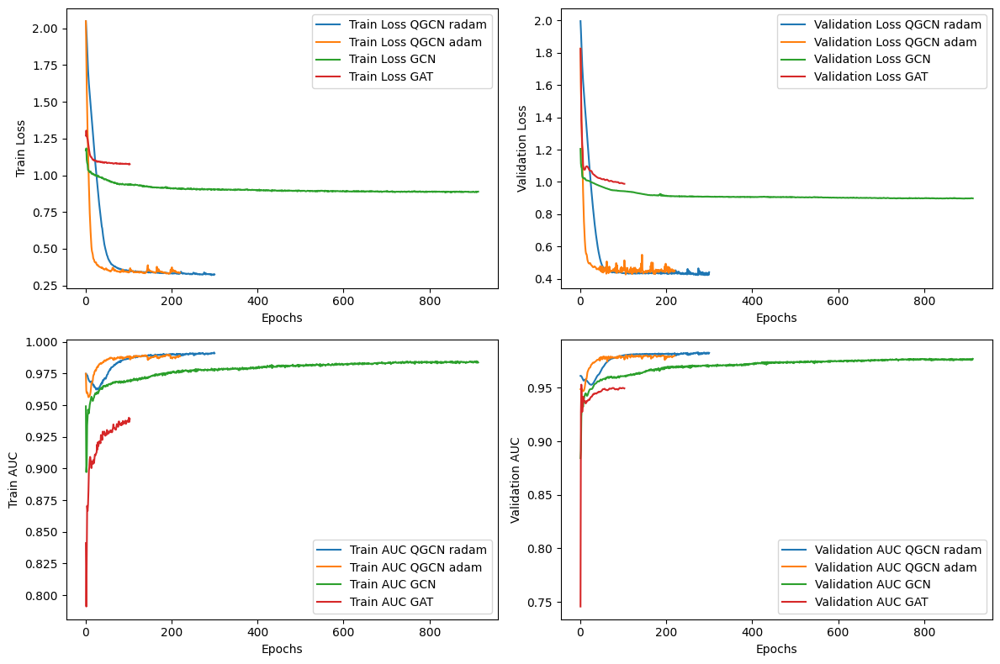

Resultados finales del modelo QGCN radam:
Conjunto de validación - Pérdida (Loss): 0.4326, ROC: 0.9831, AP: 0.9808
Conjunto de prueba - Pérdida (Loss): 0.4107, ROC: 0.9852, AP: 0.9805


Resultados finales del modelo QGCN adam:
Conjunto de validación - Pérdida (Loss): 0.4605, ROC: 0.9808, AP: 0.9782
Conjunto de prueba - Pérdida (Loss): 0.442, ROC: 0.9822, AP: 0.9776


Resultados finales del modelo GCN:
Conjunto de validación - Pérdida (Loss): 0.8984, ROC: 0.9773, AP: 0.9748
Conjunto de prueba - Pérdida (Loss): 0.8976, ROC: 0.9786, AP: 0.9728


Resultados finales del modelo GAT:
Conjunto de validación - Pérdida (Loss): 1.3846, ROC: 0.953, AP: 0.9465
Conjunto de prueba - Pérdida (Loss): 1.3947, ROC: 0.9551, AP: 0.9458




In [ ]:
log_files = [
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_3/3/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/9/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/10/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/11/log.txt"
]

# Nombres de los modelos
model_names = ["QGCN radam", "QGCN adam", "GCN", "GAT"]

# Comparar modelos
compare_models_lp(log_files, model_names)

**Airport**

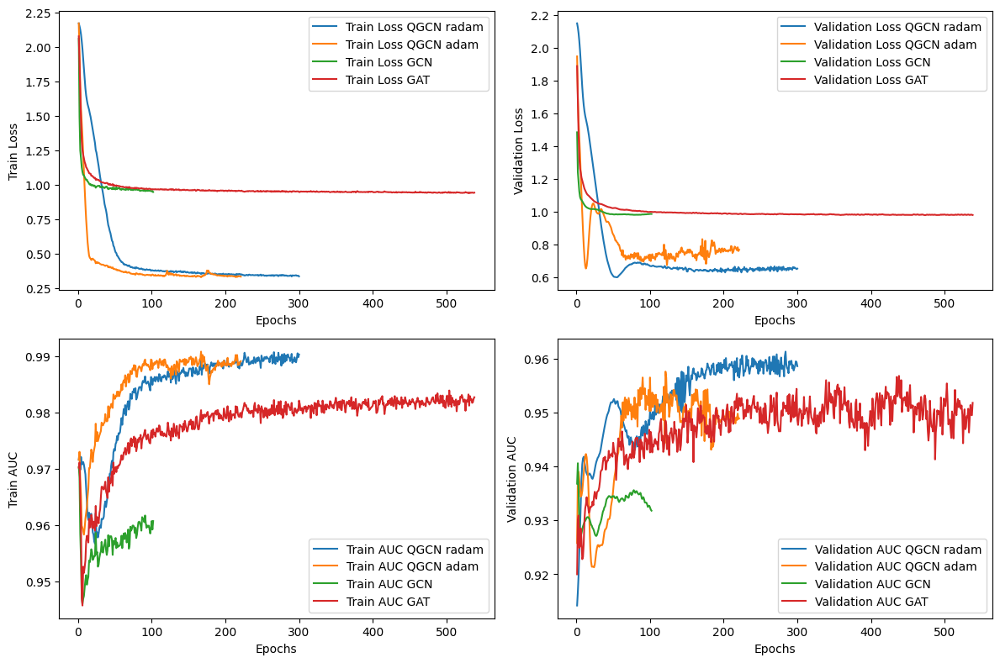

Resultados finales del modelo QGCN radam:
Conjunto de validación - Pérdida (Loss): 0.6538, ROC: 0.9613, AP: 0.9671
Conjunto de prueba - Pérdida (Loss): 0.6374, ROC: 0.9608, AP: 0.9541


Resultados finales del modelo QGCN adam:
Conjunto de validación - Pérdida (Loss): 0.7686, ROC: 0.9576, AP: 0.9624
Conjunto de prueba - Pérdida (Loss): 0.7676, ROC: 0.9551, AP: 0.948


Resultados finales del modelo GCN:
Conjunto de validación - Pérdida (Loss): 1.2431, ROC: 0.9406, AP: 0.9431
Conjunto de prueba - Pérdida (Loss): 1.2557, ROC: 0.9323, AP: 0.9227


Resultados finales del modelo GAT:
Conjunto de validación - Pérdida (Loss): 0.9823, ROC: 0.9568, AP: 0.9576
Conjunto de prueba - Pérdida (Loss): 0.9969, ROC: 0.9465, AP: 0.9383




In [ ]:
log_files = [
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_3/4/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/12/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/13/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/14/log.txt"
]

# Nombres de los modelos
model_names = ["QGCN radam", "QGCN adam", "GCN", "GAT"]

# Comparar modelos
compare_models_lp(log_files, model_names)

**PPI**

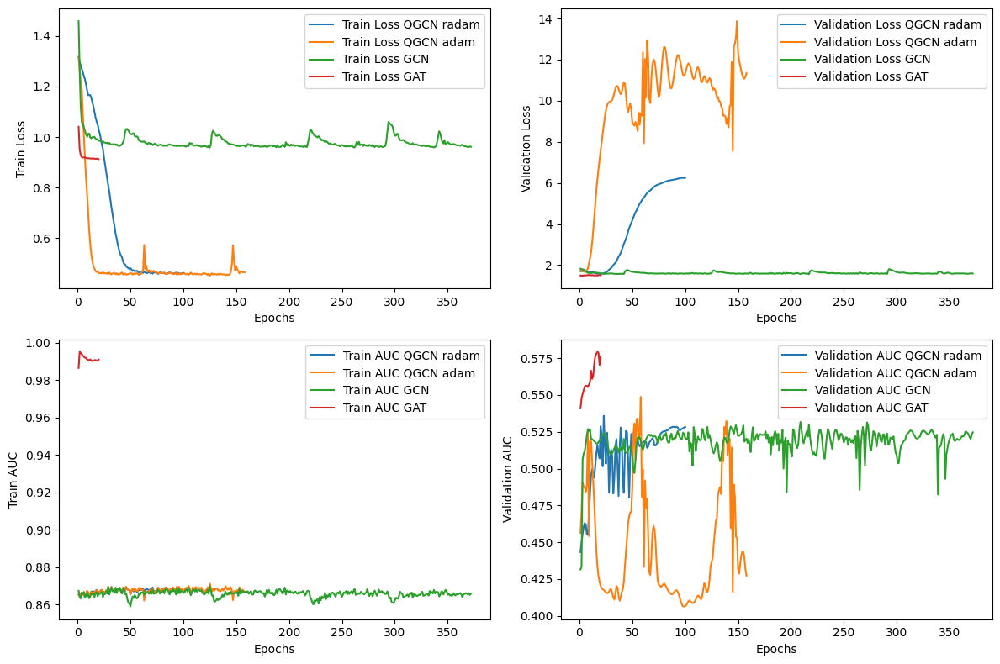

Resultados finales del modelo QGCN radam:
Conjunto de validación - Pérdida (Loss): 1.591, ROC: 0.5358, AP: 0.5233
Conjunto de prueba - Pérdida (Loss): 1.584, ROC: 0.5393, AP: 0.5256


Resultados finales del modelo QGCN adam:
Conjunto de validación - Pérdida (Loss): 9.3906, ROC: 0.5487, AP: 0.5331
Conjunto de prueba - Pérdida (Loss): 9.3889, ROC: 0.548, AP: 0.5333


Resultados finales del modelo GCN:
Conjunto de validación - Pérdida (Loss): 1.5819, ROC: 0.5314, AP: 0.5215
Conjunto de prueba - Pérdida (Loss): 1.5804, ROC: 0.5293, AP: 0.5211


Resultados finales del modelo GAT:
Conjunto de validación - Pérdida (Loss): 1.5003, ROC: 0.5792, AP: 0.5408
Conjunto de prueba - Pérdida (Loss): 1.4978, ROC: 0.5793, AP: 0.5413




In [ ]:
log_files = [
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_3/5/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/15/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/16/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/17/log.txt"
]

# Nombres de los modelos
model_names = ["QGCN radam", "QGCN adam", "GCN", "GAT"]

# Comparar modelos
compare_models_lp(log_files, model_names)

**Resultados finales**

In [ ]:
# Crear la tabla de resultados
results_df_lp = create_results_lp_table()

# Mostrar la tabla de resultados
print(results_df_lp)

       Dataset Model  Validation Loss  Validation ROC  Validation AP  \
0         cora  QGCN           0.9673          0.9351         0.9256   
1         cora   GCN           1.0047          0.9285         0.9199   
2         cora   GAT           1.0150          0.9387         0.9294   
3     citeseer  QGCN           1.1294          0.9640         0.9676   
4     citeseer   GCN           0.9742          0.9510         0.9596   
5     citeseer   GAT           1.0358          0.9633         0.9658   
6   disease_nc  QGCN           5.3153          0.7921         0.6946   
7   disease_nc   GCN           1.2526          0.7091         0.6279   
8   disease_nc   GAT           1.1809          0.7958         0.7158   
9        photo  QGCN           0.4605          0.9808         0.9782   
10       photo   GCN           0.8984          0.9773         0.9748   
11       photo   GAT           1.3846          0.9530         0.9465   
12     airport  QGCN           0.7686          0.9576         0.

### Resultados Node Classification

**Cora**

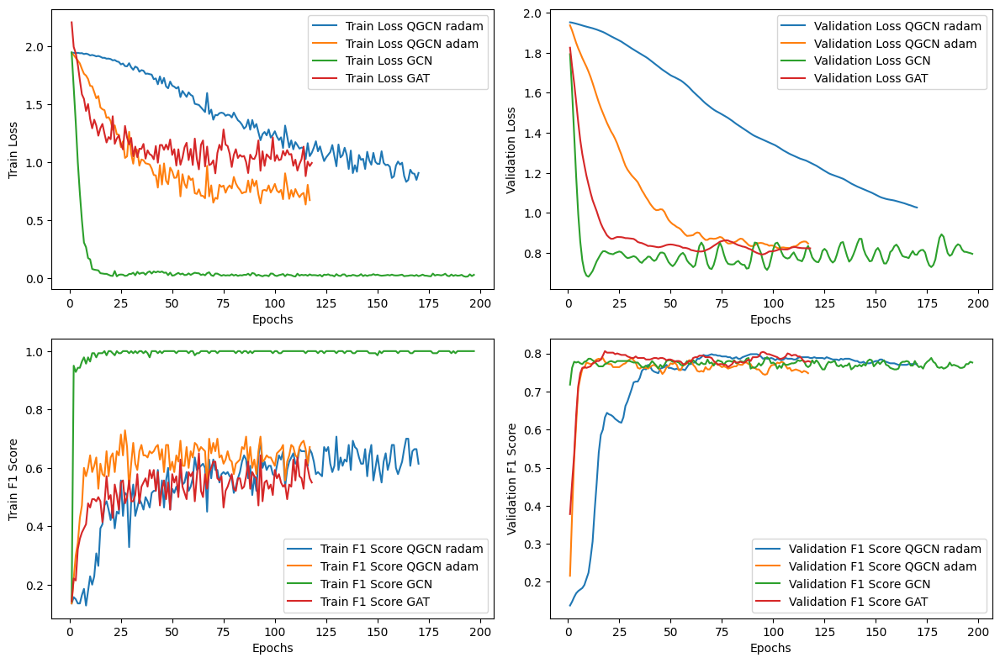

Resultados finales del modelo QGCN radam:
Conjunto de validación - Pérdida (Loss): 1.5228, Precisión (Accuracy): 0.798, Puntuación F1 (F1 Score): 0.798
Conjunto de prueba - Pérdida (Loss): 1.5079, Precisión (Accuracy): 0.81, Puntuación F1 (F1 Score): 0.81


Resultados finales del modelo QGCN adam:
Conjunto de validación - Pérdida (Loss): 1.4989, Precisión (Accuracy): 0.788, Puntuación F1 (F1 Score): 0.788
Conjunto de prueba - Pérdida (Loss): 1.486, Precisión (Accuracy): 0.806, Puntuación F1 (F1 Score): 0.806


Resultados finales del modelo GCN:
Conjunto de validación - Pérdida (Loss): 0.7143, Precisión (Accuracy): 0.79, Puntuación F1 (F1 Score): 0.79
Conjunto de prueba - Pérdida (Loss): 0.6069, Precisión (Accuracy): 0.821, Puntuación F1 (F1 Score): 0.821


Resultados finales del modelo GAT:
Conjunto de validación - Pérdida (Loss): 0.9053, Precisión (Accuracy): 0.806, Puntuación F1 (F1 Score): 0.806
Conjunto de prueba - Pérdida (Loss): 0.8655, Precisión (Accuracy): 0.805, Puntuación F1 

In [ ]:
log_files = [
    "/content/logs/nc/2024_7_9/0/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/0/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/1/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/2/log.txt"
]

# Nombres de los modelos
model_names = ["QGCN radam", "QGCN adam", "GCN", "GAT"]

# Comparar modelos
compare_models_nc(log_files, model_names)

**Photo**

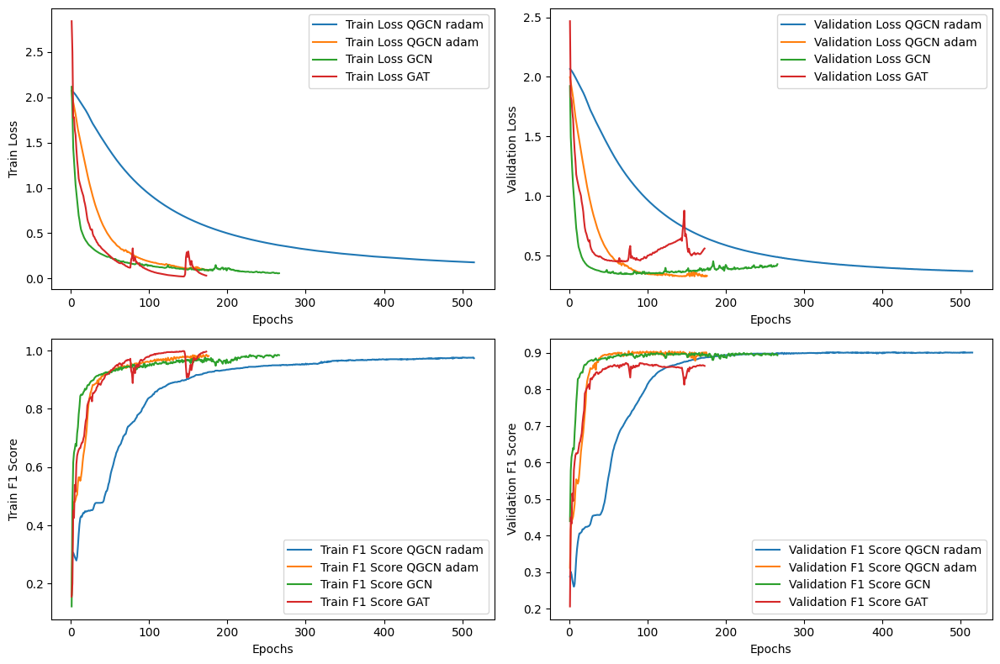

Resultados finales del modelo QGCN radam:
Conjunto de validación - Pérdida (Loss): 0.3936, Precisión (Accuracy): 0.9019, Puntuación F1 (F1 Score): 0.9019
Conjunto de prueba - Pérdida (Loss): 0.3532, Precisión (Accuracy): 0.9207, Puntuación F1 (F1 Score): 0.9207


Resultados finales del modelo QGCN adam:
Conjunto de validación - Pérdida (Loss): 0.3953, Precisión (Accuracy): 0.9047, Puntuación F1 (F1 Score): 0.9047
Conjunto de prueba - Pérdida (Loss): 0.3556, Precisión (Accuracy): 0.9199, Puntuación F1 (F1 Score): 0.9199


Resultados finales del modelo GCN:
Conjunto de validación - Pérdida (Loss): 0.3763, Precisión (Accuracy): 0.8999, Puntuación F1 (F1 Score): 0.8999
Conjunto de prueba - Pérdida (Loss): 0.3118, Precisión (Accuracy): 0.9146, Puntuación F1 (F1 Score): 0.9146


Resultados finales del modelo GAT:
Conjunto de validación - Pérdida (Loss): 0.4549, Precisión (Accuracy): 0.8721, Puntuación F1 (F1 Score): 0.8721
Conjunto de prueba - Pérdida (Loss): 0.4021, Precisión (Accuracy): 0.

In [ ]:
log_files = [
    "/content/logs/nc/2024_7_9/3/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/9/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/10/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/11/log.txt"
]

# Nombres de los modelos
model_names = ["QGCN radam", "QGCN adam", "GCN", "GAT"]

# Comparar modelos
compare_models_nc(log_files, model_names)

**Airport**

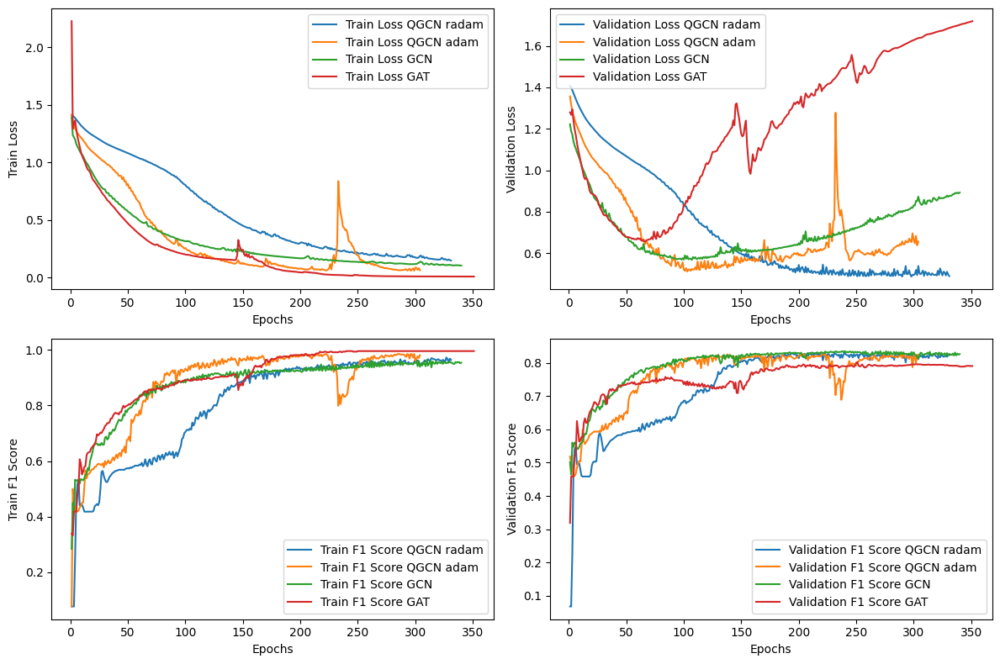

Resultados finales del modelo QGCN radam:
Conjunto de validación - Pérdida (Loss): 0.508, Precisión (Accuracy): 0.8306, Puntuación F1 (F1 Score): 0.8306
Conjunto de prueba - Pérdida (Loss): 0.5558, Precisión (Accuracy): 0.8138, Puntuación F1 (F1 Score): 0.8138


Resultados finales del modelo QGCN adam:
Conjunto de validación - Pérdida (Loss): 0.589, Precisión (Accuracy): 0.8266, Puntuación F1 (F1 Score): 0.8266
Conjunto de prueba - Pérdida (Loss): 0.6967, Precisión (Accuracy): 0.7782, Puntuación F1 (F1 Score): 0.7782


Resultados finales del modelo GCN:
Conjunto de validación - Pérdida (Loss): 0.7073, Precisión (Accuracy): 0.8351, Puntuación F1 (F1 Score): 0.8351
Conjunto de prueba - Pérdida (Loss): 0.8362, Precisión (Accuracy): 0.818, Puntuación F1 (F1 Score): 0.818


Resultados finales del modelo GAT:
Conjunto de validación - Pérdida (Loss): 1.4215, Precisión (Accuracy): 0.802, Puntuación F1 (F1 Score): 0.802
Conjunto de prueba - Pérdida (Loss): 1.7189, Precisión (Accuracy): 0.7929, 

In [ ]:
log_files = [
    "/content/logs/nc/2024_7_9/4/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/12/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/13/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/14/log.txt"
]

# Nombres de los modelos
model_names = ["QGCN radam", "QGCN adam", "GCN", "GAT"]

# Comparar modelos
compare_models_nc(log_files, model_names)

**PPI**

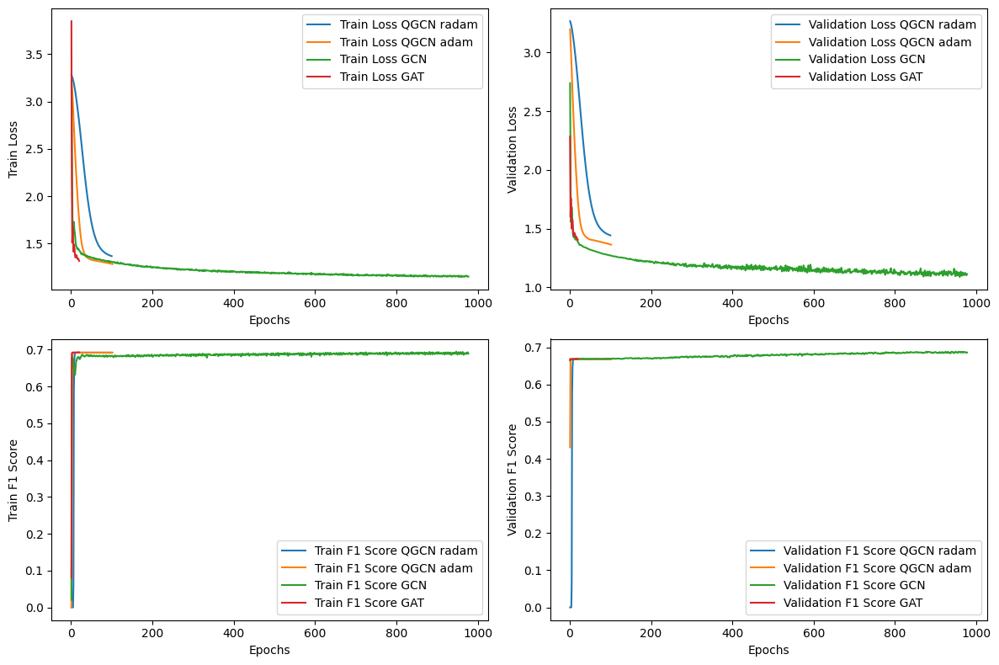

Resultados finales del modelo QGCN radam:
Conjunto de validación - Pérdida (Loss): 3.0928, Precisión (Accuracy): 0.6684, Puntuación F1 (F1 Score): 0.6684
Conjunto de prueba - Pérdida (Loss): 3.0932, Precisión (Accuracy): 0.6736, Puntuación F1 (F1 Score): 0.6736


Resultados finales del modelo QGCN adam:
Conjunto de validación - Pérdida (Loss): 3.1213, Precisión (Accuracy): 0.6684, Puntuación F1 (F1 Score): 0.6684
Conjunto de prueba - Pérdida (Loss): 3.1217, Precisión (Accuracy): 0.6736, Puntuación F1 (F1 Score): 0.6736


Resultados finales del modelo GCN:
Conjunto de validación - Pérdida (Loss): 1.0975, Precisión (Accuracy): 0.6888, Puntuación F1 (F1 Score): 0.6888
Conjunto de prueba - Pérdida (Loss): 1.0566, Precisión (Accuracy): 0.6986, Puntuación F1 (F1 Score): 0.6986


Resultados finales del modelo GAT:
Conjunto de validación - Pérdida (Loss): 1.5497, Precisión (Accuracy): 0.6692, Puntuación F1 (F1 Score): 0.6692
Conjunto de prueba - Pérdida (Loss): 1.5303, Precisión (Accuracy): 0.

In [ ]:
log_files = [
    "/content/logs/nc/2024_7_9/6/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/15/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/16/log.txt",
    "/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/17/log.txt"
]

# Nombres de los modelos
model_names = ["QGCN radam", "QGCN adam", "GCN", "GAT"]

# Comparar modelos
compare_models_nc(log_files, model_names)

**Resultados finales**

In [ ]:
# Crear la tabla de resultados
results_df = create_results_nc_table()

# Mostrar la tabla de resultados
print(results_df)

       Dataset Model  Validation Loss  Validation Accuracy  Validation F1  \
0         cora  QGCN           1.4989               0.7880         0.7880   
1         cora   GCN           0.7143               0.7900         0.7900   
2         cora   GAT           0.9053               0.8060         0.8060   
3     citeseer  QGCN           1.6086               0.6940         0.6940   
4     citeseer   GCN           1.1756               0.6980         0.6980   
5     citeseer   GAT           1.0187               0.7100         0.7100   
6   disease_nc  QGCN           0.2678               0.9427         0.8615   
7   disease_nc   GCN           0.1734               0.9459         0.8741   
8   disease_nc   GAT           2.3119               0.7803         0.0000   
9        photo  QGCN           0.3953               0.9047         0.9047   
10       photo   GCN           0.3763               0.8999         0.8999   
11       photo   GAT           0.4549               0.8721         0.8721   

### Visualización de embeddings

#### Instalación de librerías y funciones auxiliares

In [ ]:
!pip install umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 6.8 MB/s eta 0:00:00


In [ ]:
!apt-get install imagemagick

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fonts-droid-fallback fonts-noto-mono fonts-urw-base35 ghostscript gsfonts imagemagick-6-common
  imagemagick-6.q16 libdjvulibre-text libdjvulibre21 libfftw3-double3 libgs9 libgs9-common libidn12
  libijs-0.35 libjbig2dec0 libjxr-tools libjxr0 liblqr-1-0 libmagickcore-6.q16-6
  libmagickcore-6.q16-6-extra libmagickwand-6.q16-6 libnetpbm10 libwmflite-0.2-7 netpbm
  poppler-data
Suggested packages:
  fonts-noto fonts-freefont-otf | fonts-freefont-ttf fonts-texgyre ghostscript-x imagemagick-doc
  autotrace cups-bsd | lpr | lprng enscript gimp gnuplot grads hp2xx html2ps libwmf-bin mplayer
  povray radiance sane-utils texlive-base-bin transfig ufraw-batch libfftw3-bin libfftw3-dev
  inkscape poppler-utils fonts-japanese-mincho | fonts-ipafont-mincho fonts-japanese-gothic
  | fonts-ipafont-gothic fonts-arphic-ukai fonts-arphic-uming fonts-nan

Funciones para cargar los datos

In [ ]:
import os
import sys
import pickle as pkl
import numpy as np
import scipy.sparse as sp
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler, normalize

from mpl_toolkits.mplot3d import Axes3D
import networkx as nx
import torch
import umap
from sklearn.decomposition import PCA

def parse_index_file(filename):
    index = []
    for line in open(filename):
        index.append(int(line.strip()))
    return index

def load_citation_data(dataset_str, data_path, split_seed=None):
    names = ['x', 'y', 'tx', 'ty', 'allx', 'ally', 'graph']
    objects = []
    for i in range(len(names)):
        with open(os.path.join(data_path, "ind.{}.{}".format(dataset_str, names[i])), 'rb') as f:
            if sys.version_info > (3, 0):
                objects.append(pkl.load(f, encoding='latin1'))
            else:
                objects.append(pkl.load(f))

    x, y, tx, ty, allx, ally, graph = tuple(objects)
    test_idx_reorder = parse_index_file(os.path.join(data_path, "ind.{}.test.index".format(dataset_str)))
    test_idx_range = np.sort(test_idx_reorder)

    if dataset_str == 'citeseer':
        # Fix citeseer dataset (there are some isolated nodes in the graph)
        # Find isolated nodes, add them as zero-vecs into the right position
        test_idx_range_full = range(min(test_idx_reorder), max(test_idx_reorder) + 1)
        tx_extended = sp.lil_matrix((len(test_idx_range_full), x.shape[1]))
        tx_extended[test_idx_range - min(test_idx_range), :] = tx
        tx = tx_extended
        ty_extended = np.zeros((len(test_idx_range_full), y.shape[1]))
        ty_extended[test_idx_range - min(test_idx_range), :] = ty
        ty = ty_extended

    features = sp.vstack((allx, tx)).tolil()
    features[test_idx_reorder, :] = features[test_idx_range, :]

    labels = np.vstack((ally, ty))
    labels[test_idx_reorder, :] = labels[test_idx_range, :]
    labels = np.argmax(labels, 1)

    idx_test = test_idx_range.tolist()
    idx_train = list(range(len(y)))
    idx_val = range(len(y), len(y) + 500)

    adj = nx.adjacency_matrix(nx.from_dict_of_lists(graph))

    rand_feature = np.random.uniform(low=-0.01, high=0.01, size=(adj.shape[0],features.shape[1]))
    features = features + sp.csr_matrix(rand_feature)
    return adj, features, labels, idx_train, idx_val, idx_test

In [ ]:
def load_synthetic_data(dataset_str, use_feats, data_path):
    object_to_idx = {}
    idx_counter = 0
    edges = []
    with open(os.path.join(data_path, "{}.edges.csv".format(dataset_str)), 'r') as f:
        all_edges = f.readlines()
    for line in all_edges:
        n1, n2 = line.rstrip().split(',')
        if n1 in object_to_idx:
            i = object_to_idx[n1]
        else:
            i = idx_counter
            object_to_idx[n1] = i
            idx_counter += 1
        if n2 in object_to_idx:
            j = object_to_idx[n2]
        else:
            j = idx_counter
            object_to_idx[n2] = j
            idx_counter += 1
        edges.append((i, j))
    adj = np.zeros((len(object_to_idx), len(object_to_idx)))
    for i, j in edges:
        adj[i, j] = 1.  # comment this line for directed adjacency matrix
        adj[j, i] = 1.
    if use_feats:
        features = sp.load_npz(os.path.join(data_path, "{}.feats.npz".format(dataset_str)))
    else:
        features = sp.eye(adj.shape[0])
    if dataset_str in ['tree_cycle','tree_grid','ba_shape']:
        import pandas as pd
        labels = pd.read_csv(os.path.join(data_path, "{}.label.csv".format(dataset_str))).values[:,0]
        print(labels.shape)
    else:
        labels = np.load(os.path.join(data_path, "{}.labels.npy".format(dataset_str)))
    return sp.csr_matrix(adj), features, labels


In [ ]:
def bin_feat(labels, bins):
    return np.digitize(labels, bins)

def load_airport(dataset_str, data_path, return_label=False):
    graph = pkl.load(open(os.path.join(data_path, dataset_str + '.p'), 'rb'))
    adj = nx.adjacency_matrix(graph)
    features = np.array([graph.nodes[u]['feat'] for u in graph.nodes()])
    if return_label:
        label_idx = 4
        labels = features[:, label_idx]
        features = features[:, :label_idx]
        labels = bin_feat(labels, bins=[7.0/7, 8.0/7, 9.0/7])
        return sp.csr_matrix(adj), features, labels
    else:
        return sp.csr_matrix(adj), features

Proyección esférica

In [ ]:
import seaborn as sns

def spherical_projection(embeddings, labels, method='PCA', title=''):
    # Normalizar los datos
    scaler = StandardScaler()
    embeddings_normalized = scaler.fit_transform(embeddings)

    if method == 'PCA':
        reducer = PCA(n_components=3)
    elif method == 't-SNE':
        reducer = TSNE(n_components=3)
    elif method == 'UMAP':
        reducer = umap.UMAP(n_components=3)

    embeddings_3d = reducer.fit_transform(embeddings)
    title = f'Proyección Esférica usando {method}'

    # Normalizar para proyectar en una esfera
    embeddings_spherical = normalize(embeddings_3d)

    # Obtener colores consistentes
    colors = get_colors(labels)

    # Visualizar la proyección esférica desde dos ángulos opuestos
    fig = plt.figure(figsize=(12, 6))

    ax = fig.add_subplot(121, projection='3d')
    sc = ax.scatter(embeddings_spherical[:, 0], embeddings_spherical[:, 1], embeddings_spherical[:, 2], c=colors, s=5)
    ax.view_init(elev=10, azim=45)
    ax.set_title(title + ' (vista 1)')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])

    ax = fig.add_subplot(122, projection='3d')
    sc = ax.scatter(embeddings_spherical[:, 0], embeddings_spherical[:, 1], embeddings_spherical[:, 2], c=colors, s=5)
    ax.view_init(elev=10, azim=225)  # Vista opuesta
    ax.set_title(title + ' (vista 2)')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])

    plt.show()

Proyección 2D

In [ ]:
def plot_2d_projections(embeddings, labels, method='t-SNE', title=''):
    # Normalizar los datos
    scaler = StandardScaler()
    embeddings_normalized = scaler.fit_transform(embeddings)

    if method == 't-SNE':
        reducer = TSNE(n_components=2)
    elif method == 'UMAP':
        reducer = umap.UMAP(n_components=2)
    elif method == 'PCA':
        reducer = PCA(n_components=2)


    embeddings_2d = reducer.fit_transform(embeddings)

    # Obtener colores consistentes
    colors = get_colors(labels)

    plt.figure(figsize=(8, 6))
    plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=colors, s=10)
    plt.title(f'{title} usando {method}')
    plt.xticks([])
    plt.yticks([])

    plt.show()




Proyección esférica GIF

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.manifold import TSNE
import umap
import seaborn as sns

def spherical_projection_gif(embeddings, labels, method='PCA', title=''):
    # Normalizar los datos
    scaler = StandardScaler()
    embeddings_normalized = scaler.fit_transform(embeddings)

    if method == 'PCA':
        reducer = PCA(n_components=3)
    elif method == 't-SNE':
        reducer = TSNE(n_components=3)
    elif method == 'UMAP':
        reducer = umap.UMAP(n_components=3)

    embeddings_3d = reducer.fit_transform(embeddings)
    title = f'Proyección Esférica de {title} usando {method}'

    # Normalizar para proyectar en una esfera
    embeddings_spherical = normalize(embeddings_3d)

    # Obtener colores consistentes
    colors = get_colors(labels)

    # Crear la figura y el eje 3D
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    sc = ax.scatter(embeddings_spherical[:, 0], embeddings_spherical[:, 1], embeddings_spherical[:, 2], c=colors, s=5)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    ax.set_title(title)

    def update(frame):
        ax.view_init(elev=10, azim=frame)
        return fig,

    ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=100)

    ani.save('/content/' + title.replace(' ', '_') + '.gif', writer='imagemagick')

#### Visualizaciones

##### Citeseer

In [ ]:
# Cargar los datos de Cora
dataset_str = 'citeseer'
data_path = '/content/GCN-Pseudo-Riemannian-Manifold/data/citeseer/'
adj, features, labels, idx_train, idx_val, idx_test = load_citation_data(dataset_str, data_path)

# Cargar los embeddings aprendidos
embeddings_QGCN = np.load('/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_3/1/embeddings.npy')
embeddings_GCN = np.load('/content/GCN-Pseudo-Riemannian-Manifold/logs/lp/2024_7_2/4/embeddings.npy')

<ipython-input-8-bc16d8ba2db3>:28: DeprecationWarning: Please use `csr_matrix` from the `scipy.sparse` namespace, the `scipy.sparse.csr` namespace is deprecated.
  objects.append(pkl.load(f, encoding='latin1'))


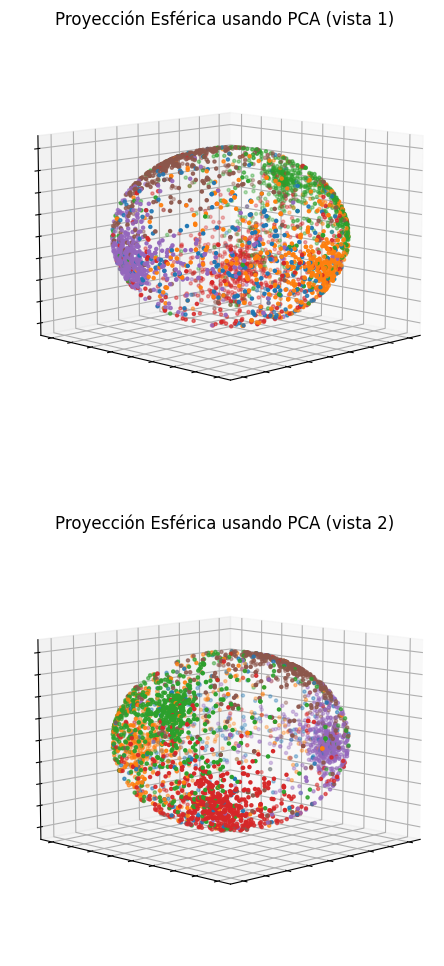

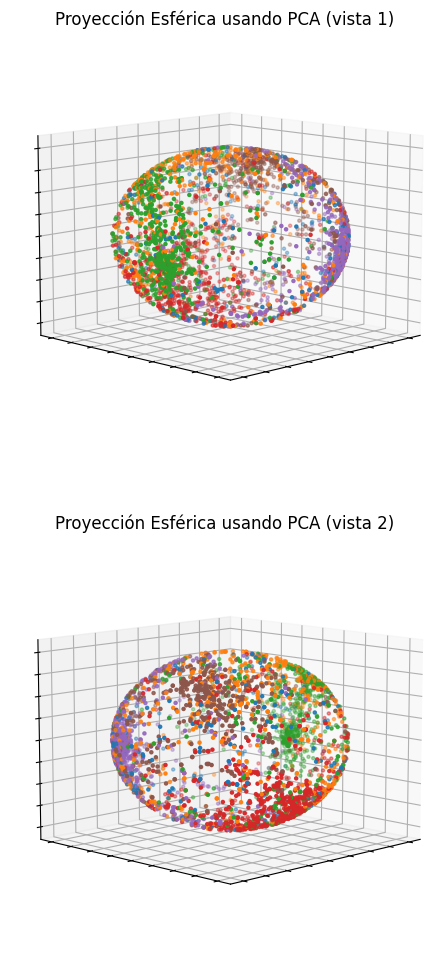

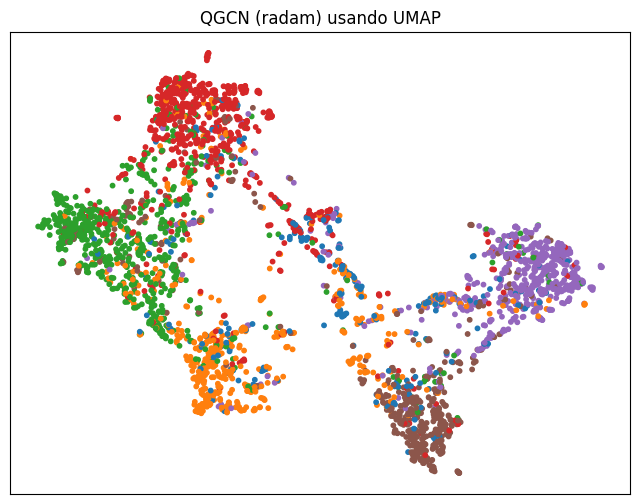

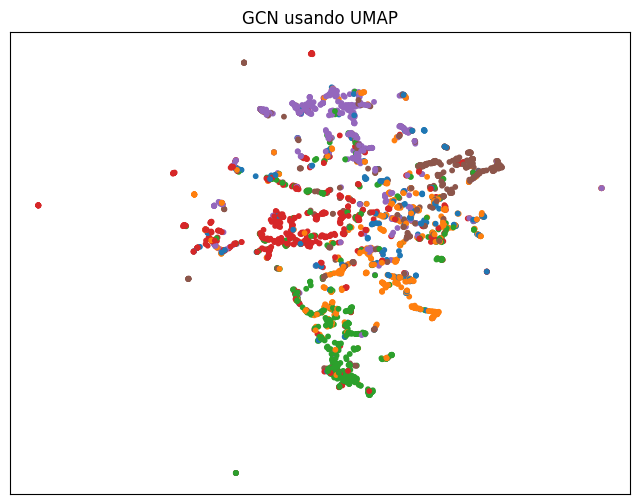

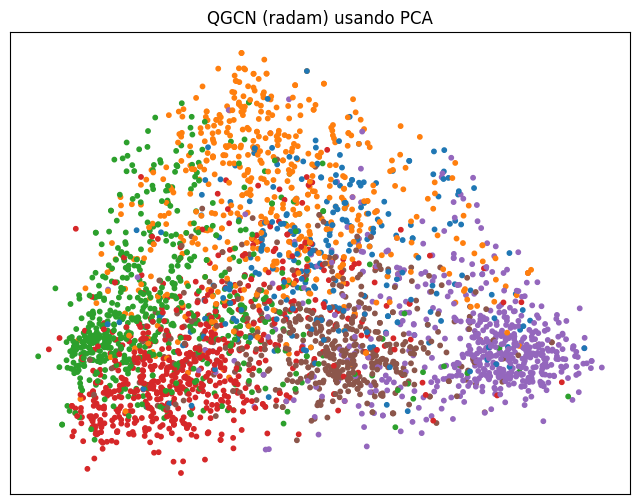

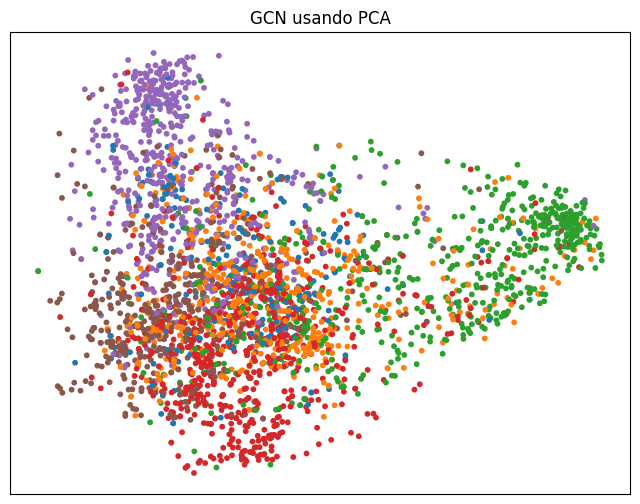

In [ ]:
# Definir una paleta de colores consistente
palette = sns.color_palette("tab10", len(np.unique(labels)))
palette_dict = {i: palette[i] for i in range(len(palette))}

# Función para aplicar la paleta de colores
def get_colors(labels):
    return [palette_dict[label] for label in labels]

# Comparar proyecciones para QGCN
spherical_projection(embeddings_QGCN, labels, method='PCA', title='QGCN (radam) usando PCA')

# Comparar proyecciones para GCN
spherical_projection(embeddings_GCN, labels, method='PCA', title='GCN usando PCA')


# Comparar proyecciones en 2D para QGCN y GCN usando UMAP
plot_2d_projections(embeddings_QGCN, labels, method='UMAP', title='QGCN (radam)')
plot_2d_projections(embeddings_GCN, labels, method='UMAP', title='GCN')
plot_2d_projections(embeddings_QGCN, labels, method='PCA', title='QGCN (radam)')
plot_2d_projections(embeddings_GCN, labels, method='PCA', title='GCN')

Hacer un GIF de las proyecciones esféricas

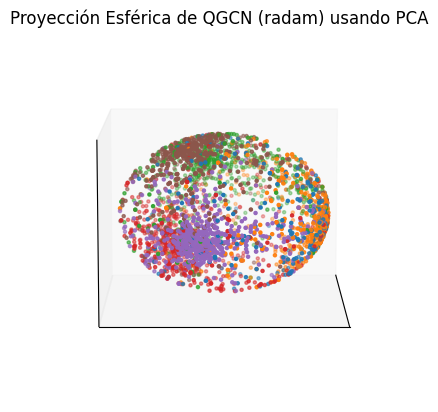

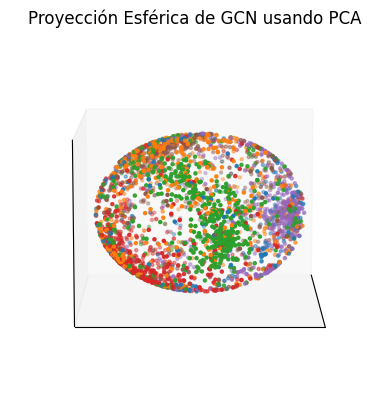

In [ ]:
spherical_projection_gif(embeddings_QGCN, labels, method='PCA', title='QGCN (radam)')

spherical_projection_gif(embeddings_GCN, labels, method='PCA', title='GCN')

##### Disease NC

In [ ]:
dataset_str = 'disease_nc'
data_path = '/content/GCN-Pseudo-Riemannian-Manifold/data/disease_nc/'
adj, features, labels = load_synthetic_data(dataset_str, True, data_path)

# Cargar los embeddings aprendidos
embeddings_QGCN = np.load('/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_3/2/embeddings.npy')
embeddings_GCN = np.load('/content/GCN-Pseudo-Riemannian-Manifold/logs/nc/2024_7_2/7/embeddings.npy')

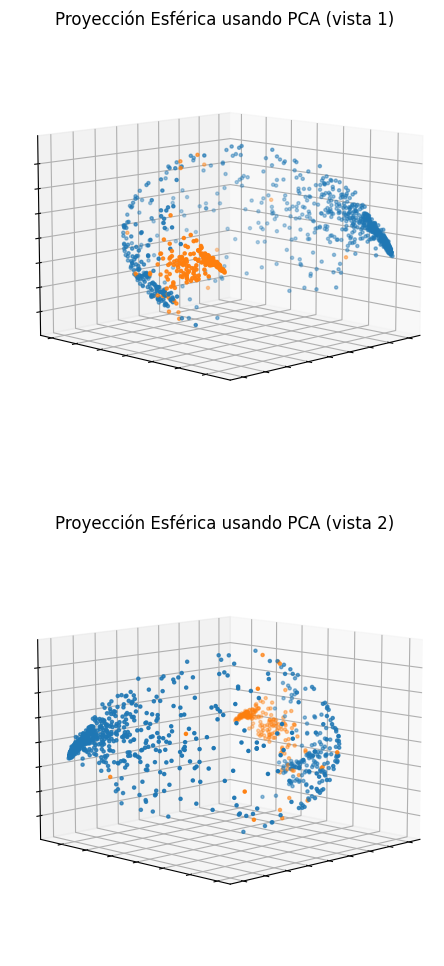

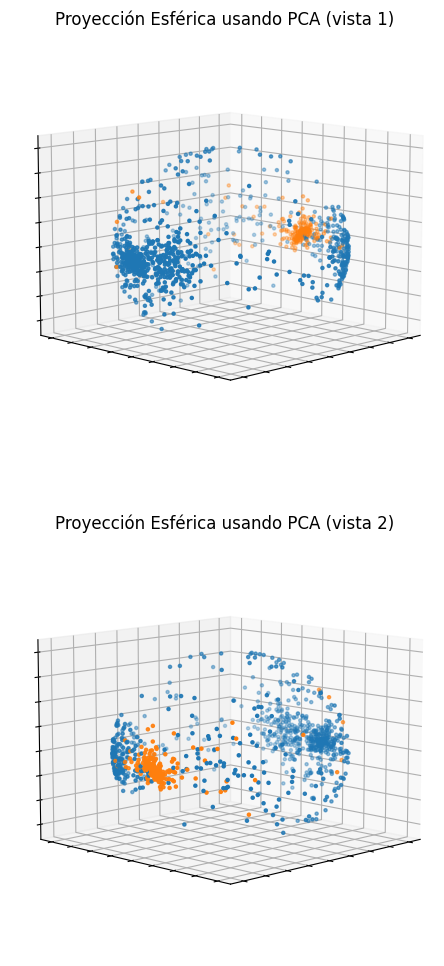

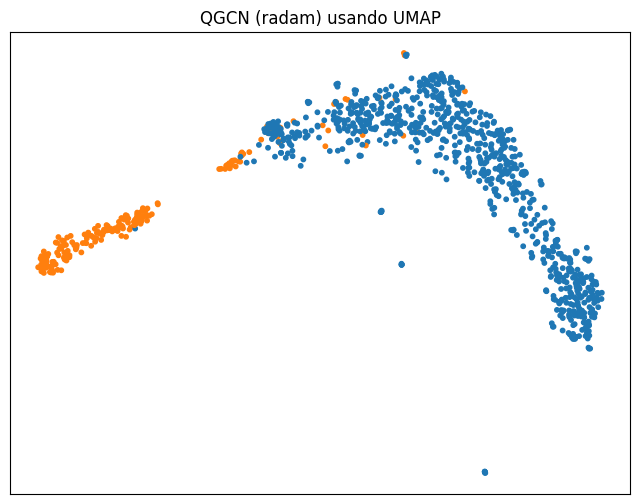

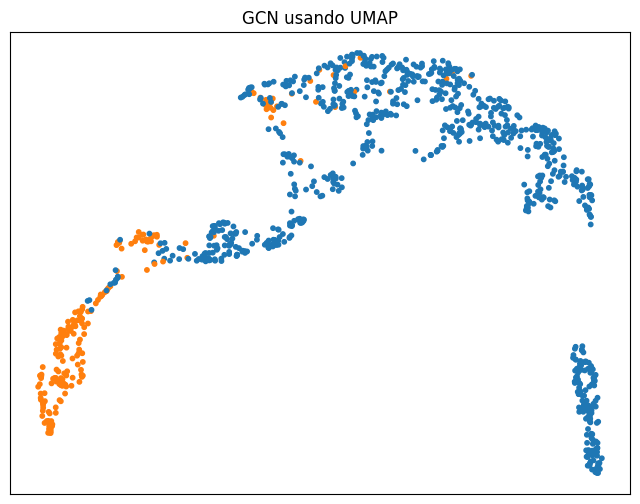

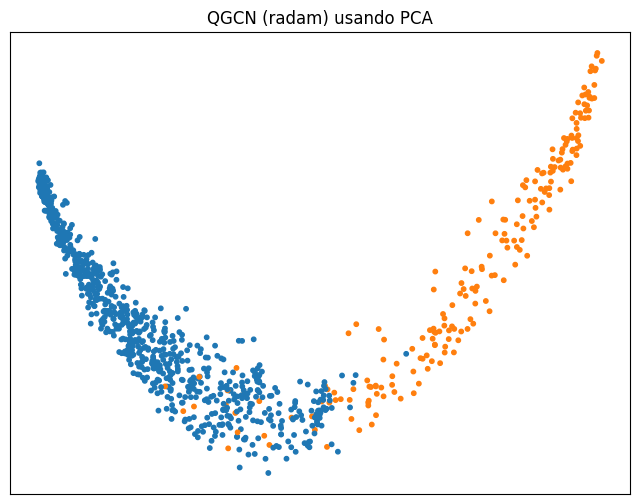

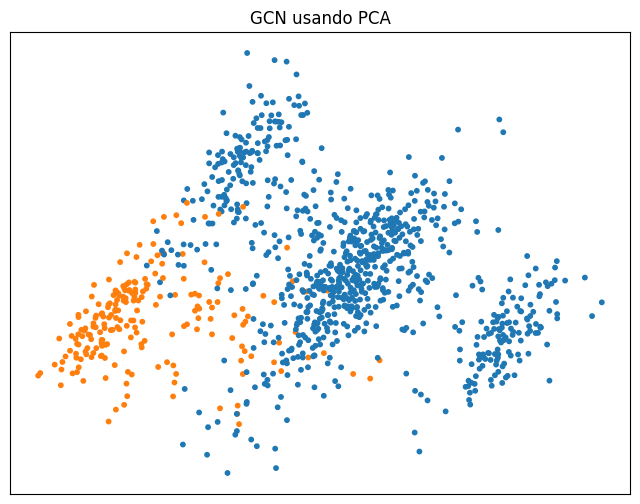

In [ ]:
# Definir una paleta de colores consistente
palette = sns.color_palette("tab10", len(np.unique(labels)))
palette_dict = {i: palette[i] for i in range(len(palette))}

# Función para aplicar la paleta de colores
def get_colors(labels):
    return [palette_dict[label] for label in labels]

# Comparar proyecciones para QGCN
spherical_projection(embeddings_QGCN, labels, method='PCA', title='QGCN (radam) usando PCA')

# Comparar proyecciones para GCN
spherical_projection(embeddings_GCN, labels, method='PCA', title='GCN usando PCA')


# Comparar proyecciones en 2D para QGCN y GCN usando UMAP
plot_2d_projections(embeddings_QGCN, labels, method='UMAP', title='QGCN (radam)')
plot_2d_projections(embeddings_GCN, labels, method='UMAP', title='GCN')
plot_2d_projections(embeddings_QGCN, labels, method='PCA', title='QGCN (radam)')
plot_2d_projections(embeddings_GCN, labels, method='PCA', title='GCN')

Hacer un GIF de las proyecciones esféricas

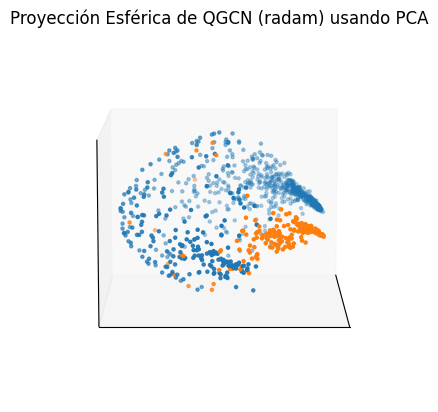

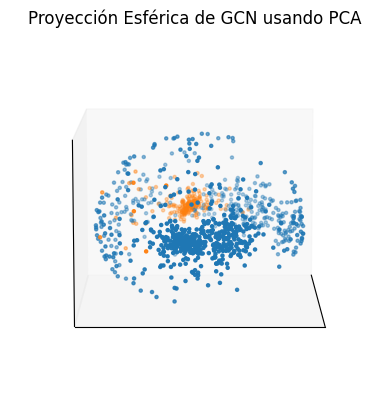

In [ ]:
spherical_projection_gif(embeddings_QGCN, labels, method='PCA', title='QGCN (radam)')

spherical_projection_gif(embeddings_GCN, labels, method='PCA', title='GCN')